In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
df = pd.read_csv('zillow_data.csv')
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [2]:
len(df)

14723

In [3]:
df['State'].value_counts()

CA    1224
NY    1015
TX     989
PA     831
FL     785
OH     588
IL     547
NJ     502
MI     499
NC     428
IN     428
MA     417
TN     404
VA     401
MN     375
GA     345
WA     341
WI     332
MO     319
MD     317
CO     249
KS     241
AZ     230
OR     224
OK     221
SC     206
NH     199
LA     193
AL     183
IA     158
MS     153
KY     139
CT     124
UT     121
ID     110
AR     105
NV     103
ME      86
NE      83
WV      72
MT      71
HI      62
NM      60
RI      59
DE      41
ND      31
WY      31
AK      28
SD      19
DC      18
VT      16
Name: State, dtype: int64

In [4]:
df_texas = df[df['State']=='TX']
df_texas

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500
5,91733,77084,Houston,TX,Houston,Harris,6,95000.0,95200.0,95400.0,...,157900,158700,160200,161900,162800,162800,162800,162900,163500,164300
8,91940,77449,Katy,TX,Houston,Harris,9,95400.0,95600.0,95800.0,...,166800,167400,168400,169600,170900,172300,173300,174200,175400,176200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14372,91640,76941,Mertzon,TX,San Angelo,Irion,14373,NaN,NaN,NaN,...,122500,121800,121600,122200,123500,124700,124300,122600,121600,121600
14472,92897,79313,Anton,TX,Levelland,Hockley,14473,NaN,NaN,NaN,...,55400,56300,55700,56300,58900,61500,63000,63600,63500,63300
14492,92921,79355,Plains,TX,NaN,Yoakum,14493,NaN,NaN,NaN,...,100500,100500,101000,100700,99700,97700,95800,94600,94000,93500
14599,92929,79366,Ransom Canyon,TX,Lubbock,Lubbock,14600,134500.0,134500.0,134400.0,...,252100,251600,251600,251500,251300,251500,251700,252500,255000,257500


In [5]:
print('number of counties: ' + str(len(df_texas['CountyName'].unique())))
df_texas_counties = df_texas['CountyName'].unique()
df_texas_counties_num_zips = df_texas['CountyName'].value_counts()
df_texas_counties_num_zips

number of counties: 174


Harris         121
Dallas          70
Tarrant         59
Bexar           55
Travis          45
              ... 
Bailey           1
Young            1
Crosby           1
Shackelford      1
Stephens         1
Name: CountyName, Length: 174, dtype: int64

In [6]:
def prep_data(data_frame, to_drop_list):
    import pandas as pd
    data_frames = []
    zip_codes = []
    for i in range(0, len(data_frame)):
        one_data_frame = pd.DataFrame()
        one_data_frame['Price'] = data_frame.iloc[i,:]
        print(str(i+1) + ' of ' + str(len(data_frame)) + ' parsed')
        zip_code = one_data_frame.loc['RegionName']
        one_data_frame = one_data_frame.drop(to_drop_list)
        one_data_frame.index = pd.to_datetime(one_data_frame.index)
        one_data_frame.plot(title=int(zip_code))
        data_frames.append(one_data_frame)
        zip_codes.append(zip_code)
    return data_frames, zip_codes

In [7]:
to_drop = ['RegionID', 'City', 'State', 'RegionName', 'Metro', 'CountyName', 'SizeRank']

1 of 121 parsed
2 of 121 parsed
3 of 121 parsed
4 of 121 parsed
5 of 121 parsed
6 of 121 parsed
7 of 121 parsed
8 of 121 parsed
9 of 121 parsed
10 of 121 parsed
11 of 121 parsed
12 of 121 parsed
13 of 121 parsed
14 of 121 parsed
15 of 121 parsed
16 of 121 parsed
17 of 121 parsed
18 of 121 parsed
19 of 121 parsed
20 of 121 parsed
21 of 121 parsed
22 of 121 parsed
23 of 121 parsed
24 of 121 parsed
25 of 121 parsed
26 of 121 parsed
27 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

28 of 121 parsed
29 of 121 parsed
30 of 121 parsed
31 of 121 parsed
32 of 121 parsed
33 of 121 parsed
34 of 121 parsed
35 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

36 of 121 parsed
37 of 121 parsed
38 of 121 parsed
39 of 121 parsed
40 of 121 parsed
41 of 121 parsed
42 of 121 parsed
43 of 121 parsed
44 of 121 parsed

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene


45 of 121 parsed
46 of 121 parsed
47 of 121 parsed
48 of 121 parsed
49 of 121 parsed
50 of 121 parsed
51 of 121 parsed
52 of 121 parsed
53 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

54 of 121 parsed
55 of 121 parsed
56 of 121 parsed
57 of 121 parsed
58 of 121 parsed
59 of 121 parsed
60 of 121 parsed
61 of 121 parsed

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene


62 of 121 parsed
63 of 121 parsed
64 of 121 parsed
65 of 121 parsed
66 of 121 parsed
67 of 121 parsed
68 of 121 parsed
69 of 121 parsed
70 of 121 parsed

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene


71 of 121 parsed
72 of 121 parsed
73 of 121 parsed
74 of 121 parsed
75 of 121 parsed
76 of 121 parsed
77 of 121 parsed
78 of 121 parsed
79 of 121 parsed
80 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

81 of 121 parsed
82 of 121 parsed
83 of 121 parsed
84 of 121 parsed
85 of 121 parsed
86 of 121 parsed
87 of 121 parsed
88 of 121 parsed
89 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

90 of 121 parsed
91 of 121 parsed
92 of 121 parsed
93 of 121 parsed
94 of 121 parsed
95 of 121 parsed
96 of 121 parsed
97 of 121 parsed
98 of 121 parsed

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene


99 of 121 parsed
100 of 121 parsed
101 of 121 parsed
102 of 121 parsed
103 of 121 parsed
104 of 121 parsed
105 of 121 parsed
106 of 121 parsed
107 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

108 of 121 parsed
109 of 121 parsed
110 of 121 parsed
111 of 121 parsed
112 of 121 parsed
113 of 121 parsed
114 of 121 parsed
115 of 121 parsed
116 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

117 of 121 parsed
118 of 121 parsed
119 of 121 parsed
120 of 121 parsed
121 of 121 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

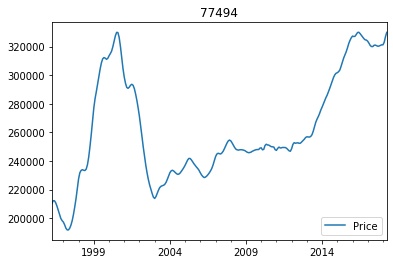

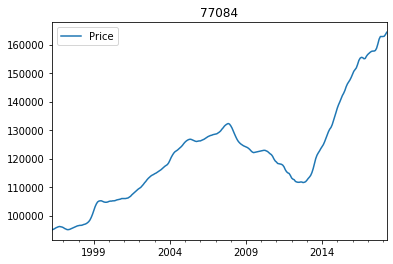

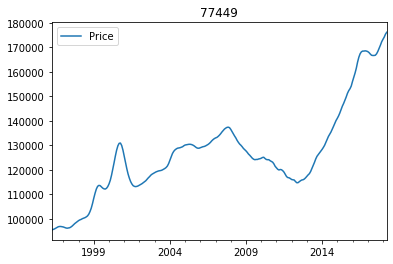

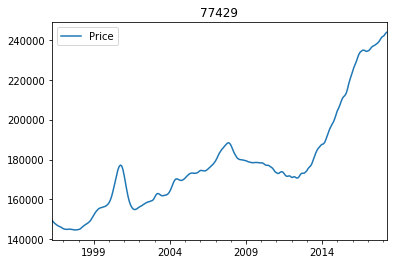

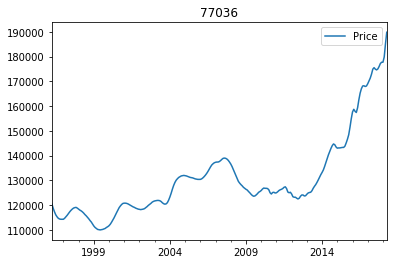

...

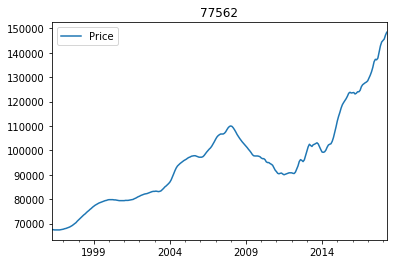

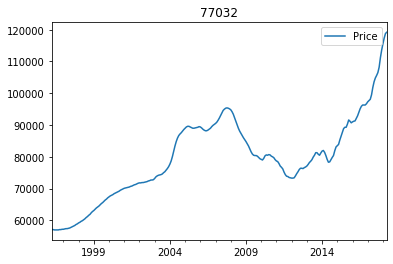

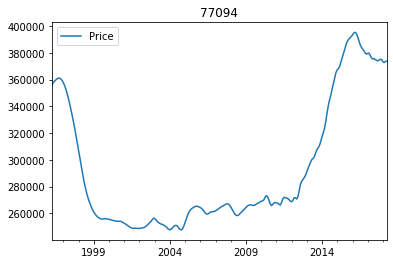

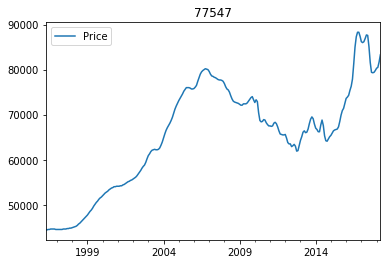

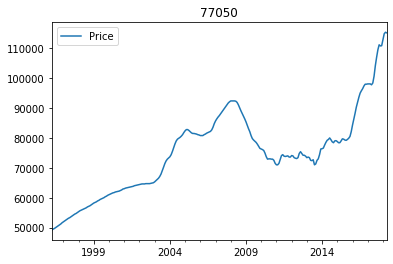

In [8]:
harris_data, harris_zip_codes = prep_data(df_texas[df_texas['CountyName']=='Harris'], to_drop)

1 of 59 parsed
2 of 59 parsed
3 of 59 parsed
4 of 59 parsed
5 of 59 parsed
6 of 59 parsed
7 of 59 parsed
8 of 59 parsed
9 of 59 parsed
10 of 59 parsed
11 of 59 parsed
12 of 59 parsed
13 of 59 parsed
14 of 59 parsed
15 of 59 parsed
16 of 59 parsed
17 of 59 parsed
18 of 59 parsed
19 of 59 parsed
20 of 59 parsed
21 of 59 parsed
22 of 59 parsed
23 of 59 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

24 of 59 parsed
25 of 59 parsed
26 of 59 parsed
27 of 59 parsed
28 of 59 parsed
29 of 59 parsed
30 of 59 parsed
31 of 59 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

32 of 59 parsed
33 of 59 parsed
34 of 59 parsed
35 of 59 parsed
36 of 59 parsed
37 of 59 parsed
38 of 59 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

39 of 59 parsed
40 of 59 parsed
41 of 59 parsed
42 of 59 parsed
43 of 59 parsed
44 of 59 parsed
45 of 59 parsed
46 of 59 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

47 of 59 parsed
48 of 59 parsed
49 of 59 parsed
50 of 59 parsed
51 of 59 parsed
52 of 59 parsed
53 of 59 parsed
54 of 59 parsed
55 of 59 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

56 of 59 parsed
57 of 59 parsed
58 of 59 parsed
59 of 59 parsed


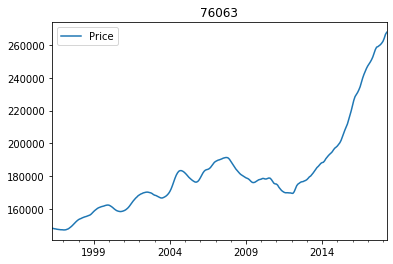

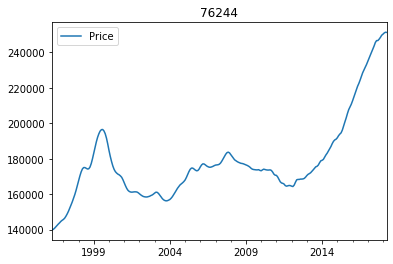

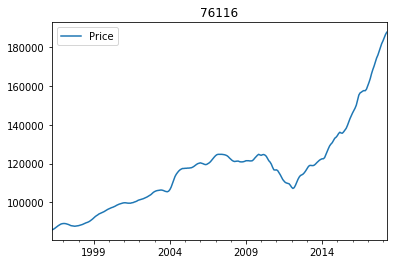

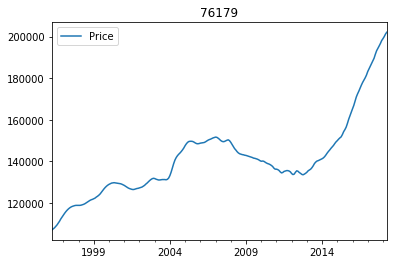

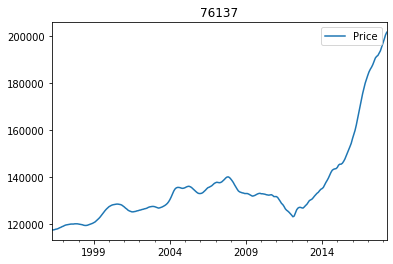

...

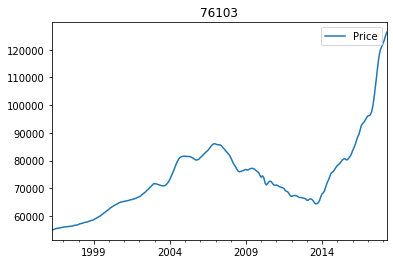

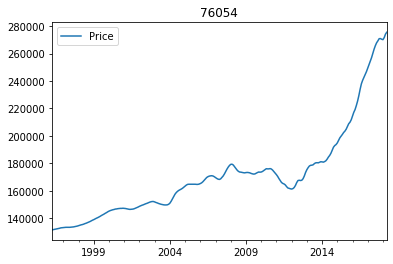

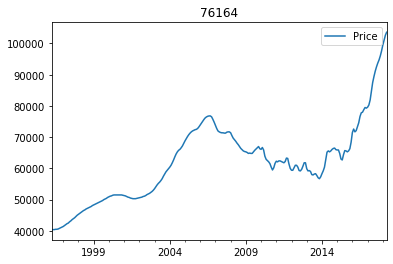

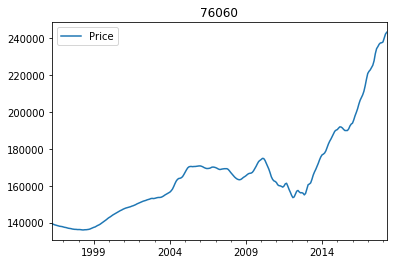

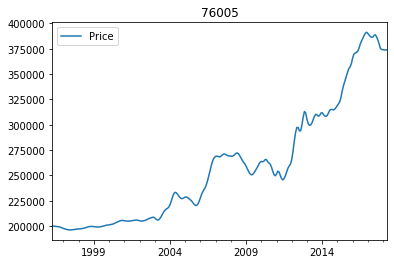

In [10]:
tarrant_data, tarrant_zip_codes = prep_data(df_texas[df_texas['CountyName']=='Tarrant'], to_drop)

1 of 55 parsed
2 of 55 parsed
3 of 55 parsed
4 of 55 parsed
5 of 55 parsed
6 of 55 parsed
7 of 55 parsed
8 of 55 parsed
9 of 55 parsed
10 of 55 parsed
11 of 55 parsed
12 of 55 parsed
13 of 55 parsed
14 of 55 parsed
15 of 55 parsed
16 of 55 parsed
17 of 55 parsed
18 of 55 parsed
19 of 55 parsed
20 of 55 parsed
21 of 55 parsed
22 of 55 parsed
23 of 55 parsed
24 of 55 parsed
25 of 55 parsed
26 of 55 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

27 of 55 parsed
28 of 55 parsed
29 of 55 parsed
30 of 55 parsed
31 of 55 parsed
32 of 55 parsed
33 of 55 parsed
34 of 55 parsed

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene


35 of 55 parsed
36 of 55 parsed
37 of 55 parsed
38 of 55 parsed
39 of 55 parsed
40 of 55 parsed
41 of 55 parsed
42 of 55 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

43 of 55 parsed
44 of 55 parsed
45 of 55 parsed
46 of 55 parsed
47 of 55 parsed
48 of 55 parsed
49 of 55 parsed
50 of 55 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

51 of 55 parsed
52 of 55 parsed
53 of 55 parsed
54 of 55 parsed
55 of 55 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


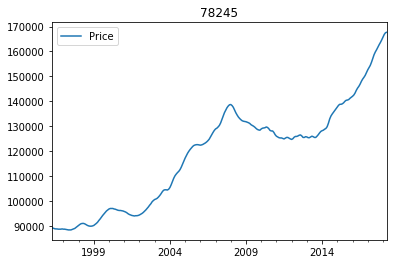

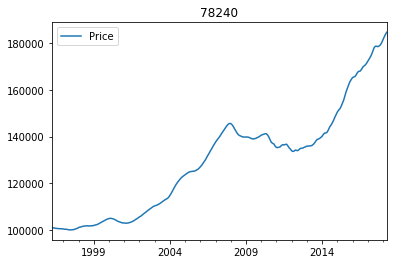

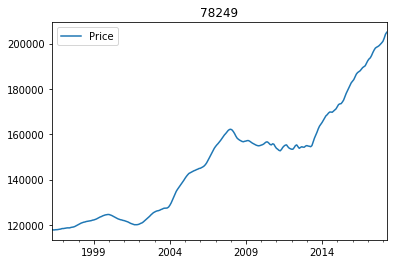

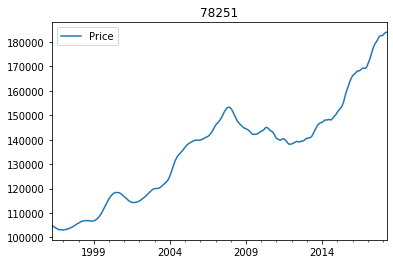

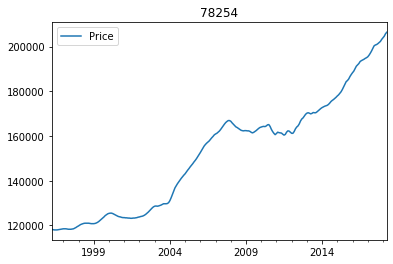

...

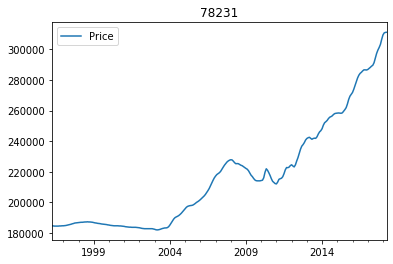

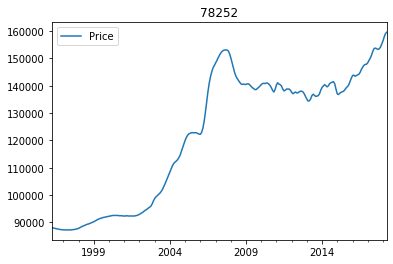

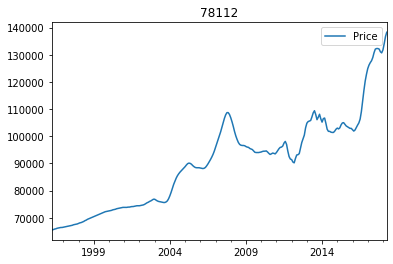

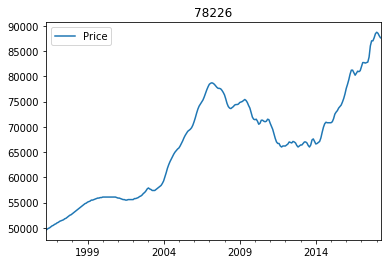

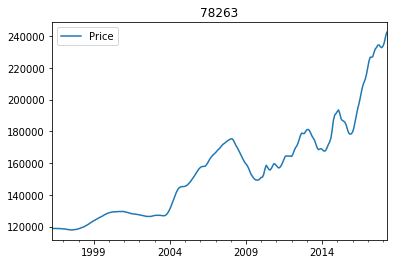

In [11]:
bexar_data, bexar_zip_codes = prep_data(df_texas[df_texas['CountyName']=='Bexar'], to_drop)

1 of 45 parsed
2 of 45 parsed
3 of 45 parsed
4 of 45 parsed
5 of 45 parsed
6 of 45 parsed
7 of 45 parsed
8 of 45 parsed
9 of 45 parsed
10 of 45 parsed
11 of 45 parsed
12 of 45 parsed
13 of 45 parsed
14 of 45 parsed
15 of 45 parsed
16 of 45 parsed
17 of 45 parsed
18 of 45 parsed
19 of 45 parsed
20 of 45 parsed
21 of 45 parsed
22 of 45 parsed
23 of 45 parsed
24 of 45 parsed
25 of 45 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

26 of 45 parsed
27 of 45 parsed
28 of 45 parsed
29 of 45 parsed
30 of 45 parsed
31 of 45 parsed
32 of 45 parsed
33 of 45 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

34 of 45 parsed
35 of 45 parsed
36 of 45 parsed
37 of 45 parsed
38 of 45 parsed
39 of 45 parsed
40 of 45 parsed
41 of 45 parsed
42 of 45 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opene

43 of 45 parsed
44 of 45 parsed
45 of 45 parsed


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pandas\plotting\_matplotlib\core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


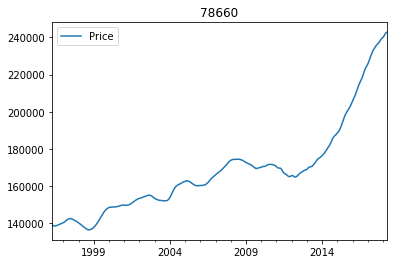

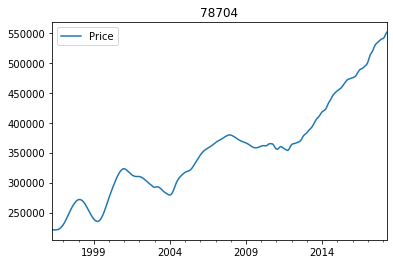

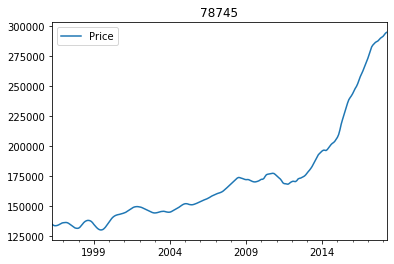

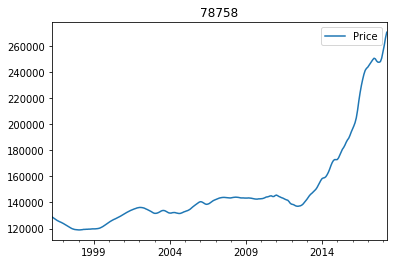

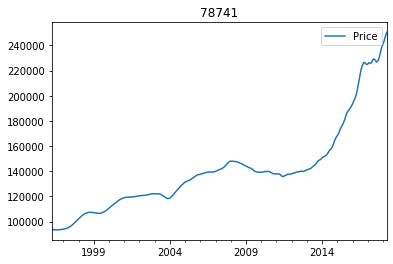

...

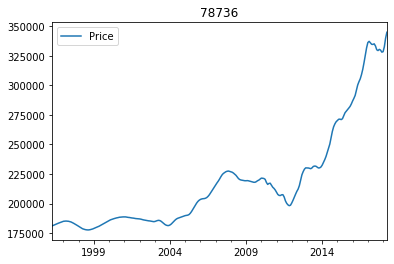

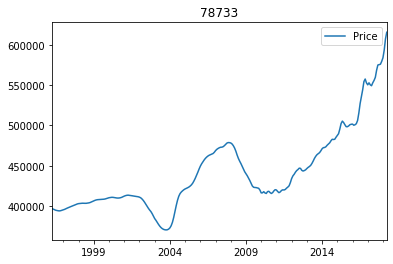

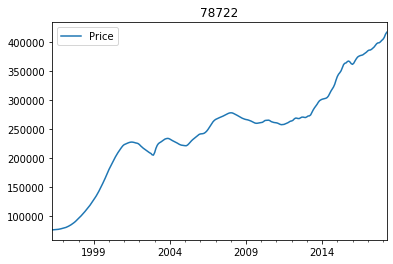

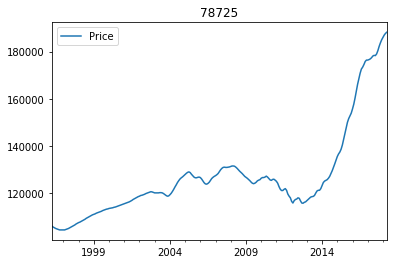

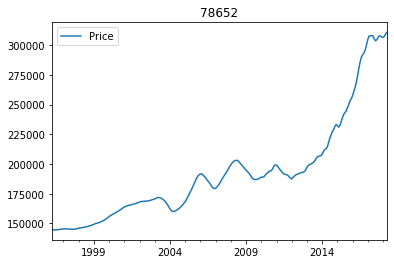

In [12]:
travis_data, travis_zip_codes = prep_data(df_texas[df_texas['CountyName']=='Travis'], to_drop)

ARIMA modeling to account for trend (need to make stationary if going to use ARMA)

In [13]:
def base_model(data):
    import numpy as np
    from statsmodels.tsa.arima_model import ARIMA
    n = len(data)
    base_arima = ARIMA(np.asarray(data), order=(0,1,0)).fit()
    base_arima_forecast = base_arima.forecast(5*12)[0]
    base_arima_aic = base_arima.aic
    base_arima_bic = base_arima.bic
    base_arima_coeff = base_arima.params
    base_arima_pvalues = base_arima.pvalues
#     base_arima_frequncies = print(base_arima.summary().tables[0][1][1])
    base_arima_residuals = base_arima.resid
    base_arima_summary = base_arima.summary()
    return base_arima_coeff, base_arima_pvalues, base_arima_aic, base_arima_bic, base_arima_forecast, base_arima_residuals, base_arima_summary

In [14]:
harris_base_models = []
for i in harris_data:
    harris_base_models.append(base_model(i))
harris_base_models

[(array([452.65151515]),
  array([0.00540782]),
  4909.460365837797,
  4916.61226404409,
  array([330352.65151515, 330805.3030303 , 331257.95454545, 331710.60606061,
         332163.25757576, 332615.90909091, 333068.56060606, 333521.21212121,
         333973.86363636, 334426.51515151, 334879.16666667, 335331.81818182,
         335784.46969697, 336237.12121212, 336689.77272727, 337142.42424242,
         337595.07575758, 338047.72727273, 338500.37878788, 338953.03030303,
         339405.68181818, 339858.33333333, 340310.98484848, 340763.63636364,
         341216.28787879, 341668.93939394, 342121.59090909, 342574.24242424,
         343026.89393939, 343479.54545454, 343932.1969697 , 344384.84848485,
         344837.5       , 345290.15151515, 345742.8030303 , 346195.45454545,
         346648.10606061, 347100.75757576, 347553.40909091, 348006.06060606,
         348458.71212121, 348911.36363636, 349364.01515151, 349816.66666667,
         350269.31818182, 350721.96969697, 351174.62121212, 3516

In [16]:
tarrant_base_models = []
for i in tarrant_data:
    tarrant_base_models.append(base_model(i))
tarrant_base_models

[(array([453.40909091]),
  array([4.22334563e-15]),
  4335.024776301875,
  4342.176674508168,
  array([268253.40909091, 268706.81818182, 269160.22727273, 269613.63636364,
         270067.04545455, 270520.45454545, 270973.86363636, 271427.27272727,
         271880.68181818, 272334.09090909, 272787.5       , 273240.90909091,
         273694.31818182, 274147.72727273, 274601.13636364, 275054.54545455,
         275507.95454545, 275961.36363636, 276414.77272727, 276868.18181818,
         277321.59090909, 277775.        , 278228.40909091, 278681.81818182,
         279135.22727273, 279588.63636364, 280042.04545455, 280495.45454546,
         280948.86363636, 281402.27272727, 281855.68181818, 282309.09090909,
         282762.5       , 283215.90909091, 283669.31818182, 284122.72727273,
         284576.13636364, 285029.54545455, 285482.95454546, 285936.36363636,
         286389.77272727, 286843.18181818, 287296.59090909, 287750.        ,
         288203.40909091, 288656.81818182, 289110.22727273,

In [17]:
bexar_base_models = []
for i in bexar_data:
    bexar_base_models.append(base_model(i))
bexar_base_models

[(array([297.34848485]),
  array([5.65522772e-18]),
  4054.7123245767216,
  4061.864222783014,
  array([167997.34848485, 168294.6969697 , 168592.04545455, 168889.39393939,
         169186.74242424, 169484.09090909, 169781.43939394, 170078.78787879,
         170376.13636364, 170673.48484848, 170970.83333333, 171268.18181818,
         171565.53030303, 171862.87878788, 172160.22727273, 172457.57575758,
         172754.92424242, 173052.27272727, 173349.62121212, 173646.96969697,
         173944.31818182, 174241.66666667, 174539.01515152, 174836.36363636,
         175133.71212121, 175431.06060606, 175728.40909091, 176025.75757576,
         176323.10606061, 176620.45454545, 176917.8030303 , 177215.15151515,
         177512.5       , 177809.84848485, 178107.1969697 , 178404.54545455,
         178701.89393939, 178999.24242424, 179296.59090909, 179593.93939394,
         179891.28787879, 180188.63636364, 180485.98484848, 180783.33333333,
         181080.68181818, 181378.03030303, 181675.37878788

In [18]:
travis_base_models = []
for i in travis_data:
    travis_base_models.append(base_model(i))
travis_base_models

[(array([393.56060606]),
  array([6.69726359e-20]),
  4168.791679187469,
  4175.943577393761,
  array([243193.56060606, 243587.12121212, 243980.68181818, 244374.24242424,
         244767.8030303 , 245161.36363636, 245554.92424242, 245948.48484848,
         246342.04545455, 246735.60606061, 247129.16666667, 247522.72727273,
         247916.28787879, 248309.84848485, 248703.40909091, 249096.96969697,
         249490.53030303, 249884.09090909, 250277.65151515, 250671.21212121,
         251064.77272727, 251458.33333333, 251851.89393939, 252245.45454545,
         252639.01515152, 253032.57575758, 253426.13636364, 253819.6969697 ,
         254213.25757576, 254606.81818182, 255000.37878788, 255393.93939394,
         255787.5       , 256181.06060606, 256574.62121212, 256968.18181818,
         257361.74242424, 257755.3030303 , 258148.86363636, 258542.42424242,
         258935.98484848, 259329.54545455, 259723.10606061, 260116.66666667,
         260510.22727273, 260903.78787879, 261297.34848485,

In [19]:
def pyramid_best_model_output(data):
    from pyramid.arima import auto_arima
    from statsmodels.tsa.arima_model import ARIMA
    import numpy as np
    arima_best_models = []
    forecast_best_models = []
    arima_best_model_summarys = []
    best_model_predictions = []
    plots = []
    output = pd.DataFrame()
    n = len(data)
    print(str(i+1) +  ' of pyramid arima')
    model = auto_arima(np.asarray(data), trace=True, error_action='ignore', suppress_warnings=True, seasonal=False, m=52)
    order = model.get_params()['order']
    print(str(i+1) +  ' of arima using best params')
    arima_best_model = ARIMA(np.asarray(data), order=(order)).fit()
    arima_best_models.append(arima_best_model)
    print(str(i+1) +  ' of forecasts')
    forecast_best_model = arima_best_model.forecast(steps=60)[0]
    forecast_best_models.append(forecast_best_model)
    print(str(i+1) +  ' of summaries')
    arima_best_model_summary = arima_best_model.summary()
    arima_best_model_summarys.append(arima_best_model_summary)
    output['arima'] = arima_best_models
    output['forecast'] = forecast_best_models
    output['arima summary'] = arima_best_model_summarys
    return output

In [20]:
harris_best_models = []
for i in range(0, len(harris_data)):
    print(str(i+1) +  ' of ' + str(len(harris_data)))
    harris_best_models.append(pyramid_best_model_output(harris_data[i]))
harris_best_models

1 of 121


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\sklearn\externals\joblib\__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\pyramid\__init__.py:68: UserWarning: 
    The 'pyramid' package will be migrating to a new namespace beginni

1 of pyramid arima
Fit ARIMA: order=(2, 1, 2); AIC=4181.299, BIC=4202.754, Fit time=0.197 seconds
Fit ARIMA: order=(0, 1, 0); AIC=4909.460, BIC=4916.612, Fit time=0.001 seconds
Fit ARIMA: order=(1, 1, 0); AIC=4369.768, BIC=4380.495, Fit time=0.031 seconds
Fit ARIMA: order=(0, 1, 1); AIC=4597.103, BIC=4607.831, Fit time=0.047 seconds
Fit ARIMA: order=(1, 1, 2); AIC=4189.604, BIC=4207.483, Fit time=0.130 seconds
Fit ARIMA: order=(3, 1, 2); AIC=4183.256, BIC=4208.288, Fit time=0.271 seconds
Fit ARIMA: order=(2, 1, 1); AIC=4202.405, BIC=4220.285, Fit time=0.135 seconds
Fit ARIMA: order=(2, 1, 3); AIC=4183.285, BIC=4208.317, Fit time=0.198 seconds
Fit ARIMA: order=(1, 1, 1); AIC=4224.470, BIC=4238.774, Fit time=0.094 seconds
Fit ARIMA: order=(3, 1, 3); AIC=4184.040, BIC=4212.647, Fit time=0.378 seconds
Total fit time: 1.486 seconds
1 of arima using best params
1 of forecasts
1 of summaries
2 of 121
2 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARI

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


8 of forecasts
8 of summaries
9 of 121
9 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3708.401, BIC=3729.834, Fit time=0.168 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3801.652, BIC=3808.796, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3790.332, BIC=3801.048, Fit time=0.023 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3758.059, BIC=3768.776, Fit time=0.020 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3735.404, BIC=3753.265, Fit time=0.167 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3710.185, BIC=3735.190, Fit time=0.209 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3728.714, BIC=3746.575, Fit time=0.064 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3707.188, BIC=3732.193, Fit time=0.295 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3691.918, BIC=3724.068, Fit time=0.494 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3703.885, BIC=3732.462, Fit time=0.452 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3703.324, BIC=3739.046, Fit time=0.523 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3699.765, BIC=3728.342, Fit time=0.248 se

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


9 of forecasts
9 of summaries
10 of 121
10 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3583.276, BIC=3604.709, Fit time=0.110 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3640.021, BIC=3647.165, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3627.895, BIC=3638.612, Fit time=0.025 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3609.267, BIC=3619.983, Fit time=0.021 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3589.880, BIC=3607.741, Fit time=0.084 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3581.061, BIC=3606.067, Fit time=0.159 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3579.717, BIC=3601.150, Fit time=0.129 seconds
Fit ARIMA: order=(2, 2, 0); AIC=3579.970, BIC=3594.258, Fit time=0.039 seconds
Fit ARIMA: order=(4, 2, 2); AIC=3578.487, BIC=3607.064, Fit time=0.310 seconds
Fit ARIMA: order=(5, 2, 2); AIC=3564.429, BIC=3596.578, Fit time=0.523 seconds
Fit ARIMA: order=(5, 2, 1); AIC=3580.271, BIC=3608.848, Fit time=0.324 seconds
Fit ARIMA: order=(5, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit 

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


11 of forecasts
11 of summaries
12 of 121
12 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3951.599, BIC=3973.032, Fit time=0.179 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4070.075, BIC=4077.220, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4018.889, BIC=4029.605, Fit time=0.022 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3969.254, BIC=3979.970, Fit time=0.025 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3957.456, BIC=3975.317, Fit time=0.136 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3952.446, BIC=3977.451, Fit time=0.184 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3958.124, BIC=3975.985, Fit time=0.081 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3952.291, BIC=3977.296, Fit time=0.186 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3970.305, BIC=3984.593, Fit time=0.062 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3954.221, BIC=3982.798, Fit time=0.280 seconds
Total fit time: 1.160 seconds
12 of arima using best params
12 of forecasts
12 of summaries
13 of 121
13 of pyramid arima
Fit ARIMA: order=(2, 2, 2)

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\arima_model.py:1441: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(-inv(hess)))
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


16 of forecasts
16 of summaries
17 of 121
17 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 2, 0); AIC=3543.194, BIC=3550.339, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3520.042, BIC=3530.759, Fit time=0.027 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3507.828, BIC=3518.545, Fit time=0.027 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3508.028, BIC=3522.317, Fit time=0.054 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3507.518, BIC=3521.807, Fit time=0.035 seconds
Fit ARIMA: order=(1, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 2, 3); AIC=3508.011, BIC=3525.872, Fit time=0.033 seconds
Total fit time: 0.211 seconds
17 of arima using best params
17 of forecasts
17 of summaries
18 of 121
18 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4331.298, BIC=4352.731, Fit time=0.201 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4475.603, BIC=4482.748, Fit ti

Fit ARIMA: order=(0, 2, 3); AIC=3576.633, BIC=3594.494, Fit time=0.061 seconds
Fit ARIMA: order=(1, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 2, 4); AIC=3573.463, BIC=3594.896, Fit time=0.054 seconds
Fit ARIMA: order=(1, 2, 5); AIC=3565.865, BIC=3594.442, Fit time=0.288 seconds
Fit ARIMA: order=(0, 2, 5); AIC=3565.204, BIC=3590.210, Fit time=0.158 seconds
Total fit time: 0.746 seconds
24 of arima using best params
24 of forecasts
24 of summaries
25 of 121
25 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3983.190, BIC=4004.623, Fit time=0.168 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4133.646, BIC=4140.791, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4046.019, BIC=4056.735, Fit time=0.030 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4012.201, BIC=4022.918, Fit time=0.029 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3987.398, BIC=4005.258, Fit time=0.095 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3975.813, BIC=4000.818, Fit time=0.226 seconds
Fit ARIMA: order=(3, 

Fit ARIMA: order=(2, 2, 3); AIC=3619.145, BIC=3644.151, Fit time=0.282 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3633.227, BIC=3665.376, Fit time=0.445 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3632.462, BIC=3653.895, Fit time=0.133 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3636.072, BIC=3664.649, Fit time=0.254 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3633.291, BIC=3661.868, Fit time=0.284 seconds
Total fit time: 1.934 seconds
32 of arima using best params


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


32 of forecasts
32 of summaries
33 of 121
33 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4398.259, BIC=4419.692, Fit time=0.166 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4568.259, BIC=4575.404, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4514.917, BIC=4525.634, Fit time=0.041 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4431.472, BIC=4442.189, Fit time=0.032 seconds
Fit ARIMA: order=(1, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(3, 2, 2); AIC=4400.176, BIC=4425.181, Fit time=0.182 seconds
Fit ARIMA: order=(2, 2, 1); AIC=4413.542, BIC=4431.403, Fit time=0.122 seconds
Fit ARIMA: order=(2, 2, 3); AIC=4400.255, BIC=4425.260, Fit time=0.261 seconds
Fit ARIMA: order=(1, 2, 1); AIC=4431.797, BIC=4446.086, Fit time=0.088 seconds
Fit ARIMA: order=(3, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.917 seconds
33 of arima using best params
33 of forecasts
33 of summaries
34 of 121
34 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3563.832, BIC=3585

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


35 of forecasts
35 of summaries
36 of 121
36 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3854.456, BIC=3875.889, Fit time=0.129 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3968.074, BIC=3975.219, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3935.482, BIC=3946.199, Fit time=0.023 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3876.629, BIC=3887.345, Fit time=0.036 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3860.452, BIC=3878.312, Fit time=0.113 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3846.227, BIC=3871.232, Fit time=0.183 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3854.484, BIC=3875.917, Fit time=0.108 seconds
Fit ARIMA: order=(3, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 1); AIC=3852.506, BIC=3870.367, Fit time=0.082 seconds
Fit ARIMA: order=(4, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(4, 2, 2); AIC=3847.355, BIC=3875.932, Fit time=0.292 seconds
Total fit time: 0.990 seconds
36 of arima using best params
36 of forecasts
36 of summaries
3

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


40 of forecasts
40 of summaries
41 of 121
41 of pyramid arima
Fit ARIMA: order=(2, 1, 2); AIC=4068.449, BIC=4089.904, Fit time=0.182 seconds
Fit ARIMA: order=(0, 1, 0); AIC=4732.672, BIC=4739.824, Fit time=0.001 seconds
Fit ARIMA: order=(1, 1, 0); AIC=4184.740, BIC=4195.468, Fit time=0.045 seconds
Fit ARIMA: order=(0, 1, 1); AIC=4422.480, BIC=4433.208, Fit time=0.043 seconds
Fit ARIMA: order=(1, 1, 2); AIC=4055.611, BIC=4073.491, Fit time=0.117 seconds
Fit ARIMA: order=(1, 1, 1); AIC=4069.349, BIC=4083.653, Fit time=0.087 seconds
Fit ARIMA: order=(1, 1, 3); AIC=4040.241, BIC=4061.697, Fit time=0.213 seconds
Fit ARIMA: order=(0, 1, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 1, 4); AIC=4027.921, BIC=4056.528, Fit time=0.329 seconds
Fit ARIMA: order=(1, 1, 4); AIC=4038.107, BIC=4063.138, Fit time=0.330 seconds
Fit ARIMA: order=(3, 1, 4); AIC=4028.011, BIC=4060.194, Fit time=0.493 seconds
Fit ARIMA: order=(2, 1, 3); AIC=4040.511, BIC=4065.543, Fit time=0.285 seconds
Fi

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


43 of forecasts
43 of summaries
44 of 121
44 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4071.915, BIC=4093.348, Fit time=0.112 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4248.470, BIC=4255.614, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4211.327, BIC=4222.043, Fit time=0.015 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4129.187, BIC=4139.904, Fit time=0.037 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4093.923, BIC=4111.784, Fit time=0.096 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4069.199, BIC=4094.204, Fit time=0.183 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4090.634, BIC=4112.067, Fit time=0.108 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4056.446, BIC=4085.023, Fit time=0.224 seconds
Fit ARIMA: order=(4, 2, 4); AIC=4045.747, BIC=4081.468, Fit time=0.544 seconds
Fit ARIMA: order=(3, 2, 4); AIC=4054.809, BIC=4086.958, Fit time=0.377 seconds
Fit ARIMA: order=(5, 2, 4); AIC=4052.428, BIC=4091.721, Fit time=0.663 seconds
Fit ARIMA: order=(4, 2, 3); AIC=4061.316, BIC=4093.465, Fit time=0.26

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


47 of forecasts
47 of summaries
48 of 121
48 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4391.217, BIC=4412.650, Fit time=0.074 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4519.737, BIC=4526.882, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4500.272, BIC=4510.989, Fit time=0.029 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4434.911, BIC=4445.628, Fit time=0.032 seconds
Fit ARIMA: order=(1, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(3, 2, 2); AIC=4356.303, BIC=4381.308, Fit time=0.271 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4391.413, BIC=4412.846, Fit time=0.081 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4343.462, BIC=4372.039, Fit time=0.382 seconds
Fit ARIMA: order=(4, 2, 4); AIC=4342.808, BIC=4378.530, Fit time=0.535 seconds
Fit ARIMA: order=(3, 2, 4); AIC=4341.425, BIC=4373.574, Fit time=0.383 seconds
Fit ARIMA: order=(3, 2, 5); AIC=4325.713, BIC=4361.435, Fit time=0.686 seconds
Fit ARIMA: order=(2, 2, 4); AIC=4341.051, BIC=4369.628, Fit time=0.369 seconds
Fi

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


51 of forecasts
51 of summaries
52 of 121
52 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3507.907, BIC=3529.340, Fit time=0.165 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3551.131, BIC=3558.276, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3539.000, BIC=3549.716, Fit time=0.024 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3535.411, BIC=3546.128, Fit time=0.021 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3534.203, BIC=3552.064, Fit time=0.105 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3507.944, BIC=3532.949, Fit time=0.228 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3537.966, BIC=3555.827, Fit time=0.050 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3508.647, BIC=3533.652, Fit time=0.244 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3537.146, BIC=3551.434, Fit time=0.056 seconds
Fit ARIMA: order=(3, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.908 seconds
52 of arima using best params
52 of forecasts
52 of summaries
53 of 121
53 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4065.9

Fit ARIMA: order=(3, 2, 4); AIC=3673.165, BIC=3705.314, Fit time=0.350 seconds
Total fit time: 2.226 seconds
58 of arima using best params
58 of forecasts
58 of summaries
59 of 121
59 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3677.161, BIC=3698.594, Fit time=0.145 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3783.463, BIC=3790.608, Fit time=0.006 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3755.759, BIC=3766.475, Fit time=0.027 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3714.331, BIC=3725.048, Fit time=0.022 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3684.138, BIC=3701.999, Fit time=0.099 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3670.402, BIC=3695.407, Fit time=0.174 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3669.526, BIC=3690.958, Fit time=0.152 seconds
Fit ARIMA: order=(2, 2, 0); AIC=3678.043, BIC=3692.332, Fit time=0.048 seconds
Fit ARIMA: order=(4, 2, 2); AIC=3673.008, BIC=3701.585, Fit time=0.283 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3680.014, BIC=3697.875, Fit time=0.086 seconds
Fit ARIMA

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


62 of forecasts
62 of summaries
63 of 121
63 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3659.083, BIC=3680.516, Fit time=0.105 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3724.650, BIC=3731.794, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3704.295, BIC=3715.012, Fit time=0.019 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3674.958, BIC=3685.674, Fit time=0.025 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3658.330, BIC=3676.191, Fit time=0.090 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3675.549, BIC=3689.837, Fit time=0.044 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3655.444, BIC=3676.877, Fit time=0.108 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3673.016, BIC=3687.305, Fit time=0.034 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3650.419, BIC=3678.996, Fit time=0.280 seconds
Fit ARIMA: order=(1, 2, 4); AIC=3657.270, BIC=3682.275, Fit time=0.256 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3641.305, BIC=3673.454, Fit time=0.574 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3649.718, BIC=3678.295, Fit time=0.23

Fit ARIMA: order=(4, 2, 3); AIC=3627.087, BIC=3659.236, Fit time=0.352 seconds
Fit ARIMA: order=(4, 2, 2); AIC=3631.008, BIC=3659.585, Fit time=0.228 seconds
Total fit time: 1.344 seconds
69 of arima using best params
69 of forecasts
69 of summaries
70 of 121
70 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3859.217, BIC=3880.650, Fit time=0.123 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3954.631, BIC=3961.775, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3944.200, BIC=3954.917, Fit time=0.013 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3904.503, BIC=3915.219, Fit time=0.026 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3860.144, BIC=3878.005, Fit time=0.097 seconds
Fit ARIMA: order=(3, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 1); AIC=3869.898, BIC=3887.759, Fit time=0.082 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3853.125, BIC=3878.130, Fit time=0.156 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3854.441, BIC=3886.590, Fit time=0.409 seconds
Fit ARIMA: order=(1, 

75 of forecasts
75 of summaries
76 of 121
76 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3586.348, BIC=3607.781, Fit time=0.118 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3646.894, BIC=3654.039, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3630.822, BIC=3641.539, Fit time=0.017 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3609.516, BIC=3620.232, Fit time=0.013 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3587.385, BIC=3605.246, Fit time=0.179 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3587.045, BIC=3612.050, Fit time=0.154 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3594.604, BIC=3612.465, Fit time=0.049 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3574.081, BIC=3599.086, Fit time=0.154 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3567.366, BIC=3599.515, Fit time=0.503 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3574.414, BIC=3602.991, Fit time=0.297 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3569.797, BIC=3605.518, Fit time=0.577 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3568.704, BIC=3597.282, Fit time=0.24

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


76 of forecasts
76 of summaries
77 of 121
77 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3621.684, BIC=3643.117, Fit time=0.102 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3716.618, BIC=3723.762, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3691.618, BIC=3702.334, Fit time=0.024 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3647.692, BIC=3658.408, Fit time=0.029 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3629.313, BIC=3647.174, Fit time=0.107 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3621.827, BIC=3646.832, Fit time=0.165 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3620.445, BIC=3638.306, Fit time=0.074 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3649.301, BIC=3663.590, Fit time=0.058 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3622.038, BIC=3643.471, Fit time=0.098 seconds
Fit ARIMA: order=(2, 2, 0); AIC=3622.806, BIC=3637.094, Fit time=0.040 seconds
Total fit time: 0.700 seconds
77 of arima using best params
77 of forecasts
77 of summaries
78 of 121
78 of pyramid arima
Fit ARIMA: order=(2, 2, 2)

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


81 of forecasts
81 of summaries
82 of 121
82 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3749.331, BIC=3770.764, Fit time=0.128 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3857.162, BIC=3864.307, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3821.835, BIC=3832.551, Fit time=0.016 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3780.821, BIC=3791.537, Fit time=0.024 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3751.846, BIC=3769.707, Fit time=0.079 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3749.962, BIC=3774.967, Fit time=0.164 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3772.030, BIC=3789.891, Fit time=0.088 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3740.450, BIC=3765.455, Fit time=0.166 seconds
Fit ARIMA: order=(3, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 2, 3); AIC=3747.394, BIC=3768.827, Fit time=0.116 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3740.612, BIC=3769.189, Fit time=0.206 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3741.246, BIC=3769.823, Fit time=0.269 seconds
To

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


88 of forecasts
88 of summaries
89 of 121
89 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3773.114, BIC=3794.547, Fit time=0.147 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3893.423, BIC=3900.567, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3862.571, BIC=3873.288, Fit time=0.020 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3817.805, BIC=3828.522, Fit time=0.023 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3791.173, BIC=3809.033, Fit time=0.123 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3777.988, BIC=3802.993, Fit time=0.192 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3790.657, BIC=3808.518, Fit time=0.078 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3757.883, BIC=3782.888, Fit time=0.186 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3753.085, BIC=3785.235, Fit time=0.484 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3757.971, BIC=3786.548, Fit time=0.346 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3754.926, BIC=3790.647, Fit time=0.585 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3752.126, BIC=3780.703, Fit time=0.24

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


92 of forecasts
92 of summaries
93 of 121
93 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3558.896, BIC=3580.329, Fit time=0.125 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3590.537, BIC=3597.681, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3588.485, BIC=3599.202, Fit time=0.022 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3585.327, BIC=3596.043, Fit time=0.021 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3558.127, BIC=3575.988, Fit time=0.080 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3583.934, BIC=3598.223, Fit time=0.054 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3558.384, BIC=3579.816, Fit time=0.153 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3558.791, BIC=3583.796, Fit time=0.162 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3573.441, BIC=3587.729, Fit time=0.025 seconds
Total fit time: 0.644 seconds
93 of arima using best params
93 of forecasts
93 of summaries
94 of 121
94 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3586.225, BIC=3607.658, Fit time=0.169 seconds
Fit ARIMA: order=(0, 2, 0)

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


97 of forecasts
97 of summaries
98 of 121
98 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3545.778, BIC=3567.211, Fit time=0.128 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3585.761, BIC=3592.905, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3566.307, BIC=3577.023, Fit time=0.021 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3553.818, BIC=3564.534, Fit time=0.030 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3543.926, BIC=3561.787, Fit time=0.100 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3554.879, BIC=3569.168, Fit time=0.057 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3545.940, BIC=3567.373, Fit time=0.143 seconds
Fit ARIMA: order=(2, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 2, 2); AIC=3554.101, BIC=3568.390, Fit time=0.050 seconds
Total fit time: 0.541 seconds
98 of arima using best params
98 of forecasts
98 of summaries
99 of 121
99 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3709.472, BIC=3730.905, Fit time=0.125 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3804.1

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


100 of forecasts
100 of summaries
101 of 121
101 of pyramid arima
Fit ARIMA: order=(2, 1, 2); AIC=3871.067, BIC=3892.523, Fit time=0.170 seconds
Fit ARIMA: order=(0, 1, 0); AIC=4175.896, BIC=4183.048, Fit time=0.001 seconds
Fit ARIMA: order=(1, 1, 0); AIC=3953.565, BIC=3964.293, Fit time=0.016 seconds
Fit ARIMA: order=(0, 1, 1); AIC=3955.560, BIC=3966.288, Fit time=0.040 seconds
Fit ARIMA: order=(1, 1, 2); AIC=3878.183, BIC=3896.062, Fit time=0.137 seconds
Fit ARIMA: order=(3, 1, 2); AIC=3863.471, BIC=3888.502, Fit time=0.235 seconds
Fit ARIMA: order=(3, 1, 1); AIC=3885.360, BIC=3906.815, Fit time=0.137 seconds
Fit ARIMA: order=(3, 1, 3); AIC=3865.238, BIC=3893.845, Fit time=0.288 seconds
Fit ARIMA: order=(2, 1, 1); AIC=3887.847, BIC=3905.726, Fit time=0.098 seconds
Fit ARIMA: order=(4, 1, 3); AIC=3865.855, BIC=3898.039, Fit time=0.391 seconds
Fit ARIMA: order=(4, 1, 2); AIC=3865.153, BIC=3893.760, Fit time=0.268 seconds
Total fit time: 1.783 seconds
101 of arima using best params
101 

Fit ARIMA: order=(3, 2, 2); AIC=3973.094, BIC=3998.099, Fit time=0.167 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3991.091, BIC=4012.524, Fit time=0.126 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3951.956, BIC=3980.534, Fit time=0.216 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3954.982, BIC=3990.703, Fit time=0.677 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3951.708, BIC=3976.713, Fit time=0.179 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3951.500, BIC=3980.077, Fit time=0.289 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3956.361, BIC=3977.794, Fit time=0.136 seconds
Fit ARIMA: order=(3, 2, 5); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 2, 4); AIC=3950.038, BIC=3975.043, Fit time=0.212 seconds
Fit ARIMA: order=(1, 2, 5); AIC=3951.547, BIC=3980.124, Fit time=0.274 seconds
Fit ARIMA: order=(0, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 5); AIC=3946.964, BIC=3979.113, Fit time=0.526 seconds
Total fit time: 3.263 seconds
108 of arima using best params
108 of forecast

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\arima_model.py:1441: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(-inv(hess)))
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


109 of forecasts
109 of summaries
110 of 121
110 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3861.110, BIC=3882.543, Fit time=0.129 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4006.711, BIC=4013.855, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3950.918, BIC=3961.634, Fit time=0.025 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3888.368, BIC=3899.084, Fit time=0.031 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3869.931, BIC=3887.792, Fit time=0.086 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3857.953, BIC=3882.958, Fit time=0.154 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3874.369, BIC=3895.802, Fit time=0.106 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3847.682, BIC=3876.260, Fit time=0.221 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3836.558, BIC=3872.280, Fit time=0.545 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3846.334, BIC=3878.484, Fit time=0.412 seconds
Fit ARIMA: order=(5, 2, 4); AIC=3838.470, BIC=3877.764, Fit time=0.615 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3835.712, BIC=3867.861, Fit time=

116 of forecasts
116 of summaries
117 of 121
117 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3784.957, BIC=3806.390, Fit time=0.117 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3869.556, BIC=3876.701, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3858.215, BIC=3868.932, Fit time=0.018 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3824.386, BIC=3835.103, Fit time=0.024 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3783.200, BIC=3801.061, Fit time=0.106 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3819.215, BIC=3833.504, Fit time=0.054 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3777.348, BIC=3798.781, Fit time=0.134 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3802.452, BIC=3816.740, Fit time=0.048 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3773.993, BIC=3802.570, Fit time=0.280 seconds
Fit ARIMA: order=(1, 2, 4); AIC=3779.278, BIC=3804.284, Fit time=0.193 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3776.565, BIC=3808.715, Fit time=0.412 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3779.136, BIC=3804.141, Fit time=

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


118 of forecasts
118 of summaries
119 of 121
119 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4061.525, BIC=4082.958, Fit time=0.150 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4215.004, BIC=4222.148, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4176.783, BIC=4187.500, Fit time=0.031 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4125.184, BIC=4135.900, Fit time=0.024 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4074.127, BIC=4091.988, Fit time=0.109 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4042.343, BIC=4067.348, Fit time=0.165 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4074.605, BIC=4096.038, Fit time=0.126 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4042.863, BIC=4071.440, Fit time=0.231 seconds
Fit ARIMA: order=(2, 2, 1); AIC=4072.896, BIC=4090.757, Fit time=0.079 seconds
Fit ARIMA: order=(4, 2, 3); AIC=4039.430, BIC=4071.580, Fit time=0.358 seconds
Fit ARIMA: order=(5, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(4, 2, 2); AIC=4042.692, BIC=4071.269, Fit time=0.255 second

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


120 of forecasts
120 of summaries
121 of 121
121 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3909.665, BIC=3931.098, Fit time=0.133 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3972.049, BIC=3979.194, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3971.938, BIC=3982.654, Fit time=0.021 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3963.099, BIC=3973.815, Fit time=0.040 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3907.707, BIC=3925.568, Fit time=0.094 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3949.293, BIC=3963.582, Fit time=0.075 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3881.452, BIC=3902.885, Fit time=0.172 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3918.161, BIC=3932.449, Fit time=0.037 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3879.719, BIC=3908.297, Fit time=0.303 seconds
Fit ARIMA: order=(1, 2, 4); AIC=3883.261, BIC=3908.266, Fit time=0.278 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3876.795, BIC=3908.944, Fit time=0.448 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3878.772, BIC=3907.349, Fit time=

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


121 of forecasts
121 of summaries


[                                               arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [330964.94119132706, 331546.59119712363, 33225...   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [165084.4454486899, 165870.9786187755, 166659....   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [176673.66324981969, 176972.4533509516, 177139...   
 
                                        arima summary  
 0                    

In [23]:
tarrant_best_models = []
for i in range(0, len(tarrant_data)):
    print(str(i+1) +  ' of ' + str(len(tarrant_data)))
    tarrant_best_models.append(pyramid_best_model_output(tarrant_data[i]))
tarrant_best_models

1 of 59
1 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3690.385, BIC=3711.818, Fit time=0.143 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3758.244, BIC=3765.388, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3717.676, BIC=3728.393, Fit time=0.028 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3701.290, BIC=3712.007, Fit time=0.034 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3692.014, BIC=3709.875, Fit time=0.158 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3689.782, BIC=3714.787, Fit time=0.275 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3697.531, BIC=3718.964, Fit time=0.160 seconds
Fit ARIMA: order=(3, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 1); AIC=3696.347, BIC=3714.208, Fit time=0.091 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3680.235, BIC=3712.384, Fit time=0.510 seconds
Fit ARIMA: order=(5, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(4, 2, 2); AIC=3691.424, BIC=3720.001, Fit time=0.258 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3684.258, BIC=371

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\tsatools.py:668: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\tsatools.py:669: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()


1 of forecasts
1 of summaries
2 of 59
2 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3768.264, BIC=3789.696, Fit time=0.140 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3886.158, BIC=3893.302, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3810.052, BIC=3820.768, Fit time=0.026 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3783.807, BIC=3794.524, Fit time=0.038 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3769.369, BIC=3787.229, Fit time=0.113 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3768.919, BIC=3793.924, Fit time=0.159 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3777.494, BIC=3795.355, Fit time=0.083 seconds
Fit ARIMA: order=(2, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 2, 1); AIC=3780.364, BIC=3794.653, Fit time=0.058 seconds
Fit ARIMA: order=(3, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.638 seconds
2 of arima using best params
2 of forecasts
2 of summaries
3 of 59
3 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3700.238, BIC=3721.671, Fit t

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


3 of forecasts
3 of summaries
4 of 59
4 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 2, 0); AIC=3596.551, BIC=3603.695, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3572.927, BIC=3583.643, Fit time=0.017 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3560.450, BIC=3571.167, Fit time=0.023 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3561.876, BIC=3576.165, Fit time=0.056 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3561.462, BIC=3575.751, Fit time=0.052 seconds
Fit ARIMA: order=(1, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.176 seconds
4 of arima using best params
4 of forecasts
4 of summaries
5 of 59
5 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3576.932, BIC=3598.365, Fit time=0.136 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3614.206, BIC=3621.351, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3595.960, BIC=3606.676, Fit time=0.023 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3585.256, BIC=3595.973, Fit t

Fit ARIMA: order=(1, 2, 1); AIC=3632.882, BIC=3647.171, Fit time=0.046 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3619.498, BIC=3640.931, Fit time=0.126 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3621.050, BIC=3646.055, Fit time=0.226 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3624.622, BIC=3638.910, Fit time=0.021 seconds
Total fit time: 0.664 seconds
12 of arima using best params
12 of forecasts
12 of summaries
13 of 59
13 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3658.657, BIC=3680.090, Fit time=0.107 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3723.424, BIC=3730.569, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3706.146, BIC=3716.863, Fit time=0.022 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3676.292, BIC=3687.009, Fit time=0.022 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3660.093, BIC=3677.953, Fit time=0.106 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3652.696, BIC=3677.701, Fit time=0.403 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3658.819, BIC=3680.252, Fit time=0.091 seconds
Fit ARIMA:

Fit ARIMA: order=(1, 2, 3); AIC=3578.470, BIC=3599.903, Fit time=0.109 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3579.694, BIC=3604.699, Fit time=0.194 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3583.461, BIC=3597.750, Fit time=0.051 seconds
Total fit time: 0.685 seconds
19 of arima using best params
19 of forecasts
19 of summaries
20 of 59
20 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3962.955, BIC=3984.388, Fit time=0.115 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4167.828, BIC=4174.972, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4118.979, BIC=4129.696, Fit time=0.019 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4047.645, BIC=4058.362, Fit time=0.029 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4013.271, BIC=4031.131, Fit time=0.129 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3962.422, BIC=3987.427, Fit time=0.189 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3977.229, BIC=3998.662, Fit time=0.147 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3963.737, BIC=3992.314, Fit time=0.264 seconds
Fit ARIMA:

Fit ARIMA: order=(3, 2, 3); AIC=3668.276, BIC=3696.853, Fit time=0.320 seconds
Fit ARIMA: order=(3, 2, 5); AIC=3666.840, BIC=3702.561, Fit time=0.633 seconds
Fit ARIMA: order=(4, 2, 5); AIC=3661.861, BIC=3701.155, Fit time=0.746 seconds
Fit ARIMA: order=(5, 2, 5); AIC=3661.468, BIC=3704.333, Fit time=0.819 seconds
Fit ARIMA: order=(5, 2, 4); AIC=3665.564, BIC=3704.858, Fit time=0.629 seconds
Total fit time: 5.272 seconds
26 of arima using best params
26 of forecasts
26 of summaries
27 of 59
27 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3517.522, BIC=3538.955, Fit time=0.145 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3545.288, BIC=3552.433, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3537.217, BIC=3547.933, Fit time=0.025 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3530.001, BIC=3540.717, Fit time=0.023 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3515.789, BIC=3533.649, Fit time=0.086 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3527.358, BIC=3541.647, Fit time=0.044 seconds
Fit ARIMA:

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


29 of forecasts
29 of summaries
30 of 59
30 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3583.295, BIC=3604.728, Fit time=0.176 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3622.255, BIC=3629.400, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3608.297, BIC=3619.014, Fit time=0.023 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3594.473, BIC=3605.190, Fit time=0.021 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3581.891, BIC=3599.752, Fit time=0.118 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3594.299, BIC=3608.588, Fit time=0.056 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3584.094, BIC=3605.527, Fit time=0.126 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3583.888, BIC=3608.893, Fit time=0.206 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3591.660, BIC=3605.949, Fit time=0.036 seconds
Total fit time: 0.766 seconds
30 of arima using best params
30 of forecasts
30 of summaries
31 of 59
31 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4155.987, BIC=4177.420, Fit time=0.114 seconds
Fit ARIMA: order=(0, 2, 0); 

Fit ARIMA: order=(4, 2, 2); AIC=3608.894, BIC=3637.471, Fit time=0.263 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3608.967, BIC=3626.827, Fit time=0.076 seconds
Fit ARIMA: order=(4, 2, 1); AIC=3606.896, BIC=3631.901, Fit time=0.201 seconds
Fit ARIMA: order=(3, 2, 0); AIC=3609.237, BIC=3627.098, Fit time=0.070 seconds
Total fit time: 1.248 seconds
37 of arima using best params
37 of forecasts
37 of summaries
38 of 59
38 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3704.081, BIC=3725.514, Fit time=0.128 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3755.785, BIC=3762.930, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3755.766, BIC=3766.483, Fit time=0.027 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3747.379, BIC=3758.096, Fit time=0.024 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3707.593, BIC=3725.454, Fit time=0.087 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3702.922, BIC=3727.927, Fit time=0.166 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3704.982, BIC=3726.415, Fit time=0.088 seconds
Fit ARIMA:

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


39 of forecasts
39 of summaries
40 of 59
40 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4081.694, BIC=4103.127, Fit time=0.081 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4168.084, BIC=4175.228, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4148.190, BIC=4158.907, Fit time=0.021 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4110.157, BIC=4120.873, Fit time=0.017 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4087.462, BIC=4105.322, Fit time=0.098 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4076.657, BIC=4101.662, Fit time=0.197 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4083.820, BIC=4105.253, Fit time=0.115 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4067.204, BIC=4095.781, Fit time=0.264 seconds
Fit ARIMA: order=(4, 2, 4); AIC=4065.702, BIC=4101.424, Fit time=0.532 seconds
Fit ARIMA: order=(3, 2, 4); AIC=4064.670, BIC=4096.819, Fit time=0.493 seconds
Fit ARIMA: order=(3, 2, 5); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 3); AIC=4067.092, BIC=4092.097, Fit time=0.211 seconds
Fit

Fit ARIMA: order=(1, 2, 3); AIC=3710.718, BIC=3732.151, Fit time=0.122 seconds
Fit ARIMA: order=(0, 2, 2); AIC=3730.628, BIC=3744.916, Fit time=0.042 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3705.863, BIC=3734.440, Fit time=0.314 seconds
Fit ARIMA: order=(1, 2, 4); AIC=3705.936, BIC=3730.941, Fit time=0.267 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3705.044, BIC=3737.193, Fit time=0.440 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3703.251, BIC=3731.828, Fit time=0.246 seconds
Fit ARIMA: order=(4, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 3); AIC=3711.712, BIC=3736.717, Fit time=0.184 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3705.116, BIC=3737.266, Fit time=0.275 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3714.011, BIC=3739.016, Fit time=0.160 seconds
Total fit time: 2.467 seconds
47 of arima using best params
47 of forecasts
47 of summaries
48 of 59
48 of pyramid arima
Fit ARIMA: order=(2, 1, 2); AIC=3984.950, BIC=4006.406, Fit time=0.157 seconds
Fit ARIMA: order=(0, 1

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


48 of forecasts
48 of summaries
49 of 59
49 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3740.686, BIC=3762.119, Fit time=0.127 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3795.931, BIC=3803.075, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3795.454, BIC=3806.170, Fit time=0.016 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3784.940, BIC=3795.657, Fit time=0.014 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3740.855, BIC=3758.716, Fit time=0.110 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3734.334, BIC=3759.339, Fit time=0.192 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3742.326, BIC=3763.759, Fit time=0.108 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3731.682, BIC=3760.259, Fit time=0.224 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3733.406, BIC=3769.128, Fit time=0.511 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3733.331, BIC=3758.336, Fit time=0.163 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3731.687, BIC=3763.837, Fit time=0.335 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3731.675, BIC=3763.825, Fit time=0.473

Fit ARIMA: order=(4, 2, 2); AIC=3704.408, BIC=3732.985, Fit time=0.247 seconds
Fit ARIMA: order=(4, 2, 1); AIC=3702.727, BIC=3727.732, Fit time=0.191 seconds
Fit ARIMA: order=(3, 2, 0); AIC=3722.465, BIC=3740.326, Fit time=0.066 seconds
Fit ARIMA: order=(5, 2, 2); AIC=3712.498, BIC=3744.647, Fit time=0.333 seconds
Fit ARIMA: order=(5, 2, 1); AIC=3711.558, BIC=3740.135, Fit time=0.274 seconds
Fit ARIMA: order=(4, 2, 0); AIC=3716.745, BIC=3738.178, Fit time=0.095 seconds
Total fit time: 1.855 seconds
55 of arima using best params
55 of forecasts
55 of summaries
56 of 59
56 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3810.606, BIC=3832.039, Fit time=0.140 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3884.261, BIC=3891.405, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3850.156, BIC=3860.872, Fit time=0.016 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3824.936, BIC=3835.653, Fit time=0.016 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3810.067, BIC=3827.928, Fit time=0.104 seconds
Fit ARIMA:

[                                               arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [268469.56706453825, 269065.3061108455, 269764...   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [251075.0496616405, 250918.57140821233, 250878...   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [188749.63452480626, 189933.78317871614, 19120...   
 
                                        arima summary  
 0                    

In [24]:
bexar_best_models = []
for i in range(0, len(bexar_data)):
    print(str(i+1) +  ' of ' + str(len(bexar_data)))
    bexar_best_models.append(pyramid_best_model_output(bexar_data[i]))
bexar_best_models

1 of 55
1 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3521.614, BIC=3543.047, Fit time=0.111 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3581.147, BIC=3588.291, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3553.867, BIC=3564.583, Fit time=0.023 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3537.125, BIC=3547.842, Fit time=0.021 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3523.574, BIC=3541.435, Fit time=0.161 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3521.692, BIC=3546.697, Fit time=0.154 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3523.741, BIC=3541.602, Fit time=0.070 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3514.647, BIC=3539.652, Fit time=0.200 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3522.593, BIC=3554.743, Fit time=0.876 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3516.896, BIC=3538.328, Fit time=0.167 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3513.397, BIC=3541.974, Fit time=0.266 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3517.224, BIC=3552.946, Fit time=0.532 seconds
Fit ARIMA: order=(4, 2, 3

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


3 of forecasts
3 of summaries
4 of 55
4 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3514.704, BIC=3536.137, Fit time=0.151 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3568.566, BIC=3575.710, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3535.442, BIC=3546.158, Fit time=0.014 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3517.901, BIC=3528.618, Fit time=0.020 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3508.109, BIC=3525.970, Fit time=0.103 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3519.887, BIC=3534.176, Fit time=0.051 seconds
Fit ARIMA: order=(1, 2, 3); AIC=3515.405, BIC=3536.838, Fit time=0.137 seconds
Fit ARIMA: order=(2, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 2, 2); AIC=3519.878, BIC=3534.166, Fit time=0.035 seconds
Total fit time: 0.523 seconds
4 of arima using best params
4 of forecasts
4 of summaries
5 of 55
5 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3561.388, BIC=3582.821, Fit time=0.125 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3628.426, BIC=363

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


6 of forecasts
6 of summaries
7 of 55
7 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3516.549, BIC=3537.982, Fit time=0.106 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3584.422, BIC=3591.566, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3568.283, BIC=3579.000, Fit time=0.013 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3552.992, BIC=3563.708, Fit time=0.027 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3528.661, BIC=3546.521, Fit time=0.107 seconds
Fit ARIMA: order=(3, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 1); AIC=3514.794, BIC=3532.655, Fit time=0.081 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3554.607, BIC=3568.895, Fit time=0.068 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3516.366, BIC=3537.799, Fit time=0.112 seconds
Fit ARIMA: order=(2, 2, 0); AIC=3525.015, BIC=3539.304, Fit time=0.048 seconds
Total fit time: 0.575 seconds
7 of arima using best params
7 of forecasts
7 of summaries
8 of 55
8 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3477.026, BIC=349

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


10 of forecasts
10 of summaries
11 of 55
11 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3522.168, BIC=3543.601, Fit time=0.128 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3573.642, BIC=3580.787, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3563.021, BIC=3573.737, Fit time=0.023 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3547.741, BIC=3558.457, Fit time=0.025 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3542.989, BIC=3560.849, Fit time=0.081 seconds
Fit ARIMA: order=(3, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 1); AIC=3534.060, BIC=3551.921, Fit time=0.068 seconds
Fit ARIMA: order=(2, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 2, 1); AIC=3546.805, BIC=3561.093, Fit time=0.048 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3518.403, BIC=3546.981, Fit time=0.247 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3522.816, BIC=3554.966, Fit time=0.366 seconds
Fit ARIMA: order=(3, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(4, 2, 4);

Fit ARIMA: order=(2, 2, 4); AIC=3744.360, BIC=3772.937, Fit time=0.313 seconds
Fit ARIMA: order=(2, 2, 5); AIC=3722.826, BIC=3754.975, Fit time=0.589 seconds
Total fit time: 5.283 seconds
18 of arima using best params
18 of forecasts
18 of summaries
19 of 55
19 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3580.427, BIC=3601.859, Fit time=0.120 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3618.913, BIC=3626.058, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3610.796, BIC=3621.512, Fit time=0.013 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3599.628, BIC=3610.344, Fit time=0.010 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3584.911, BIC=3602.772, Fit time=0.085 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3577.920, BIC=3602.925, Fit time=0.169 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3587.986, BIC=3609.419, Fit time=0.102 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3570.961, BIC=3599.538, Fit time=0.269 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3573.018, BIC=3608.739, Fit time=0.500 seconds
Fit ARIMA:

Fit ARIMA: order=(3, 2, 2); AIC=3814.846, BIC=3839.851, Fit time=0.138 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3819.292, BIC=3840.725, Fit time=0.131 seconds
Fit ARIMA: order=(3, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 1); AIC=3817.845, BIC=3835.705, Fit time=0.103 seconds
Fit ARIMA: order=(4, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(4, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.839 seconds
26 of arima using best params
26 of forecasts
26 of summaries
27 of 55
27 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3559.816, BIC=3581.249, Fit time=0.110 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3646.527, BIC=3653.671, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3617.633, BIC=3628.349, Fit time=0.025 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3598.113, BIC=3608.830, Fit time=0.024 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3577.500, BIC=3595.361, Fit time=0.091 seconds
Fit ARIMA: order=(3, 2, 2); AIC=nan, BIC=nan, 

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


29 of forecasts
29 of summaries
30 of 55
30 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3743.997, BIC=3765.429, Fit time=0.115 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3854.810, BIC=3861.955, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3832.112, BIC=3842.829, Fit time=0.020 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3772.883, BIC=3783.599, Fit time=0.038 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3744.325, BIC=3762.185, Fit time=0.089 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3745.546, BIC=3770.551, Fit time=0.163 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3747.498, BIC=3765.359, Fit time=0.079 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3745.069, BIC=3770.075, Fit time=0.160 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3773.067, BIC=3787.355, Fit time=0.056 seconds
Fit ARIMA: order=(3, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.732 seconds
30 of arima using best params
30 of forecasts
30 of summaries
31 of 55
31 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3572.729

38 of 55
38 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3662.312, BIC=3683.744, Fit time=0.115 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3716.463, BIC=3723.607, Fit time=0.004 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3718.221, BIC=3728.937, Fit time=0.017 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3717.149, BIC=3727.866, Fit time=0.018 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3675.763, BIC=3693.624, Fit time=0.107 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3655.355, BIC=3680.360, Fit time=0.159 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3668.994, BIC=3690.427, Fit time=0.159 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3647.342, BIC=3675.919, Fit time=0.383 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3649.735, BIC=3685.457, Fit time=0.593 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3652.402, BIC=3677.407, Fit time=0.212 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3648.085, BIC=3680.235, Fit time=0.311 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3648.944, BIC=3681.093, Fit time=0.538 seconds
Total fit time: 2.618 s

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


39 of forecasts
39 of summaries
40 of 55
40 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3595.561, BIC=3616.994, Fit time=0.130 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3656.310, BIC=3663.455, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3652.511, BIC=3663.227, Fit time=0.034 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3638.301, BIC=3649.017, Fit time=0.023 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3606.631, BIC=3624.492, Fit time=0.091 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3590.470, BIC=3615.476, Fit time=0.154 seconds
Fit ARIMA: order=(3, 2, 1); AIC=3600.797, BIC=3622.230, Fit time=0.105 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3584.047, BIC=3612.624, Fit time=0.217 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3586.231, BIC=3621.953, Fit time=0.521 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3588.499, BIC=3613.504, Fit time=0.171 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3584.844, BIC=3616.994, Fit time=0.330 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3585.731, BIC=3617.881, Fit time=0.346

Fit ARIMA: order=(4, 2, 4); AIC=3662.979, BIC=3698.701, Fit time=0.512 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3669.646, BIC=3701.795, Fit time=0.338 seconds
Fit ARIMA: order=(5, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(4, 2, 3); AIC=3668.712, BIC=3700.861, Fit time=0.389 seconds
Fit ARIMA: order=(4, 2, 5); AIC=3650.454, BIC=3689.748, Fit time=0.702 seconds
Fit ARIMA: order=(3, 2, 5); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(5, 2, 5); AIC=3651.705, BIC=3694.571, Fit time=0.809 seconds
Total fit time: 3.622 seconds
47 of arima using best params
47 of forecasts
47 of summaries
48 of 55
48 of pyramid arima
Fit ARIMA: order=(2, 1, 2); AIC=3621.086, BIC=3642.542, Fit time=0.155 seconds
Fit ARIMA: order=(0, 1, 0); AIC=3922.309, BIC=3929.460, Fit time=0.002 seconds
Fit ARIMA: order=(1, 1, 0); AIC=3688.392, BIC=3699.120, Fit time=0.028 seconds
Fit ARIMA: order=(0, 1, 1); AIC=3707.783, BIC=3718.510, Fit time=0.026 seconds
Fit ARIMA: order=(1, 1, 2); AIC=36

Fit ARIMA: order=(4, 1, 1); AIC=3643.038, BIC=3668.070, Fit time=0.116 seconds
Fit ARIMA: order=(3, 1, 0); AIC=3642.675, BIC=3660.555, Fit time=0.072 seconds
Total fit time: 1.116 seconds
54 of arima using best params
54 of forecasts
54 of summaries
55 of 55
55 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4079.396, BIC=4100.829, Fit time=0.179 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4228.378, BIC=4235.522, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4199.288, BIC=4210.004, Fit time=0.028 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4138.419, BIC=4149.135, Fit time=0.042 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4108.221, BIC=4126.082, Fit time=0.088 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4069.055, BIC=4094.060, Fit time=0.211 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4097.178, BIC=4118.611, Fit time=0.116 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4052.370, BIC=4080.947, Fit time=0.224 seconds
Fit ARIMA: order=(4, 2, 4); AIC=4053.403, BIC=4089.124, Fit time=0.470 seconds
Fit ARIMA:

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


55 of forecasts
55 of summaries


[                                               arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [167812.08630842328, 168066.58439475682, 16842...   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [185573.56349104756, 186319.8445603577, 187114...   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [205399.1557488577, 205938.59834348064, 206748...   
 
                                        arima summary  
 0                    

In [25]:
travis_best_models = []
for i in range(0, len(travis_data)):
    print(str(i+1) +  ' of ' + str(len(travis_data)))
    travis_best_models.append(pyramid_best_model_output(travis_data[i]))
travis_best_models

1 of 45
1 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3521.675, BIC=3543.108, Fit time=0.175 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3580.665, BIC=3587.810, Fit time=0.005 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3559.761, BIC=3570.478, Fit time=0.022 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3544.056, BIC=3554.773, Fit time=0.035 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3534.969, BIC=3552.830, Fit time=0.186 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3522.068, BIC=3547.073, Fit time=0.182 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3532.634, BIC=3550.494, Fit time=0.071 seconds
Fit ARIMA: order=(2, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 2, 1); AIC=3545.953, BIC=3560.242, Fit time=0.045 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3516.171, BIC=3544.749, Fit time=0.367 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3517.890, BIC=3550.039, Fit time=0.441 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3514.843, BIC=3546.992, Fit time=0.503 seconds
Fit ARIMA: order=(4, 2, 5); AIC=3518.

Fit ARIMA: order=(3, 2, 2); AIC=3712.701, BIC=3737.706, Fit time=0.164 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3717.872, BIC=3735.733, Fit time=0.065 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3712.629, BIC=3737.634, Fit time=0.332 seconds
Fit ARIMA: order=(1, 2, 1); AIC=3721.328, BIC=3735.617, Fit time=0.057 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3704.963, BIC=3733.540, Fit time=0.370 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3718.978, BIC=3751.128, Fit time=1.157 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3705.364, BIC=3737.514, Fit time=0.613 seconds
Fit ARIMA: order=(4, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 3.233 seconds
8 of arima using best params
8 of forecasts
8 of summaries
9 of 45
9 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3863.115, BIC=3884.548, Fit time=0.157 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3942.000, BIC=3949.144, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3929.068, BIC=3939.785, Fit time=0.016 seconds
Fit ARIMA: order=(0, 2, 1);

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


11 of forecasts
11 of summaries
12 of 45
12 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3870.554, BIC=3891.987, Fit time=0.178 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3981.006, BIC=3988.150, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3946.345, BIC=3957.061, Fit time=0.033 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3893.612, BIC=3904.328, Fit time=0.030 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3876.625, BIC=3894.486, Fit time=0.110 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3872.239, BIC=3897.244, Fit time=0.206 seconds
Fit ARIMA: order=(2, 2, 1); AIC=3881.718, BIC=3899.579, Fit time=0.088 seconds
Fit ARIMA: order=(2, 2, 3); AIC=3865.508, BIC=3890.513, Fit time=0.309 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3855.362, BIC=3887.511, Fit time=0.671 seconds
Fit ARIMA: order=(2, 2, 4); AIC=3860.964, BIC=3889.541, Fit time=0.341 seconds
Fit ARIMA: order=(4, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(3, 2, 3); AIC=3858.000, BIC=3886.577, Fit time=0.344 seconds
Fit

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\arima_model.py:1441: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(-inv(hess)))
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & 

12 of forecasts
12 of summaries
13 of 45
13 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4025.631, BIC=4047.064, Fit time=0.130 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4195.021, BIC=4202.165, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4143.837, BIC=4154.554, Fit time=0.026 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4076.017, BIC=4086.734, Fit time=0.019 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4028.680, BIC=4046.541, Fit time=0.117 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4015.780, BIC=4040.785, Fit time=0.221 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4029.184, BIC=4050.617, Fit time=0.113 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4002.846, BIC=4031.423, Fit time=0.354 seconds
Fit ARIMA: order=(4, 2, 4); AIC=4003.234, BIC=4038.955, Fit time=0.555 seconds
Fit ARIMA: order=(2, 2, 3); AIC=4000.871, BIC=4025.876, Fit time=0.303 seconds
Fit ARIMA: order=(2, 2, 4); AIC=4002.746, BIC=4031.323, Fit time=0.432 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3997.664, BIC=4029.813, Fit time=0.506

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


13 of forecasts
13 of summaries
14 of 45
14 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4384.822, BIC=4406.255, Fit time=0.152 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4543.539, BIC=4550.684, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4520.690, BIC=4531.406, Fit time=0.031 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4449.541, BIC=4460.258, Fit time=0.038 seconds
Fit ARIMA: order=(1, 2, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(3, 2, 2); AIC=4366.108, BIC=4391.113, Fit time=0.215 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4394.067, BIC=4415.500, Fit time=0.138 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4367.156, BIC=4395.733, Fit time=0.367 seconds
Fit ARIMA: order=(2, 2, 1); AIC=4399.830, BIC=4417.691, Fit time=0.102 seconds
Fit ARIMA: order=(4, 2, 3); AIC=4359.721, BIC=4391.870, Fit time=0.409 seconds
Fit ARIMA: order=(5, 2, 3); AIC=4360.367, BIC=4396.088, Fit time=0.590 seconds
Fit ARIMA: order=(4, 2, 2); AIC=4367.998, BIC=4396.575, Fit time=0.347 seconds
Fit

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


19 of forecasts
19 of summaries
20 of 45
20 of pyramid arima
Fit ARIMA: order=(2, 1, 2); AIC=4001.780, BIC=4023.236, Fit time=0.165 seconds
Fit ARIMA: order=(0, 1, 0); AIC=4762.855, BIC=4770.007, Fit time=0.002 seconds
Fit ARIMA: order=(1, 1, 0); AIC=4195.633, BIC=4206.361, Fit time=0.038 seconds
Fit ARIMA: order=(0, 1, 1); AIC=4442.381, BIC=4453.109, Fit time=0.058 seconds
Fit ARIMA: order=(1, 1, 2); AIC=4001.253, BIC=4019.133, Fit time=0.138 seconds
Fit ARIMA: order=(1, 1, 1); AIC=4034.233, BIC=4048.537, Fit time=0.097 seconds
Fit ARIMA: order=(1, 1, 3); AIC=4002.979, BIC=4024.435, Fit time=0.224 seconds
Fit ARIMA: order=(2, 1, 3); AIC=4004.144, BIC=4029.176, Fit time=0.150 seconds
Fit ARIMA: order=(0, 1, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Total fit time: 0.875 seconds
20 of arima using best params
20 of forecasts
20 of summaries
21 of 45
21 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4098.506, BIC=4119.939, Fit time=0.147 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4277.892

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


21 of forecasts
21 of summaries
22 of 45
22 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3977.037, BIC=3998.470, Fit time=0.201 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4092.697, BIC=4099.841, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4057.905, BIC=4068.622, Fit time=0.023 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4025.976, BIC=4036.693, Fit time=0.028 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4014.730, BIC=4032.591, Fit time=0.112 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3977.032, BIC=4002.037, Fit time=0.284 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4010.806, BIC=4032.239, Fit time=0.101 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3966.477, BIC=3995.054, Fit time=0.358 seconds
Fit ARIMA: order=(4, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 3); AIC=3974.362, BIC=3999.368, Fit time=0.308 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3968.344, BIC=4000.493, Fit time=0.433 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3974.658, BIC=4006.808, Fit time=0.819 seconds
Tot

Fit ARIMA: order=(2, 2, 3); AIC=3675.042, BIC=3700.047, Fit time=0.218 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3672.264, BIC=3700.841, Fit time=0.227 seconds
Fit ARIMA: order=(3, 2, 2); AIC=3681.096, BIC=3706.101, Fit time=0.171 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3674.257, BIC=3706.406, Fit time=0.381 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3676.188, BIC=3711.909, Fit time=0.614 seconds
Fit ARIMA: order=(4, 2, 3); AIC=3674.259, BIC=3706.408, Fit time=0.353 seconds
Total fit time: 2.498 seconds
29 of arima using best params
29 of forecasts
29 of summaries
30 of 45
30 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=3772.436, BIC=3793.869, Fit time=0.128 seconds
Fit ARIMA: order=(0, 2, 0); AIC=3893.474, BIC=3900.618, Fit time=0.001 seconds
Fit ARIMA: order=(1, 2, 0); AIC=3865.969, BIC=3876.685, Fit time=0.021 seconds
Fit ARIMA: order=(0, 2, 1); AIC=3798.866, BIC=3809.583, Fit time=0.031 seconds
Fit ARIMA: order=(1, 2, 2); AIC=3778.105, BIC=3795.966, Fit time=0.179 seconds
Fit ARIMA:

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


31 of forecasts
31 of summaries
32 of 45
32 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4114.051, BIC=4135.484, Fit time=0.071 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4275.592, BIC=4282.736, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4236.453, BIC=4247.170, Fit time=0.041 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4166.331, BIC=4177.047, Fit time=0.035 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4141.968, BIC=4159.829, Fit time=0.109 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4102.706, BIC=4127.711, Fit time=0.180 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4114.341, BIC=4135.774, Fit time=0.074 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4097.884, BIC=4126.461, Fit time=0.280 seconds
Fit ARIMA: order=(4, 2, 4); AIC=4094.146, BIC=4129.867, Fit time=0.424 seconds
Fit ARIMA: order=(3, 2, 4); AIC=4094.203, BIC=4126.353, Fit time=0.448 seconds
Fit ARIMA: order=(5, 2, 4); AIC=4098.791, BIC=4138.085, Fit time=0.744 seconds
Fit ARIMA: order=(4, 2, 3); AIC=nan, BIC=nan, Fit time=nan seconds
Fit

Fit ARIMA: order=(3, 2, 2); AIC=3997.802, BIC=4022.808, Fit time=0.190 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4007.023, BIC=4028.456, Fit time=0.114 seconds
Fit ARIMA: order=(3, 2, 3); AIC=3971.375, BIC=3999.952, Fit time=0.256 seconds
Fit ARIMA: order=(4, 2, 4); AIC=3954.406, BIC=3990.127, Fit time=0.626 seconds
Fit ARIMA: order=(3, 2, 4); AIC=3970.779, BIC=4002.928, Fit time=0.448 seconds
Fit ARIMA: order=(5, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(4, 2, 3); AIC=3966.113, BIC=3998.262, Fit time=0.432 seconds
Fit ARIMA: order=(4, 2, 5); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(5, 2, 5); AIC=3948.363, BIC=3991.229, Fit time=0.891 seconds
Total fit time: 3.644 seconds
39 of arima using best params


C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


39 of forecasts
39 of summaries
40 of 45
40 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4378.242, BIC=4399.675, Fit time=0.191 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4542.348, BIC=4549.492, Fit time=0.005 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4476.125, BIC=4486.841, Fit time=0.035 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4419.592, BIC=4430.309, Fit time=0.015 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4381.853, BIC=4399.714, Fit time=0.158 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4388.902, BIC=4413.907, Fit time=0.185 seconds
Fit ARIMA: order=(2, 2, 1); AIC=4403.612, BIC=4421.473, Fit time=0.099 seconds
Fit ARIMA: order=(2, 2, 3); AIC=4356.141, BIC=4381.147, Fit time=0.255 seconds
Fit ARIMA: order=(3, 2, 4); AIC=4352.176, BIC=4384.326, Fit time=0.492 seconds
Fit ARIMA: order=(2, 2, 4); AIC=4357.873, BIC=4386.450, Fit time=0.359 seconds
Fit ARIMA: order=(4, 2, 4); AIC=4354.151, BIC=4389.873, Fit time=0.863 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4357.854, BIC=4386.431, Fit time=0.268

C:\Users\eannefawcett\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


40 of forecasts
40 of summaries
41 of 45
41 of pyramid arima
Fit ARIMA: order=(2, 2, 2); AIC=4087.324, BIC=4108.756, Fit time=0.173 seconds
Fit ARIMA: order=(0, 2, 0); AIC=4247.687, BIC=4254.831, Fit time=0.002 seconds
Fit ARIMA: order=(1, 2, 0); AIC=4214.300, BIC=4225.017, Fit time=0.035 seconds
Fit ARIMA: order=(0, 2, 1); AIC=4140.711, BIC=4151.428, Fit time=0.032 seconds
Fit ARIMA: order=(1, 2, 2); AIC=4114.331, BIC=4132.192, Fit time=0.122 seconds
Fit ARIMA: order=(3, 2, 2); AIC=4086.148, BIC=4111.153, Fit time=0.154 seconds
Fit ARIMA: order=(3, 2, 1); AIC=4100.777, BIC=4122.210, Fit time=0.130 seconds
Fit ARIMA: order=(3, 2, 3); AIC=4063.235, BIC=4091.812, Fit time=0.223 seconds
Fit ARIMA: order=(4, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 2, 3); AIC=4065.209, BIC=4090.214, Fit time=0.292 seconds
Fit ARIMA: order=(4, 2, 3); AIC=4064.453, BIC=4096.602, Fit time=0.278 seconds
Fit ARIMA: order=(3, 2, 4); AIC=4064.520, BIC=4096.669, Fit time=0.357 seconds
Tot

[                                               arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [242990.89125309713, 243308.9471107044, 243914...   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [552107.0819147712, 553293.2708765925, 555427....   
 
                                        arima summary  
 0                               ARIMA Model Resul...  ,
                                                arima  \
 0  <statsmodels.tsa.arima_model.ARIMAResultsWrapp...   
 
                                             forecast  \
 0  [295016.68591311085, 295488.428130215, 296102....   
 
                                        arima summary  
 0                    

In [26]:
def acf_pacf_for_data(data):
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    plot_acf(data.astype(np.float64)); plt.xlim(0,25); plt.show()
    plot_pacf(data.astype(np.float64)); plt.xlim(0,25); plt.show()

Price    77494
Name: RegionName, dtype: object


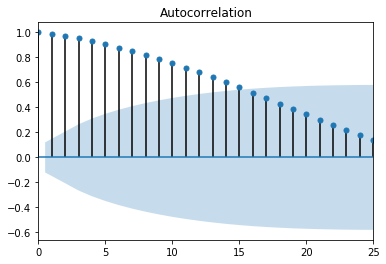

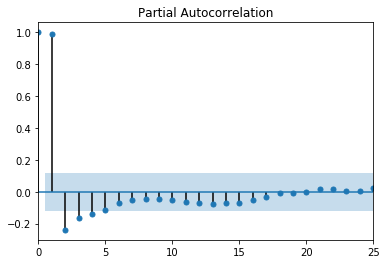

Price    77084
Name: RegionName, dtype: object


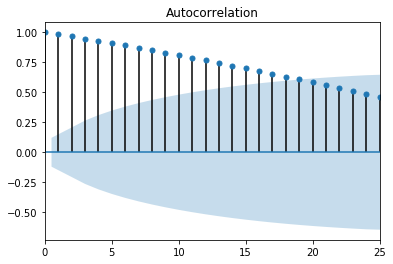

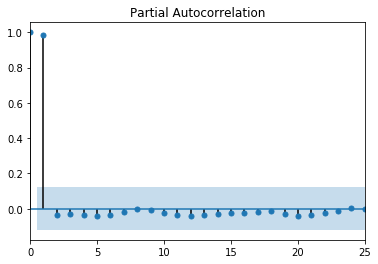

Price    77449
Name: RegionName, dtype: object


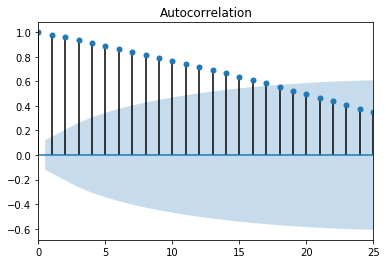

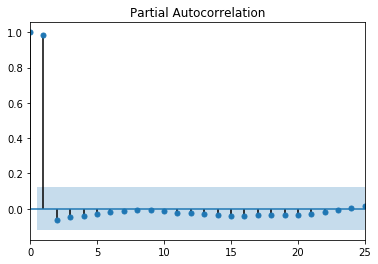

Price    77429
Name: RegionName, dtype: object


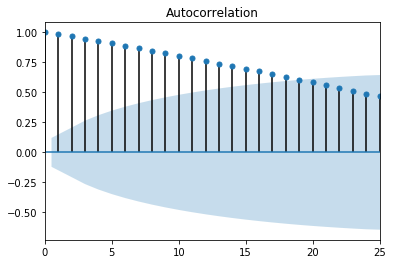

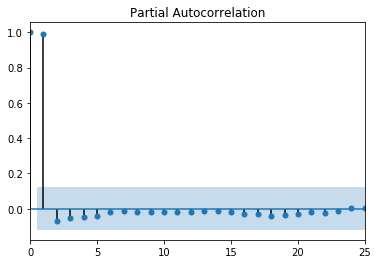

Price    77036
Name: RegionName, dtype: object


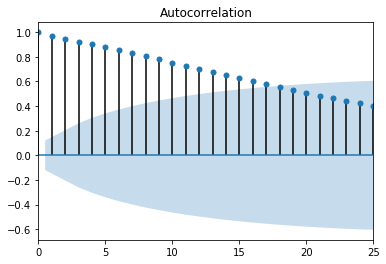

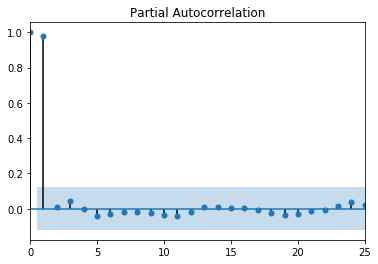

Price    77433
Name: RegionName, dtype: object


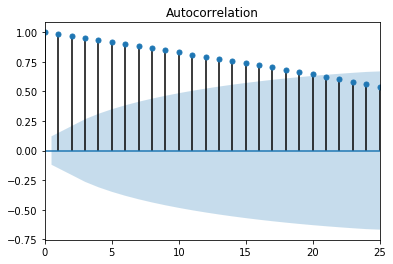

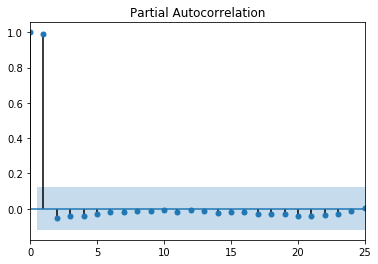

Price    77077
Name: RegionName, dtype: object


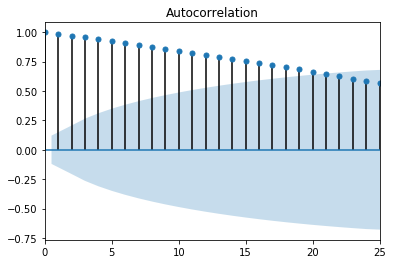

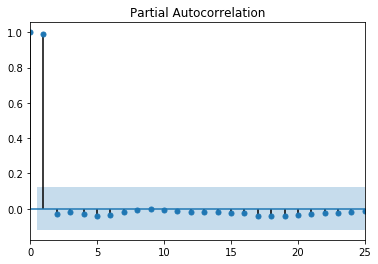

Price    77379
Name: RegionName, dtype: object


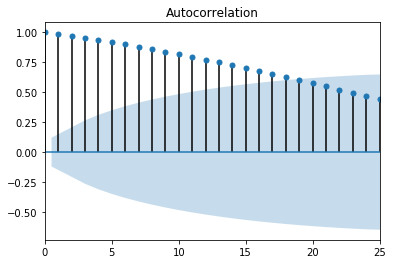

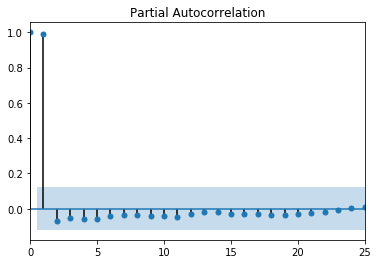

Price    77095
Name: RegionName, dtype: object


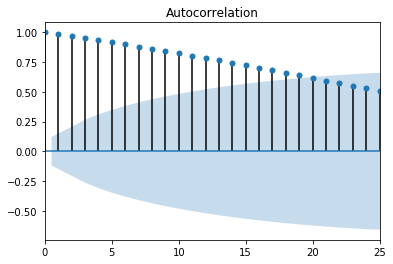

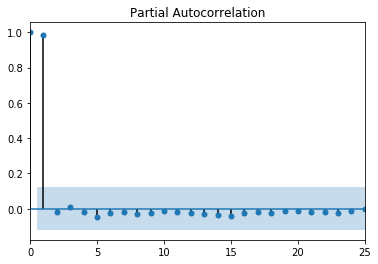

Price    77082
Name: RegionName, dtype: object


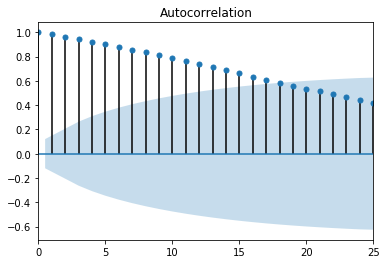

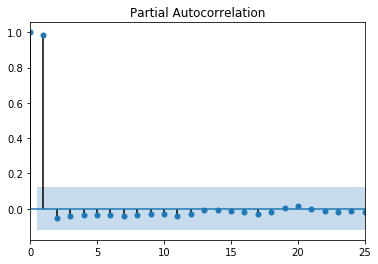

Price    77057
Name: RegionName, dtype: object


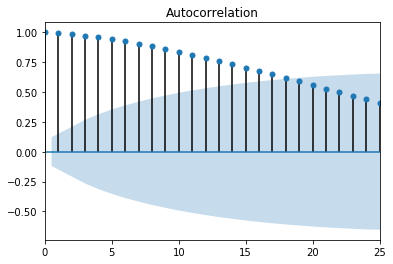

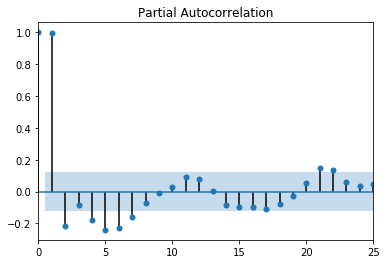

Price    77007
Name: RegionName, dtype: object


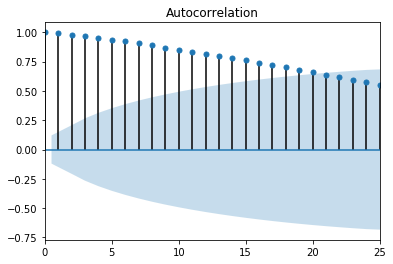

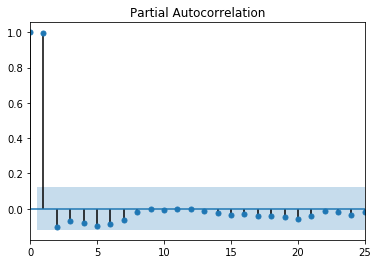

Price    77521
Name: RegionName, dtype: object


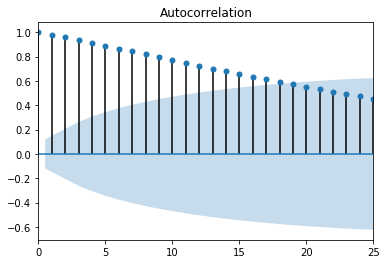

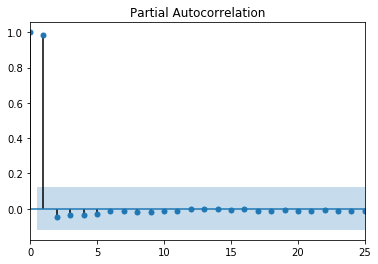

Price    77346
Name: RegionName, dtype: object


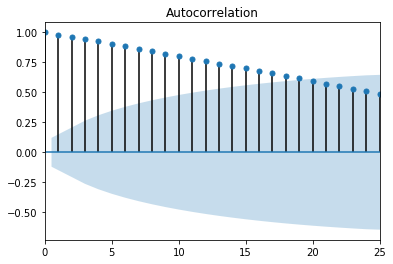

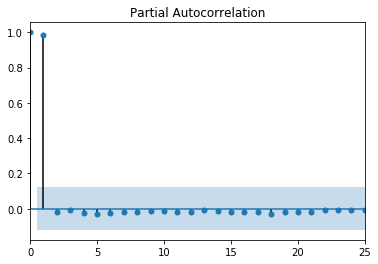

Price    77070
Name: RegionName, dtype: object


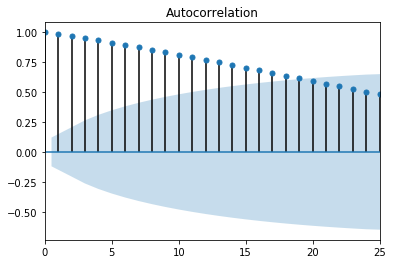

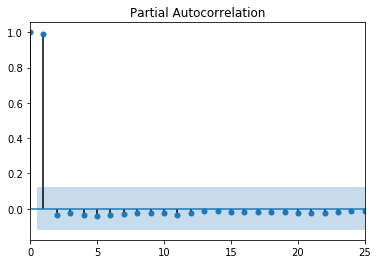

Price    77375
Name: RegionName, dtype: object


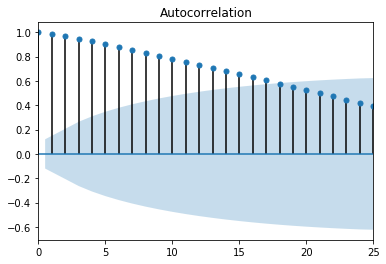

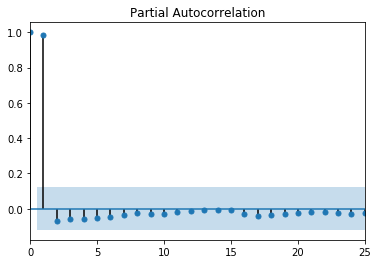

Price    77373
Name: RegionName, dtype: object


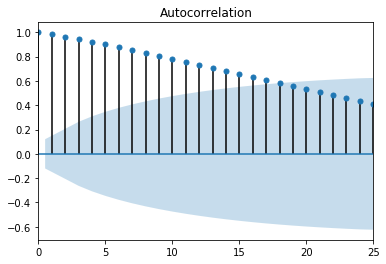

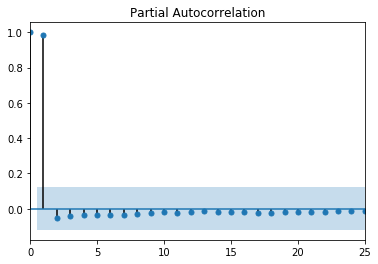

Price    77081
Name: RegionName, dtype: object


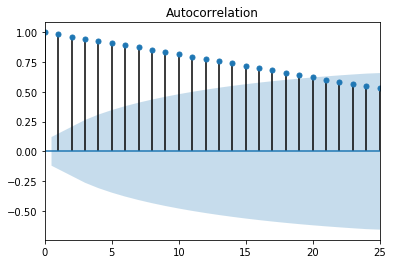

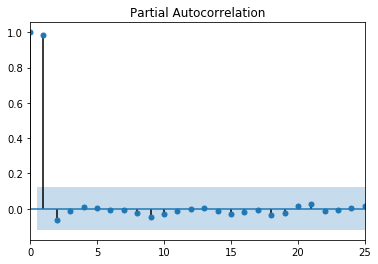

Price    77063
Name: RegionName, dtype: object


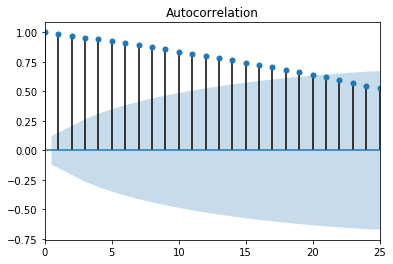

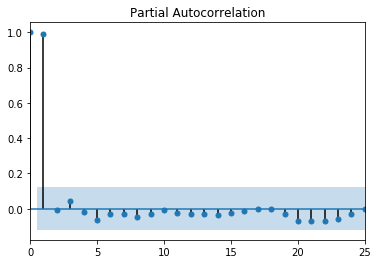

Price    77386
Name: RegionName, dtype: object


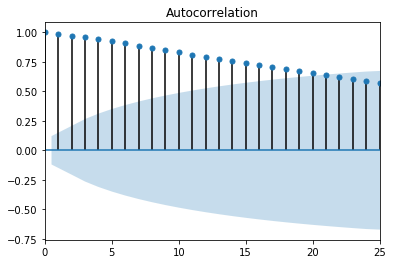

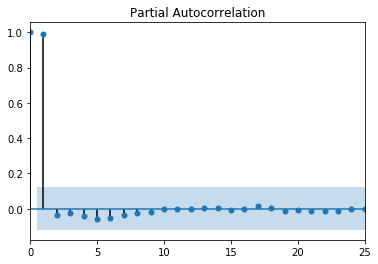

Price    77042
Name: RegionName, dtype: object


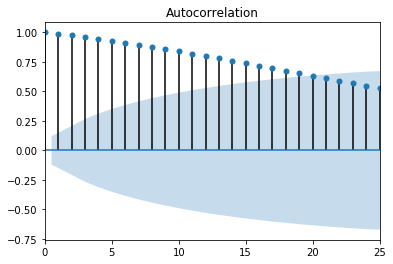

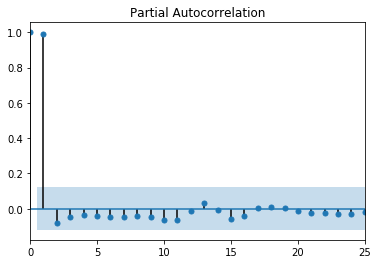

Price    77072
Name: RegionName, dtype: object


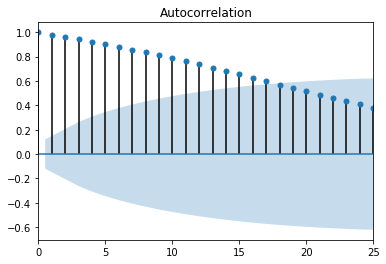

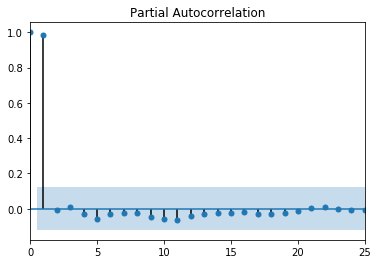

Price    77015
Name: RegionName, dtype: object


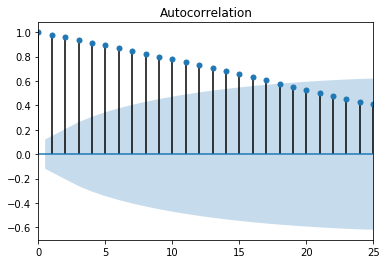

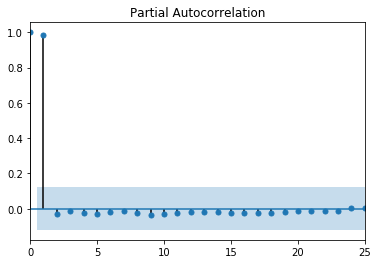

Price    77396
Name: RegionName, dtype: object


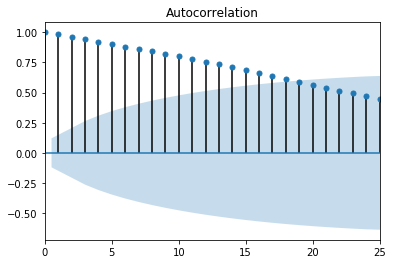

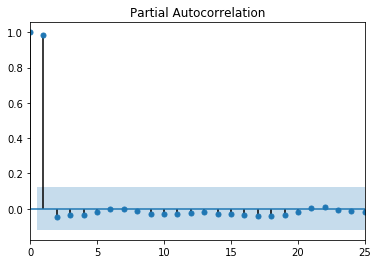

Price    77008
Name: RegionName, dtype: object


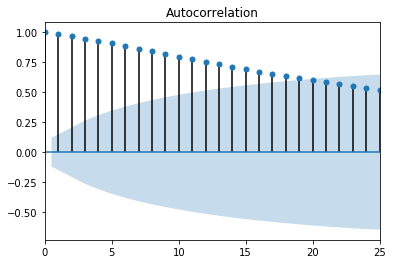

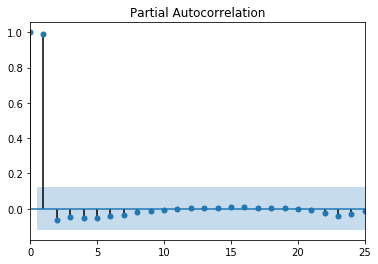

Price    77040
Name: RegionName, dtype: object


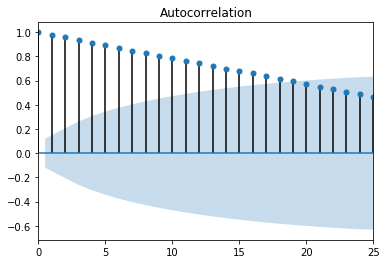

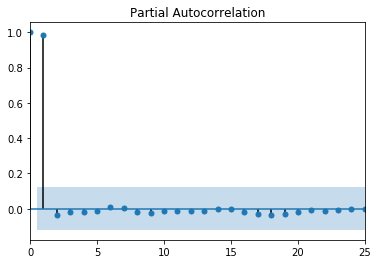

Price    77089
Name: RegionName, dtype: object


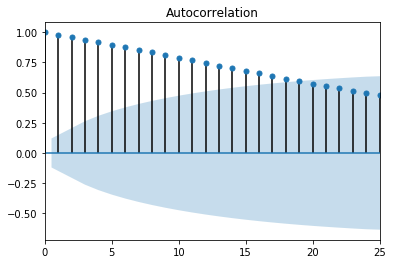

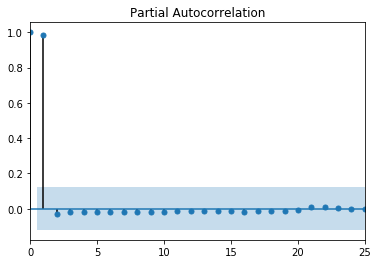

Price    77339
Name: RegionName, dtype: object


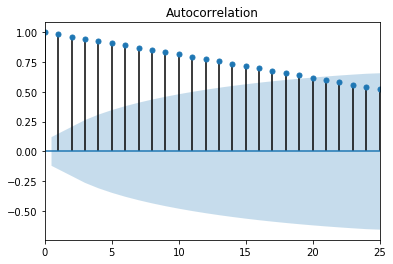

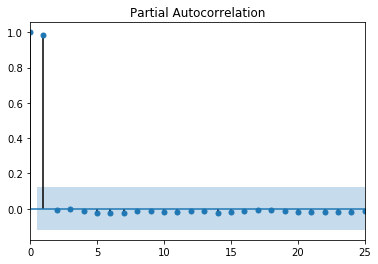

Price    77088
Name: RegionName, dtype: object


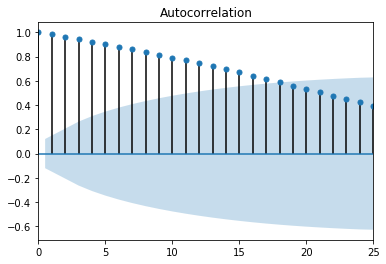

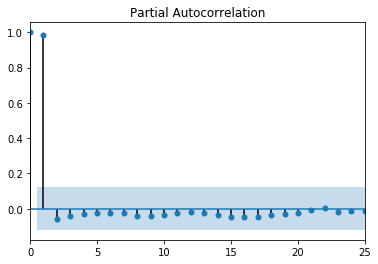

Price    77099
Name: RegionName, dtype: object


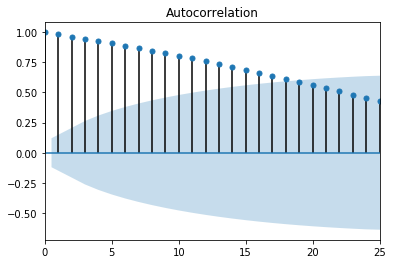

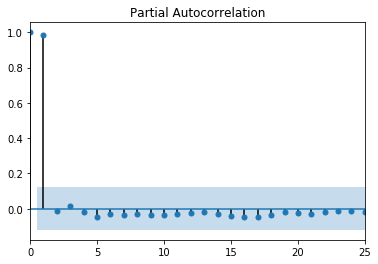

Price    77090
Name: RegionName, dtype: object


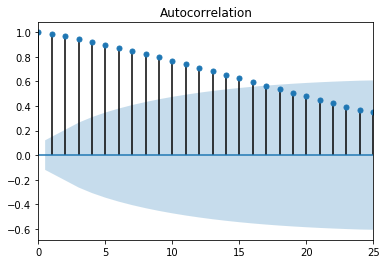

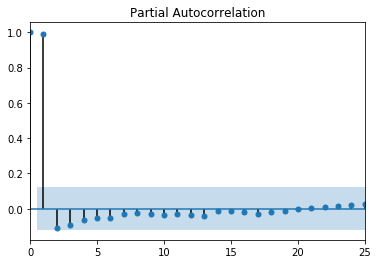

Price    77388
Name: RegionName, dtype: object


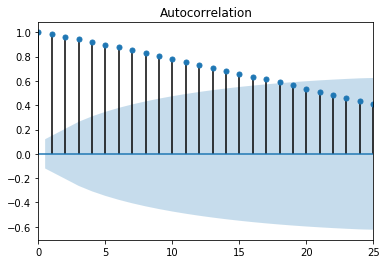

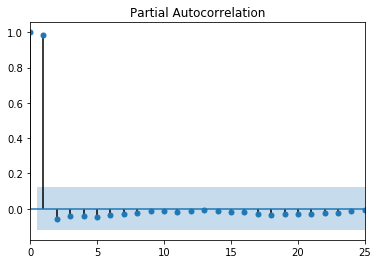

Price    77024
Name: RegionName, dtype: object


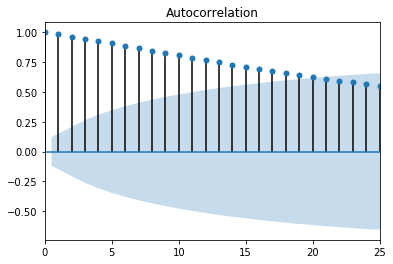

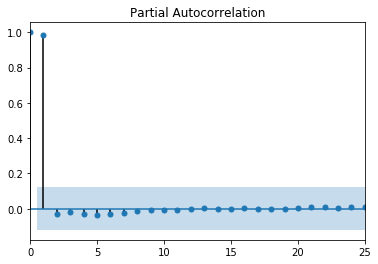

Price    77064
Name: RegionName, dtype: object


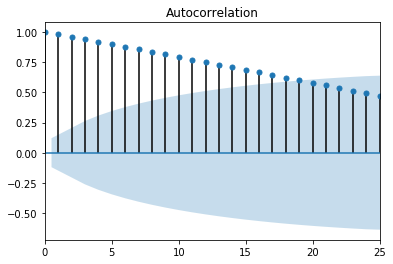

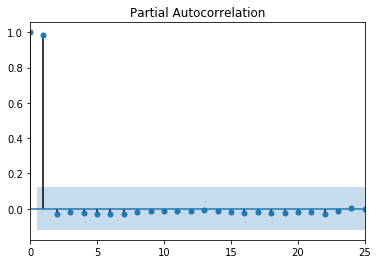

Price    77004
Name: RegionName, dtype: object


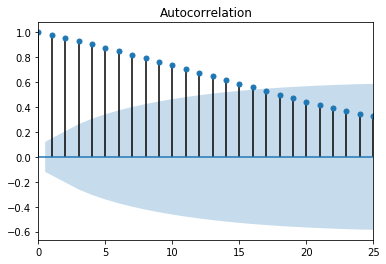

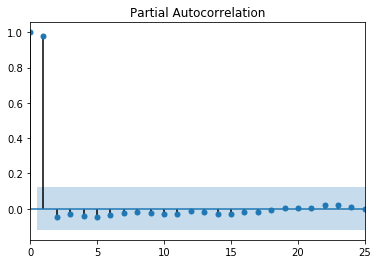

Price    77080
Name: RegionName, dtype: object


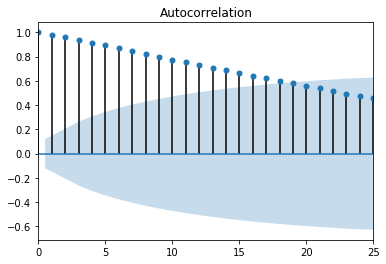

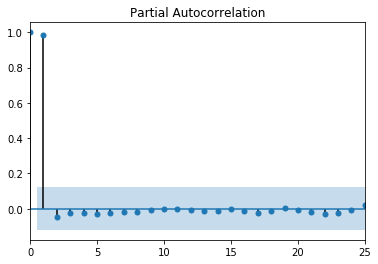

Price    77055
Name: RegionName, dtype: object


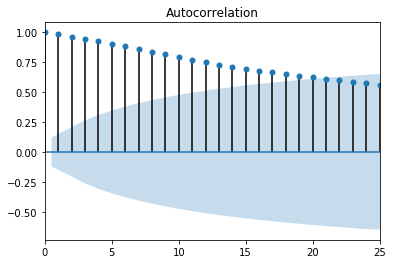

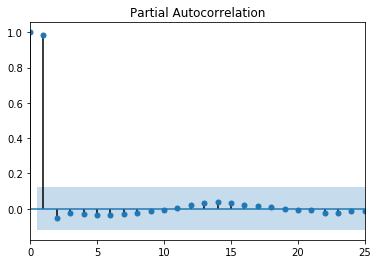

Price    77044
Name: RegionName, dtype: object


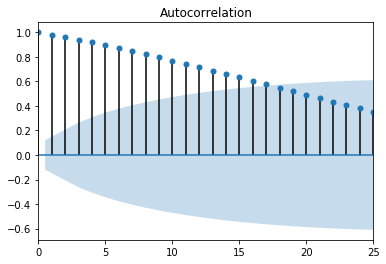

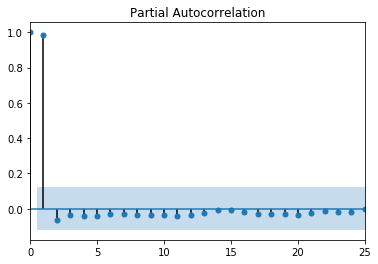

Price    77060
Name: RegionName, dtype: object


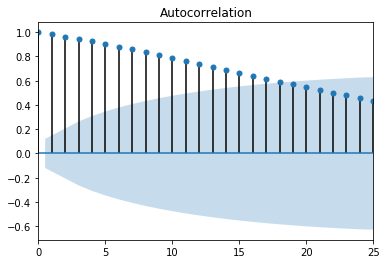

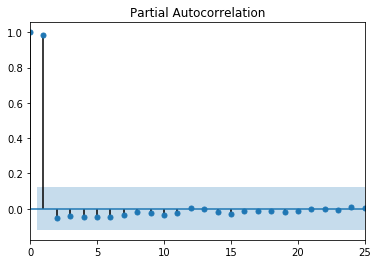

Price    77338
Name: RegionName, dtype: object


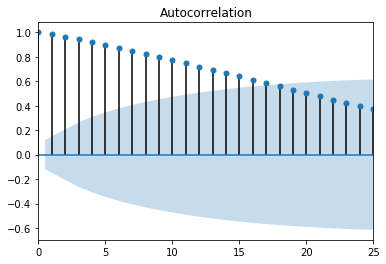

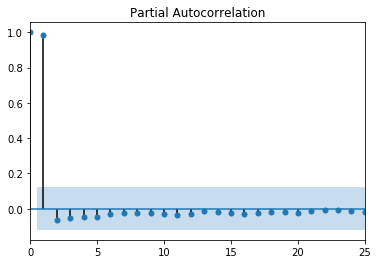

Price    77096
Name: RegionName, dtype: object


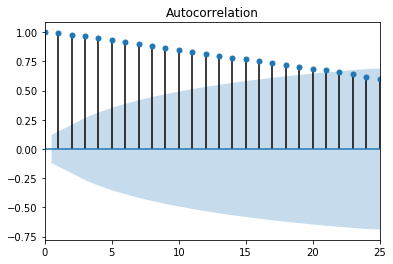

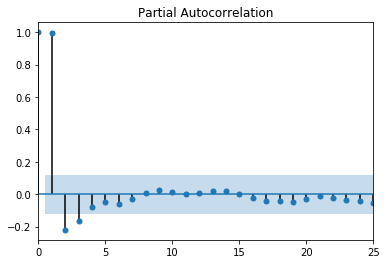

Price    77065
Name: RegionName, dtype: object


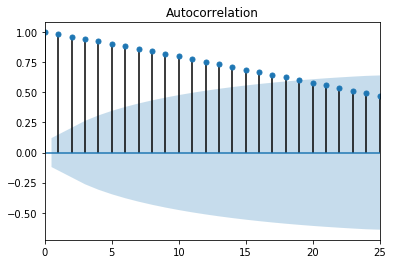

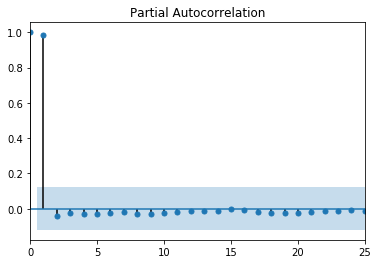

Price    77035
Name: RegionName, dtype: object


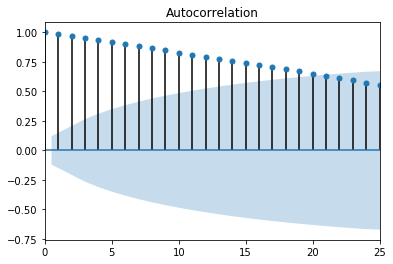

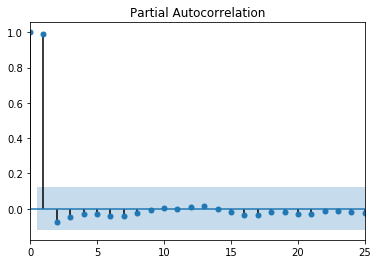

Price    77054
Name: RegionName, dtype: object


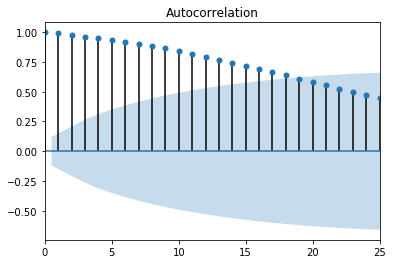

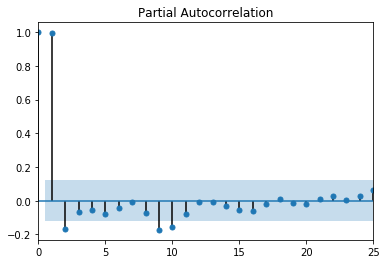

Price    77092
Name: RegionName, dtype: object


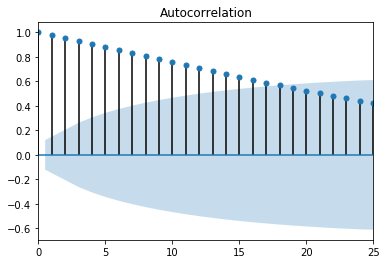

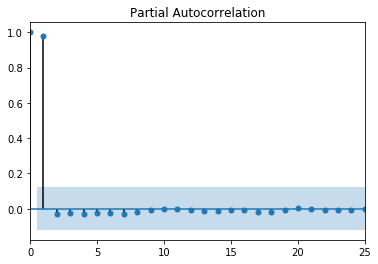

Price    77074
Name: RegionName, dtype: object


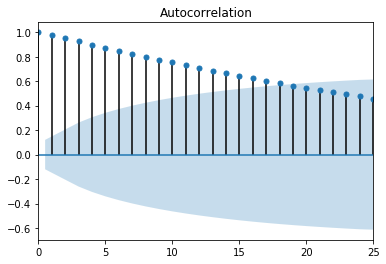

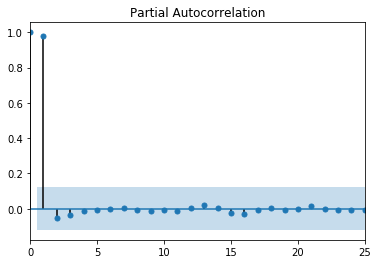

Price    77006
Name: RegionName, dtype: object


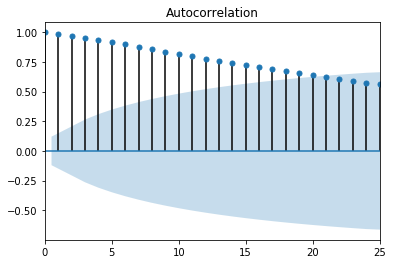

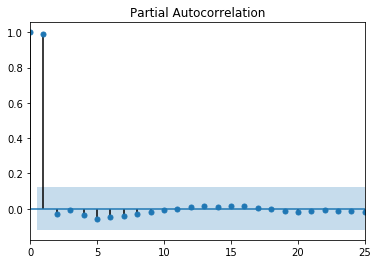

Price    77056
Name: RegionName, dtype: object


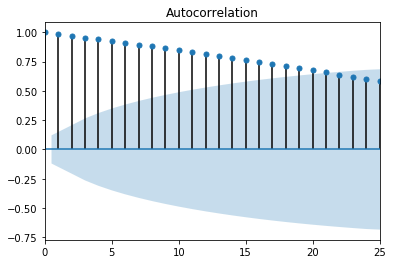

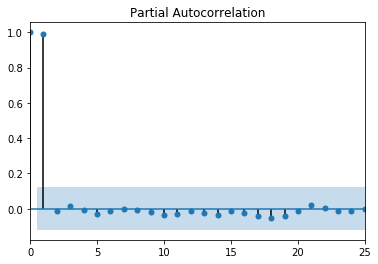

Price    77520
Name: RegionName, dtype: object


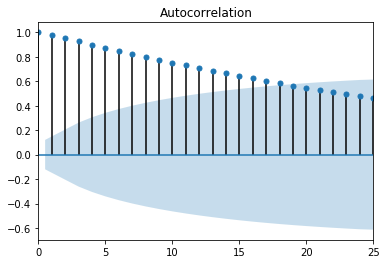

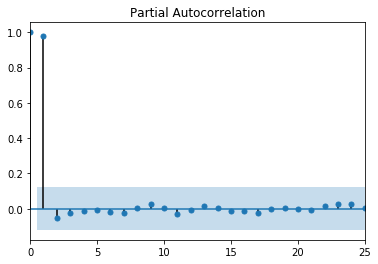

Price    77377
Name: RegionName, dtype: object


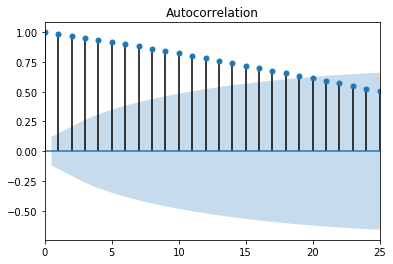

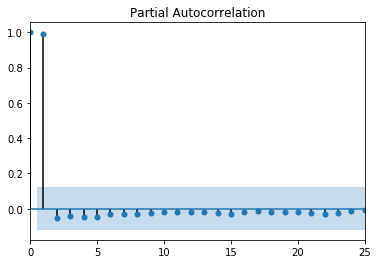

Price    77571
Name: RegionName, dtype: object


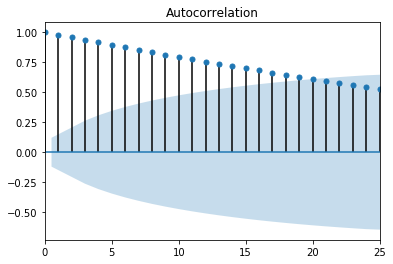

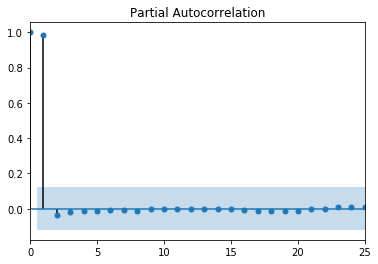

Price    77073
Name: RegionName, dtype: object


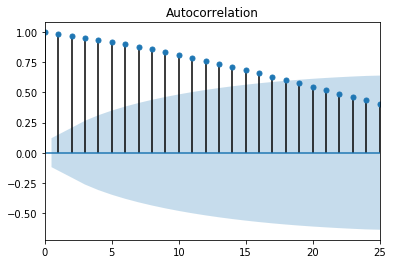

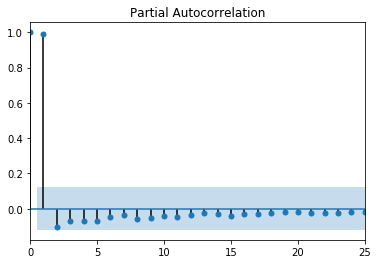

Price    77079
Name: RegionName, dtype: object


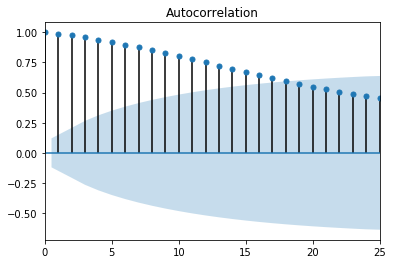

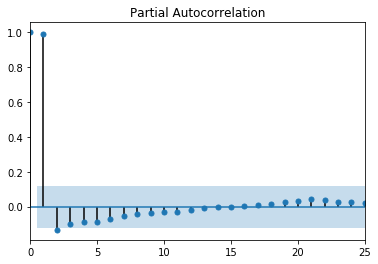

Price    77025
Name: RegionName, dtype: object


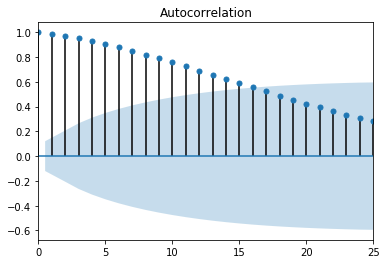

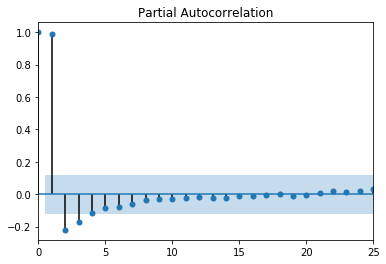

Price    77034
Name: RegionName, dtype: object


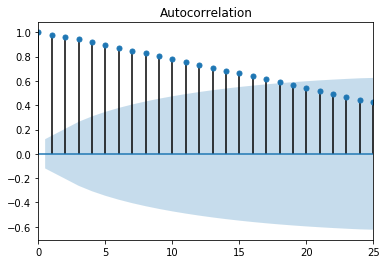

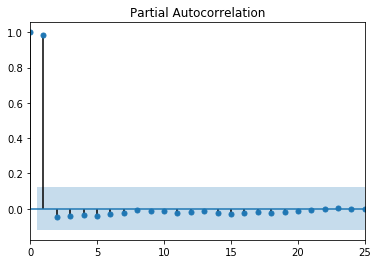

Price    77093
Name: RegionName, dtype: object


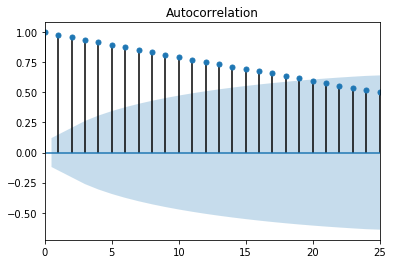

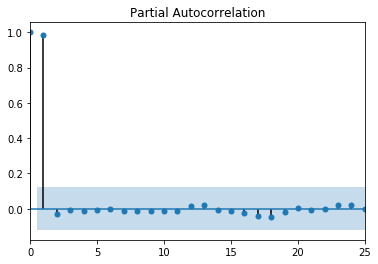

Price    77019
Name: RegionName, dtype: object


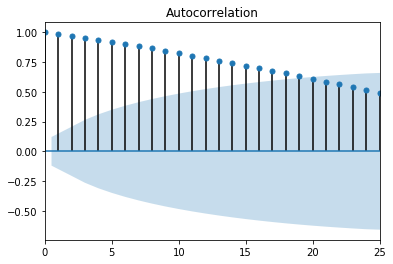

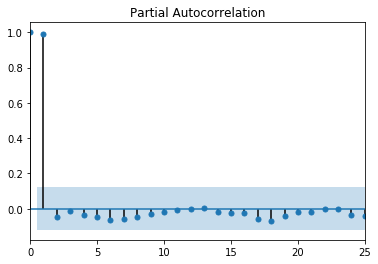

Price    77075
Name: RegionName, dtype: object


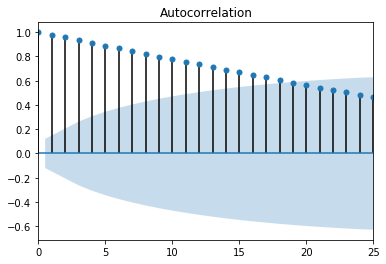

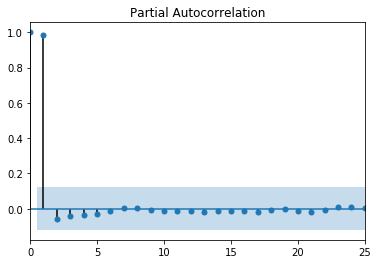

Price    77598
Name: RegionName, dtype: object


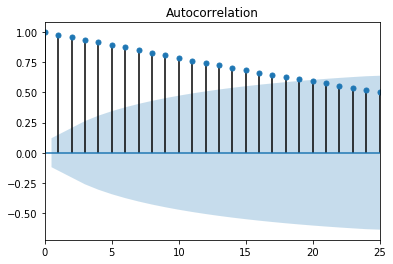

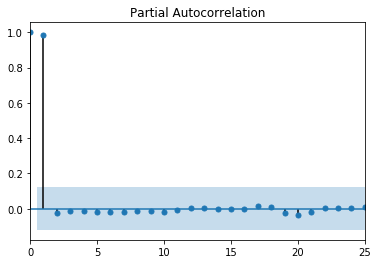

Price    77536
Name: RegionName, dtype: object


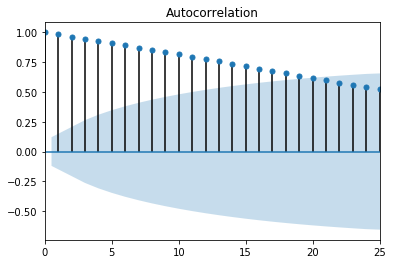

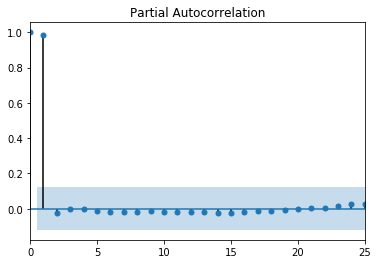

Price    77502
Name: RegionName, dtype: object


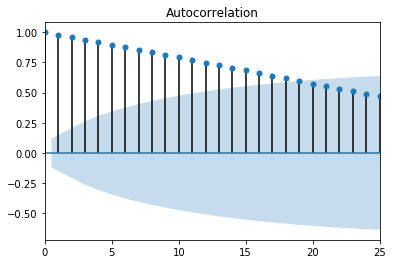

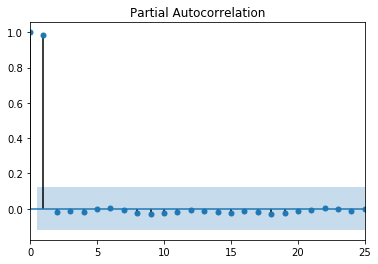

Price    77018
Name: RegionName, dtype: object


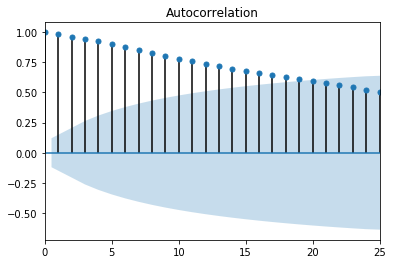

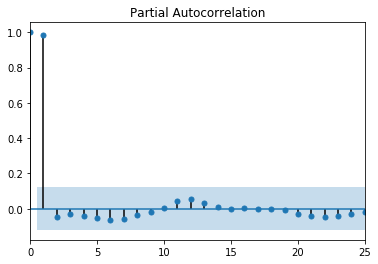

Price    77532
Name: RegionName, dtype: object


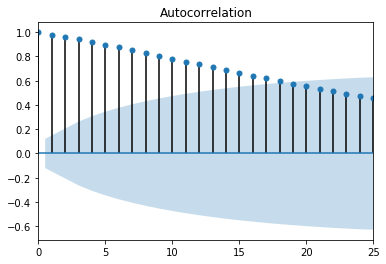

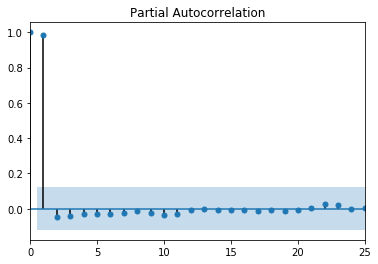

Price    77041
Name: RegionName, dtype: object


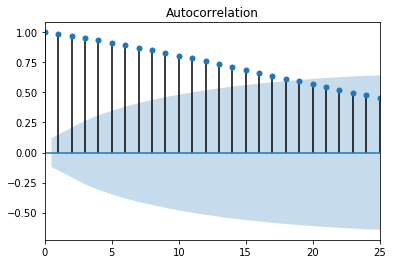

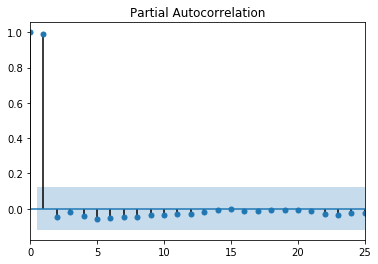

Price    77014
Name: RegionName, dtype: object


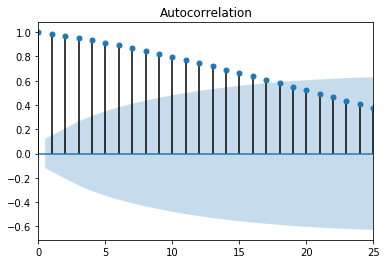

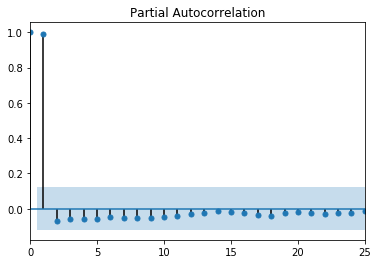

Price    77027
Name: RegionName, dtype: object


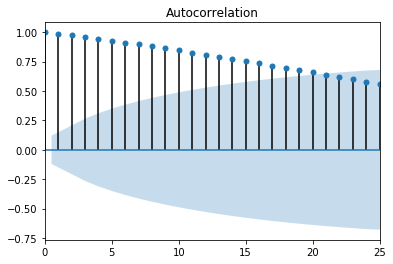

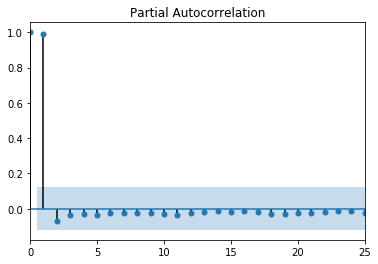

Price    77506
Name: RegionName, dtype: object


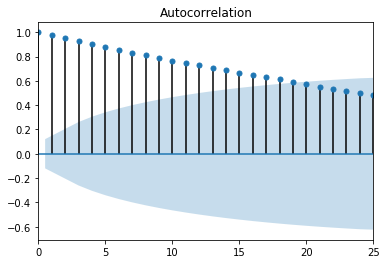

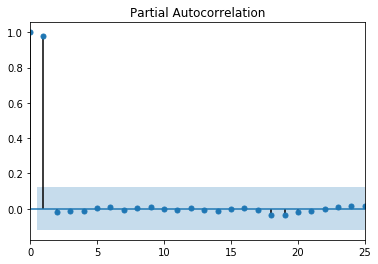

Price    77493
Name: RegionName, dtype: object


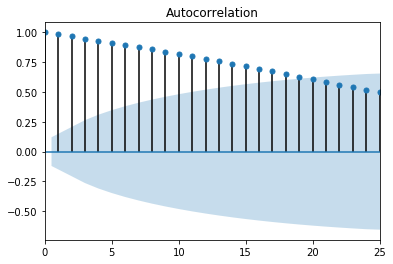

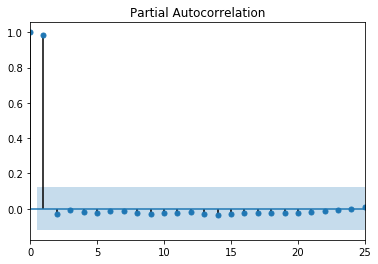

Price    77087
Name: RegionName, dtype: object


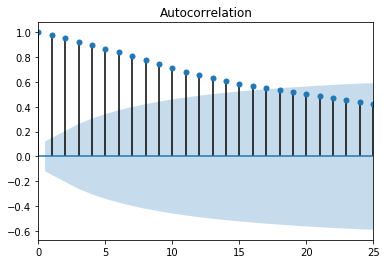

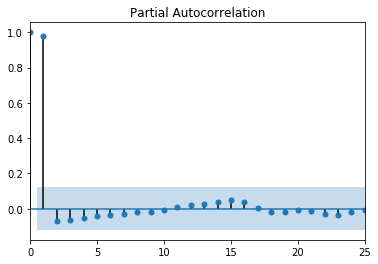

Price    77021
Name: RegionName, dtype: object


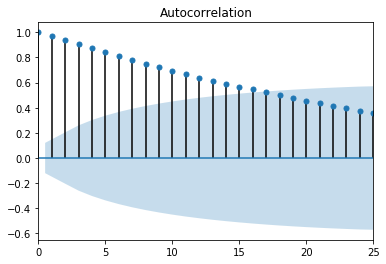

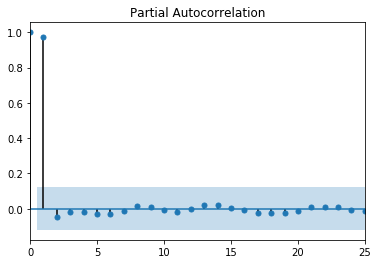

Price    77049
Name: RegionName, dtype: object


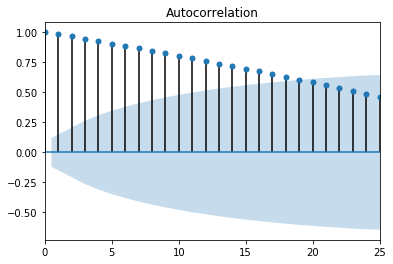

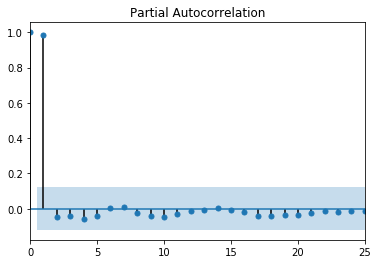

Price    77586
Name: RegionName, dtype: object


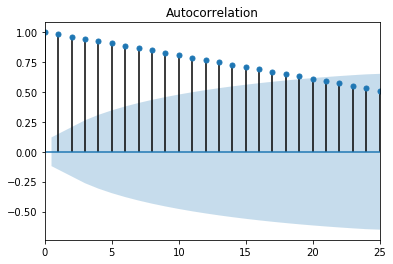

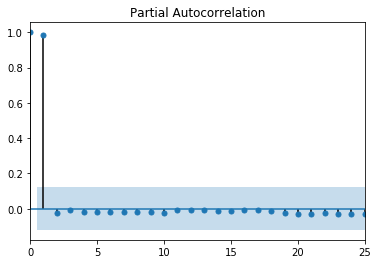

Price    77047
Name: RegionName, dtype: object


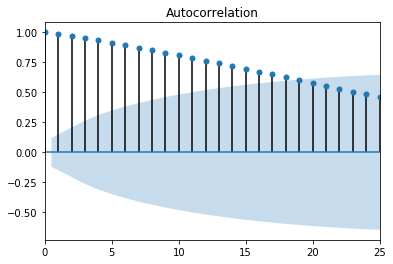

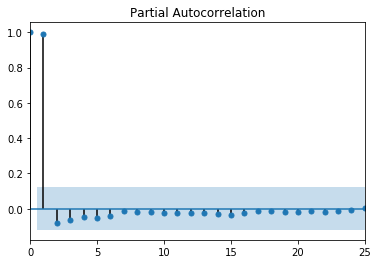

Price    77091
Name: RegionName, dtype: object


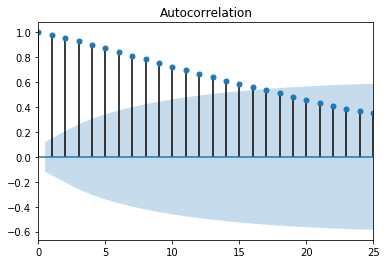

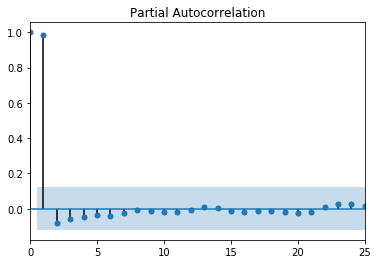

Price    77017
Name: RegionName, dtype: object


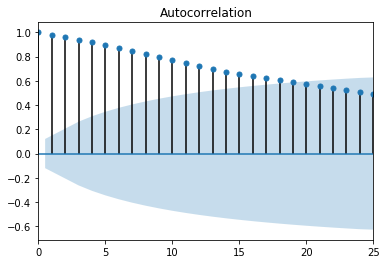

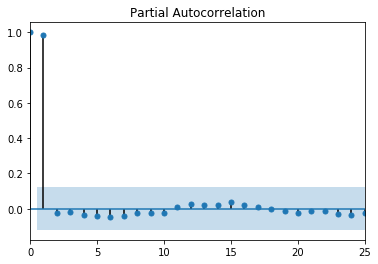

Price    77067
Name: RegionName, dtype: object


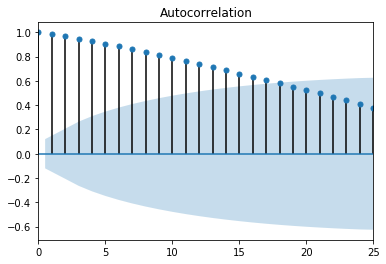

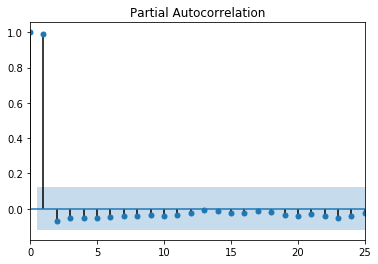

Price    77066
Name: RegionName, dtype: object


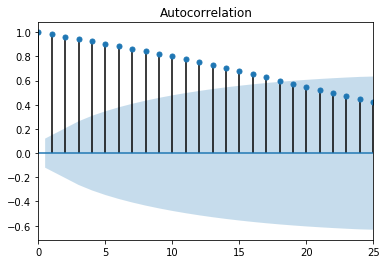

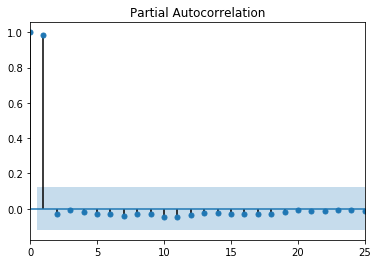

Price    77005
Name: RegionName, dtype: object


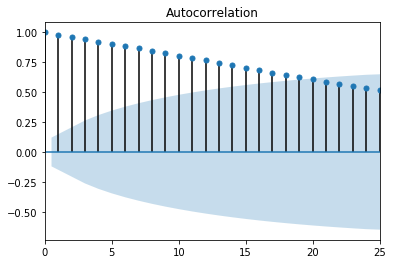

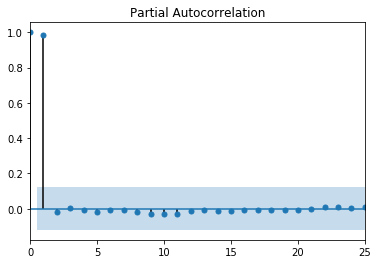

Price    77530
Name: RegionName, dtype: object


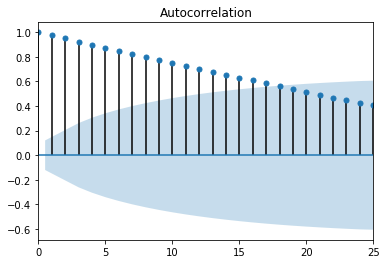

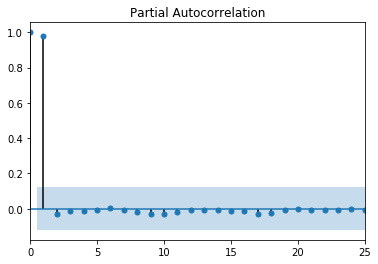

Price    77071
Name: RegionName, dtype: object


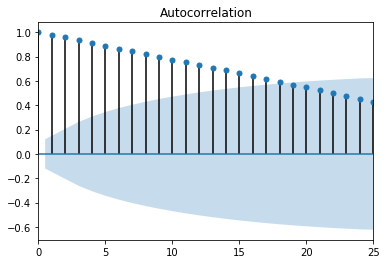

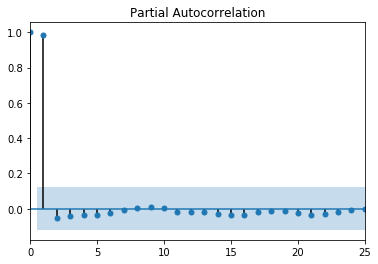

Price    77016
Name: RegionName, dtype: object


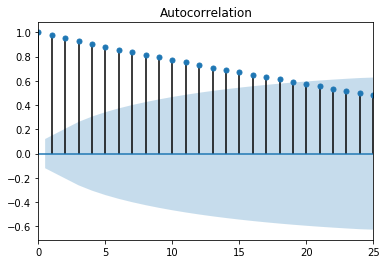

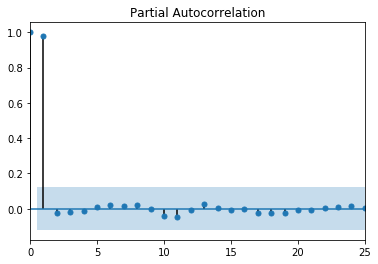

Price    77062
Name: RegionName, dtype: object


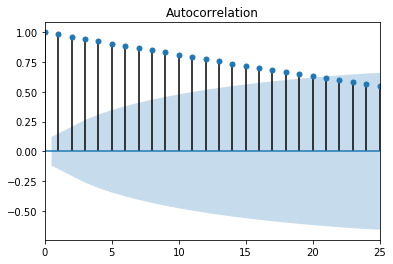

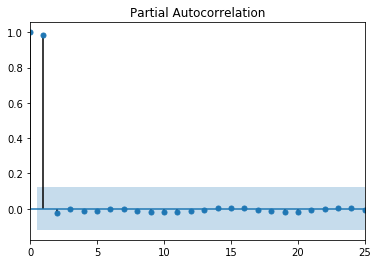

Price    77045
Name: RegionName, dtype: object


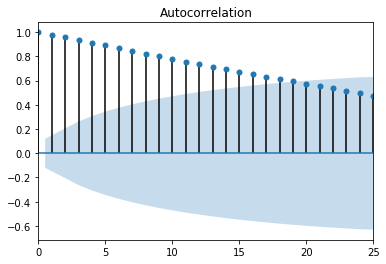

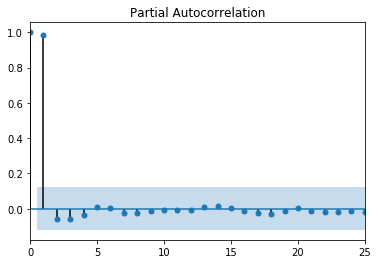

Price    77058
Name: RegionName, dtype: object


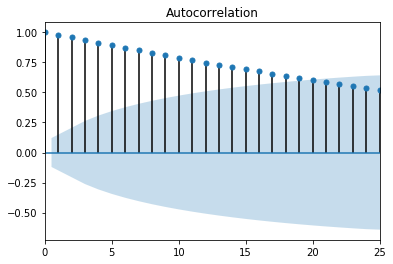

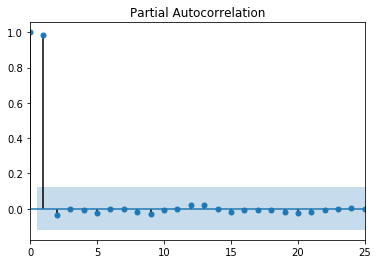

Price    77098
Name: RegionName, dtype: object


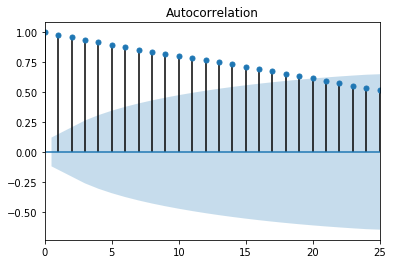

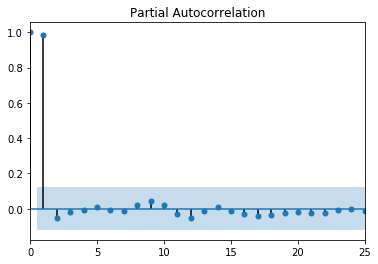

Price    77043
Name: RegionName, dtype: object


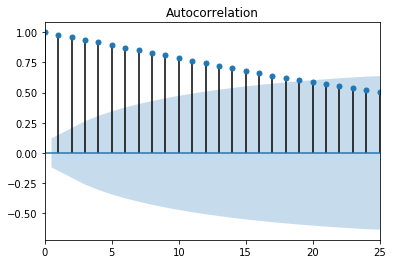

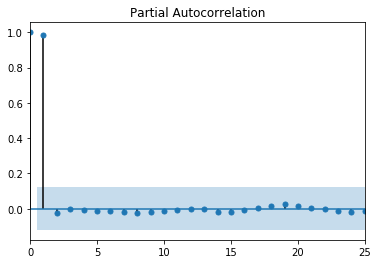

Price    77033
Name: RegionName, dtype: object


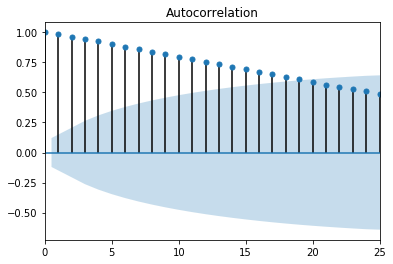

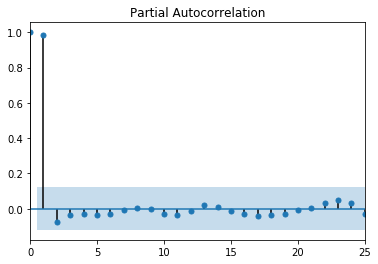

Price    77345
Name: RegionName, dtype: object


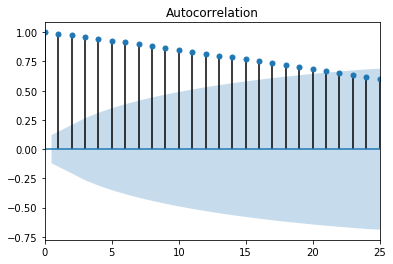

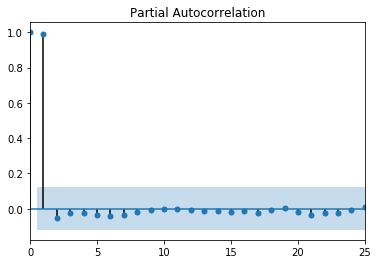

Price    77061
Name: RegionName, dtype: object


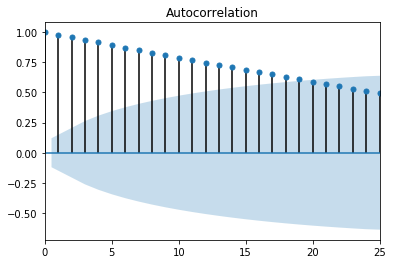

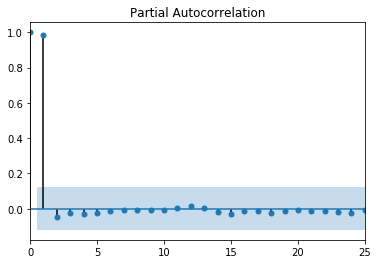

Price    77504
Name: RegionName, dtype: object


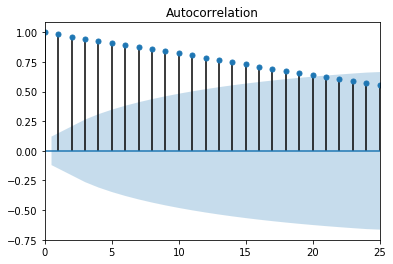

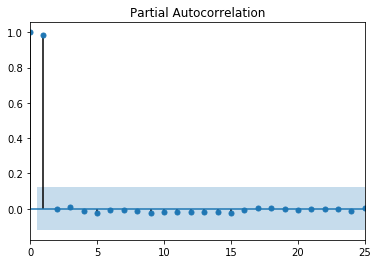

Price    77053
Name: RegionName, dtype: object


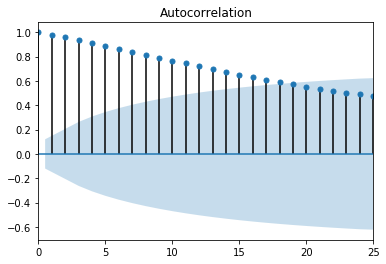

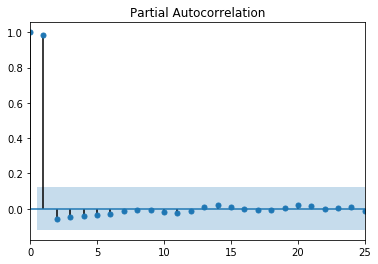

Price    77020
Name: RegionName, dtype: object


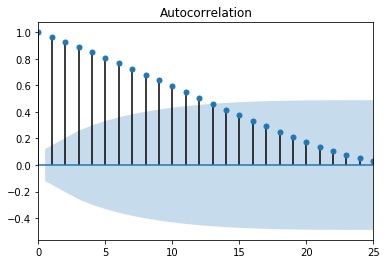

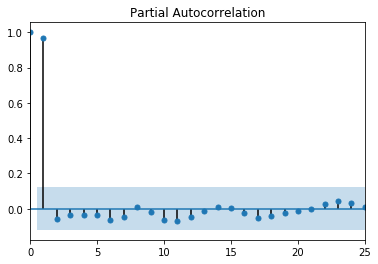

Price    77503
Name: RegionName, dtype: object


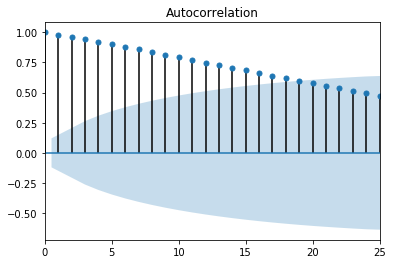

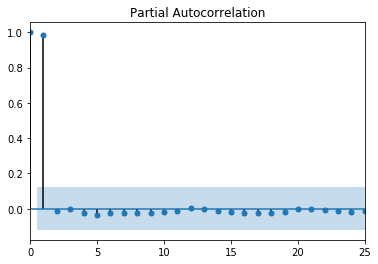

Price    77038
Name: RegionName, dtype: object


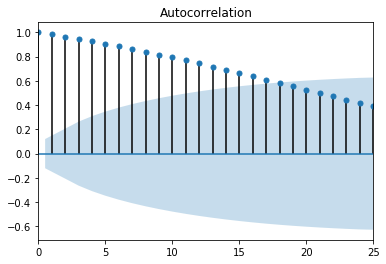

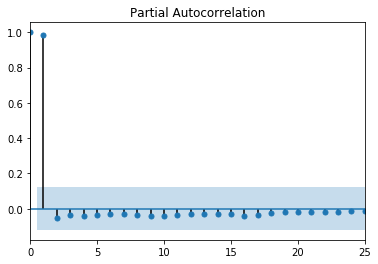

Price    77505
Name: RegionName, dtype: object


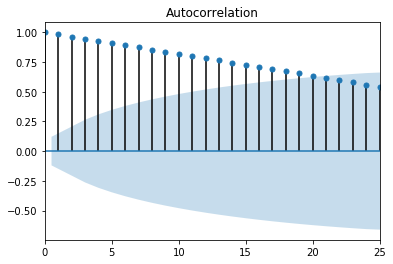

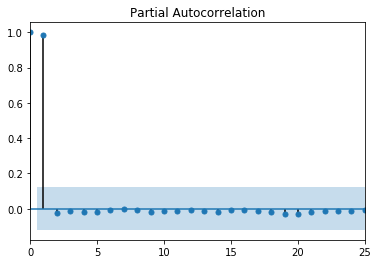

Price    77069
Name: RegionName, dtype: object


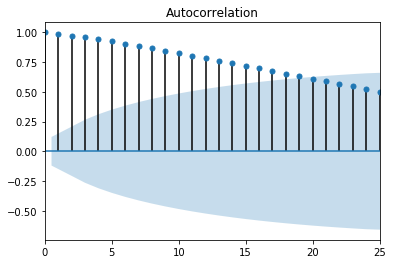

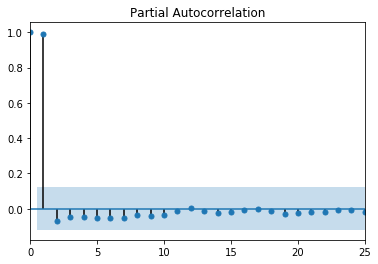

Price    77523
Name: RegionName, dtype: object


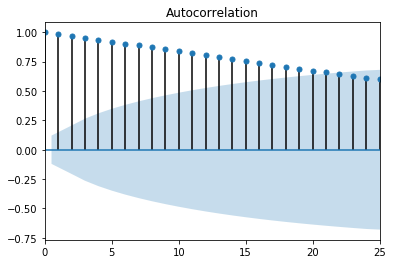

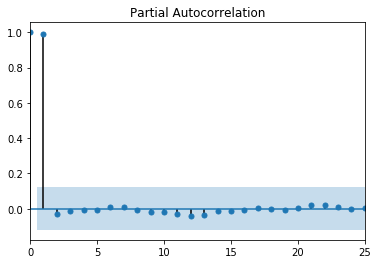

Price    77086
Name: RegionName, dtype: object


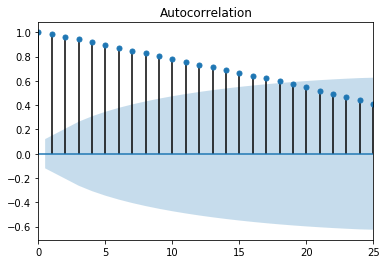

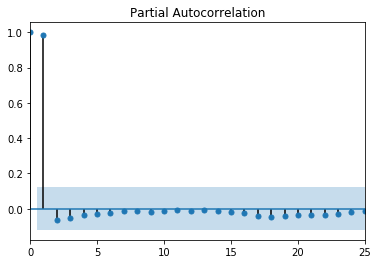

Price    77039
Name: RegionName, dtype: object


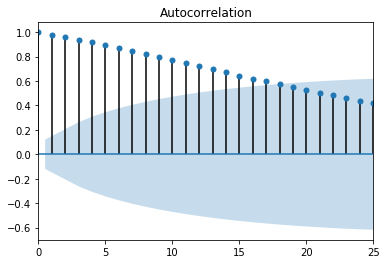

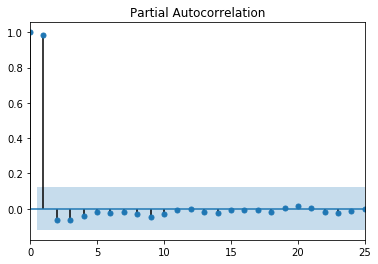

Price    77030
Name: RegionName, dtype: object


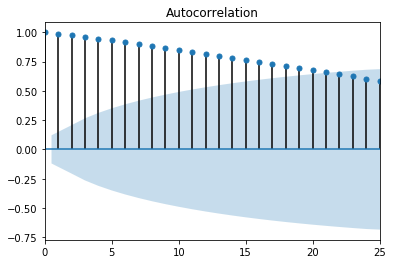

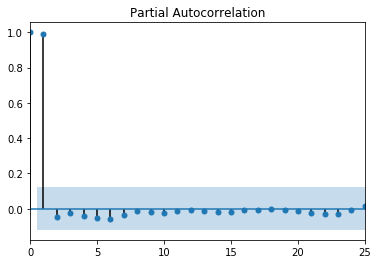

Price    77051
Name: RegionName, dtype: object


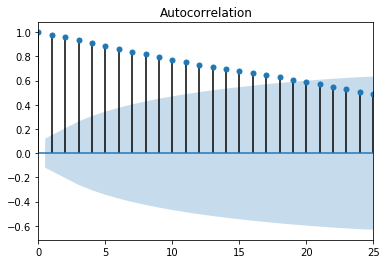

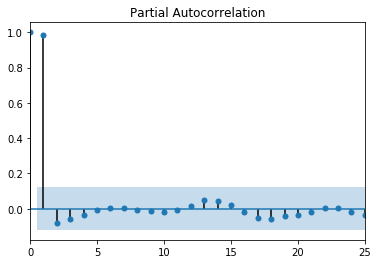

Price    77031
Name: RegionName, dtype: object


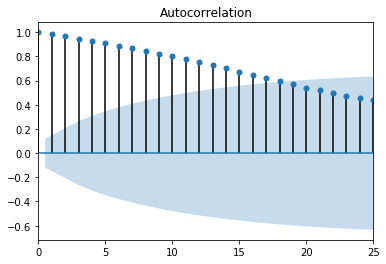

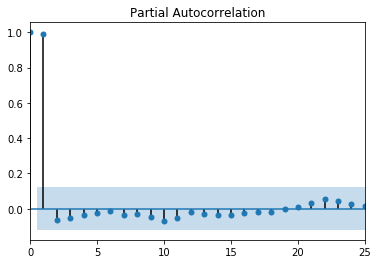

Price    77028
Name: RegionName, dtype: object


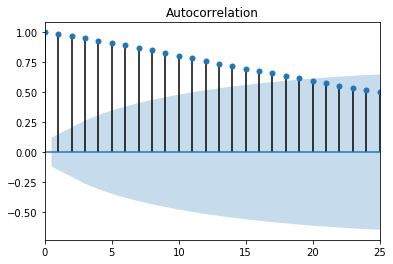

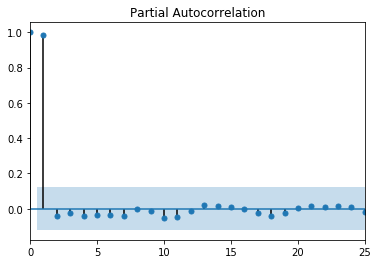

Price    77401
Name: RegionName, dtype: object


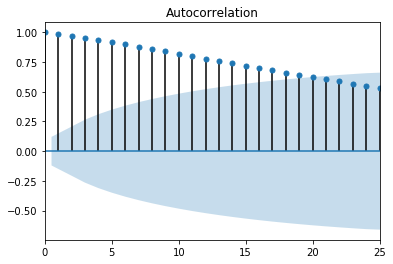

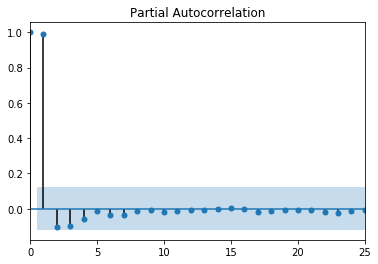

Price    77048
Name: RegionName, dtype: object


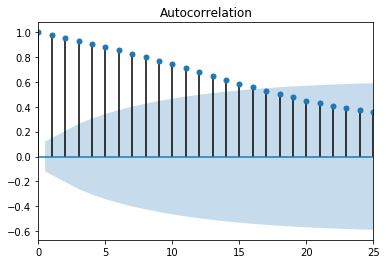

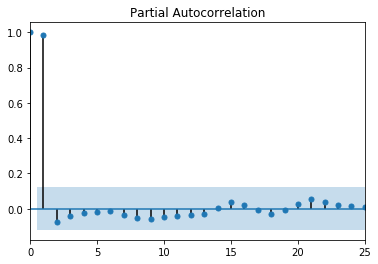

Price    77013
Name: RegionName, dtype: object


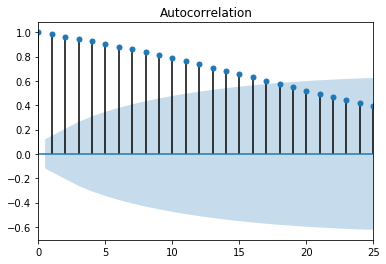

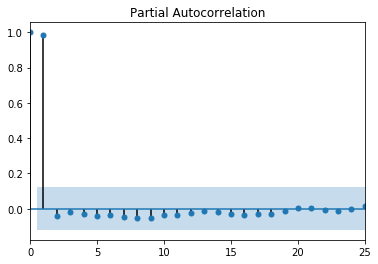

Price    77029
Name: RegionName, dtype: object


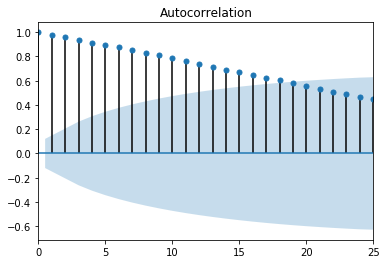

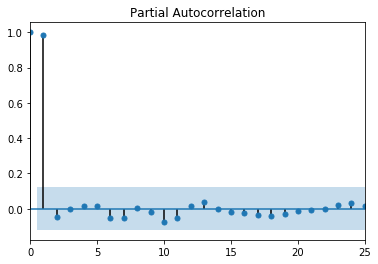

Price    77059
Name: RegionName, dtype: object


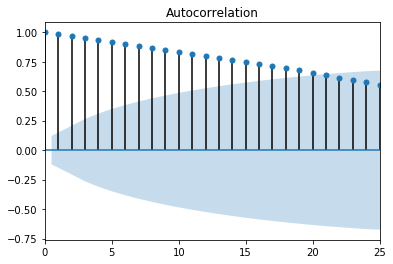

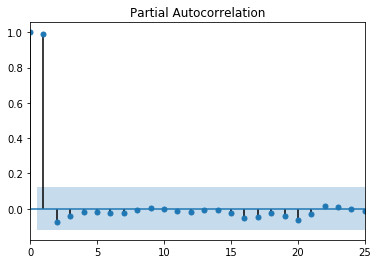

Price    77002
Name: RegionName, dtype: object


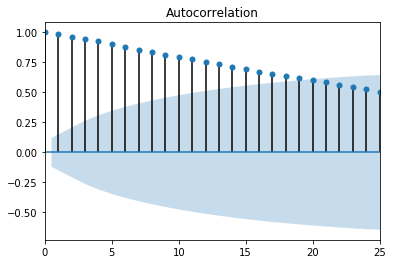

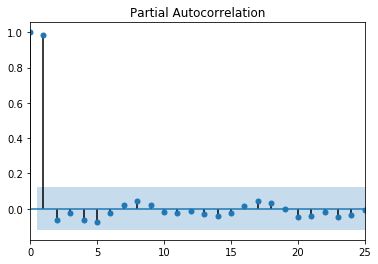

Price    77447
Name: RegionName, dtype: object


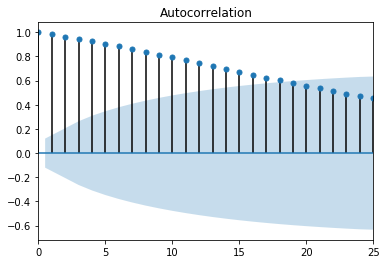

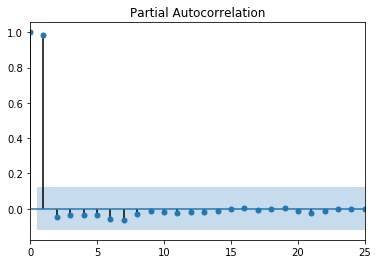

Price    77587
Name: RegionName, dtype: object


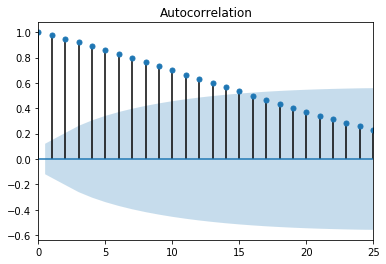

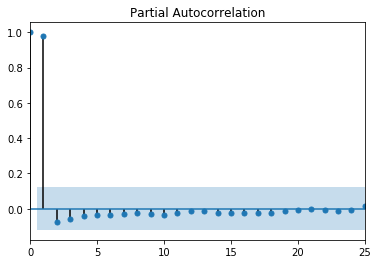

Price    77037
Name: RegionName, dtype: object


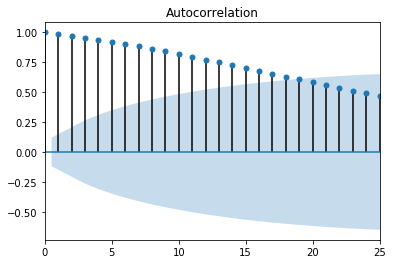

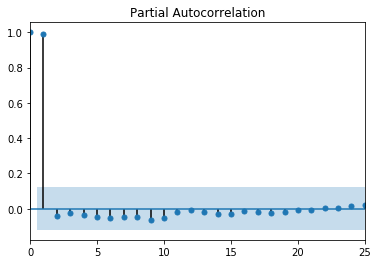

Price    77085
Name: RegionName, dtype: object


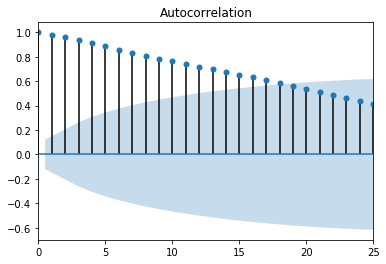

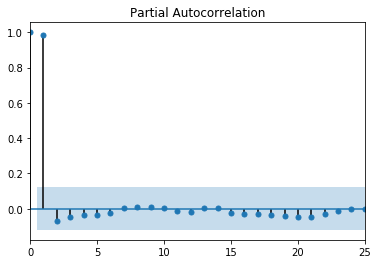

Price    77003
Name: RegionName, dtype: object


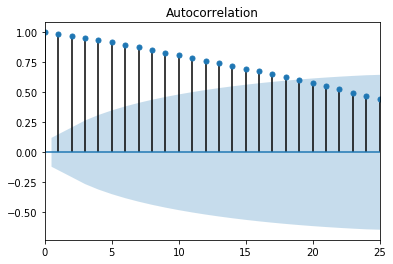

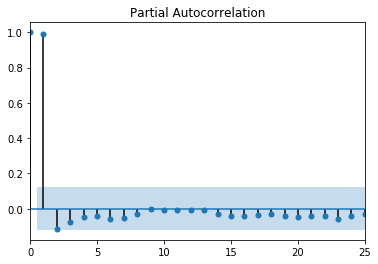

Price    77078
Name: RegionName, dtype: object


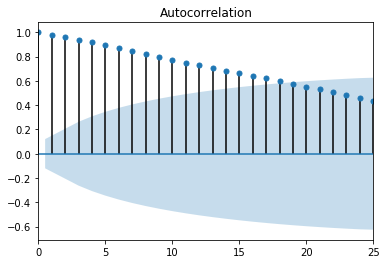

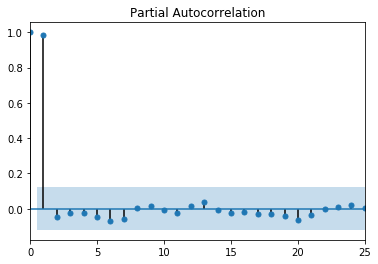

Price    77068
Name: RegionName, dtype: object


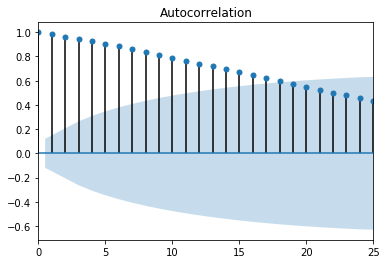

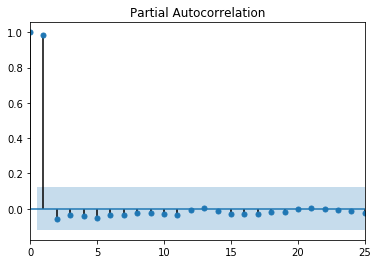

Price    77562
Name: RegionName, dtype: object


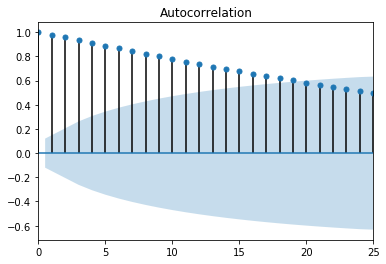

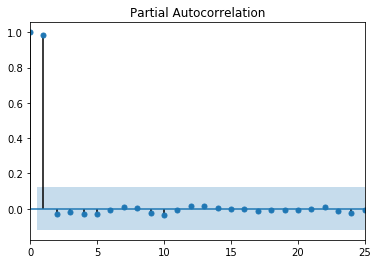

Price    77032
Name: RegionName, dtype: object


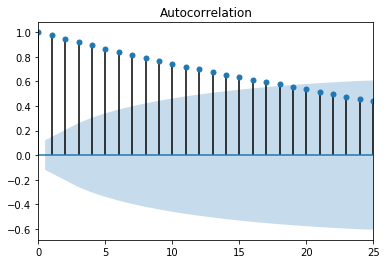

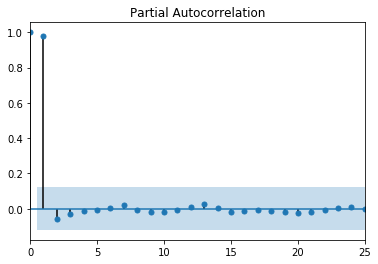

Price    77094
Name: RegionName, dtype: object


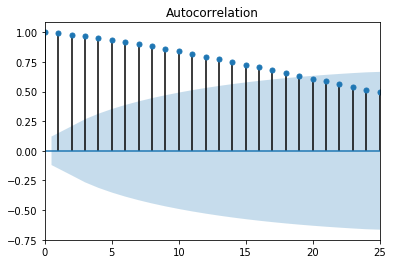

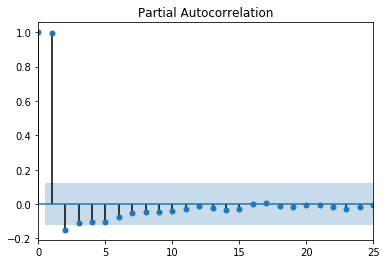

Price    77547
Name: RegionName, dtype: object


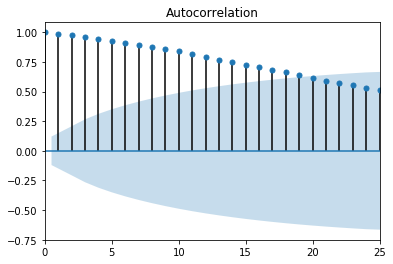

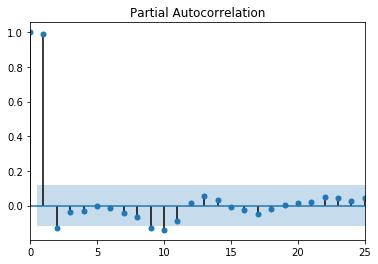

Price    77050
Name: RegionName, dtype: object


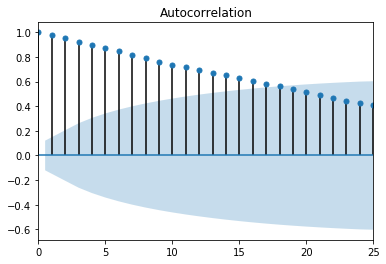

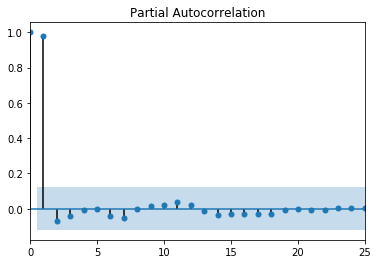

In [27]:
for i, j in enumerate(harris_data):
    print(harris_zip_codes[i])
    acf_pacf_for_data(np.asarray(j))

Price    76063
Name: RegionName, dtype: object


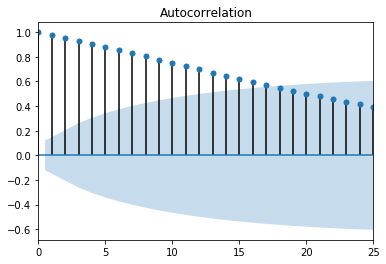

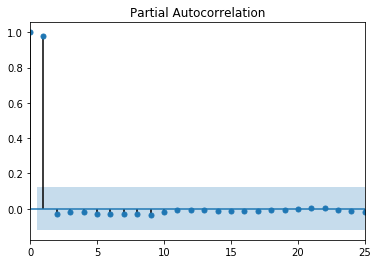

Price    76244
Name: RegionName, dtype: object


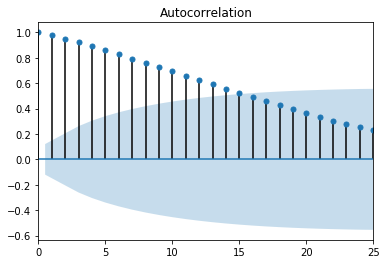

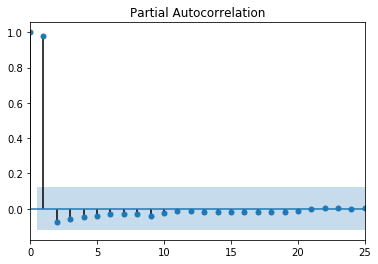

Price    76116
Name: RegionName, dtype: object


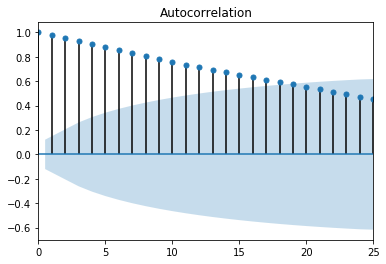

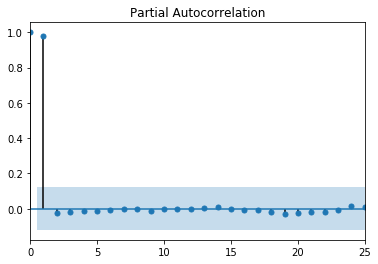

Price    76179
Name: RegionName, dtype: object


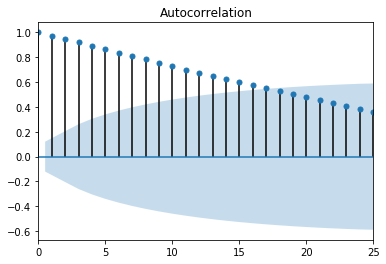

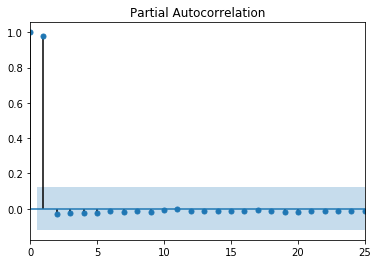

Price    76137
Name: RegionName, dtype: object


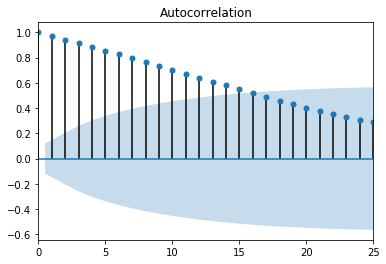

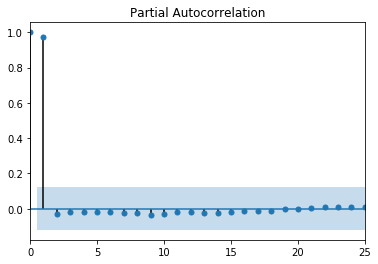

Price    76051
Name: RegionName, dtype: object


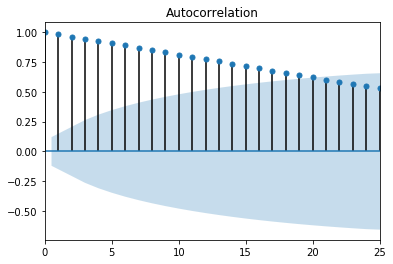

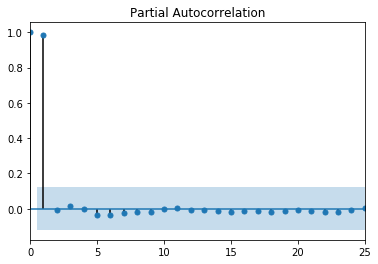

Price    76133
Name: RegionName, dtype: object


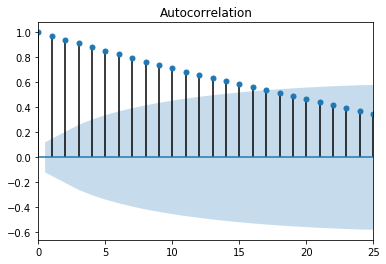

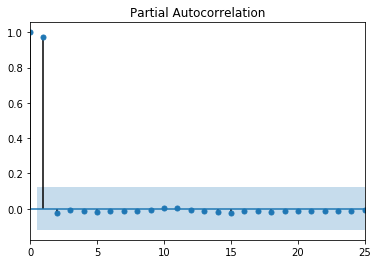

Price    76010
Name: RegionName, dtype: object


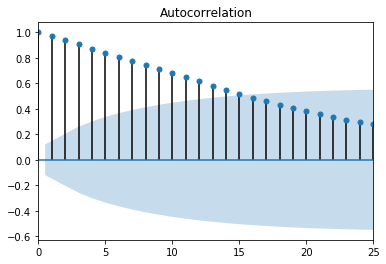

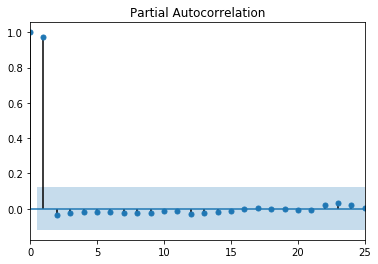

Price    76112
Name: RegionName, dtype: object


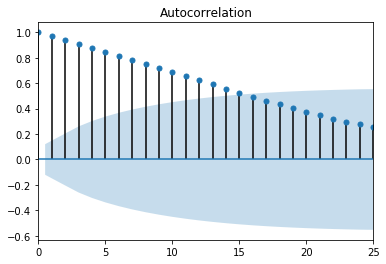

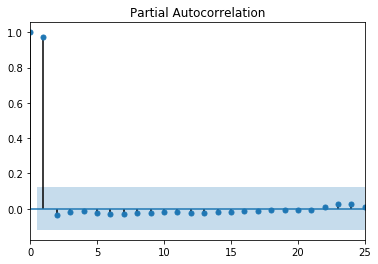

Price    76017
Name: RegionName, dtype: object


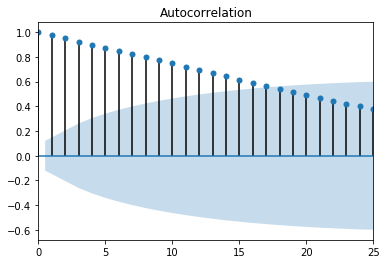

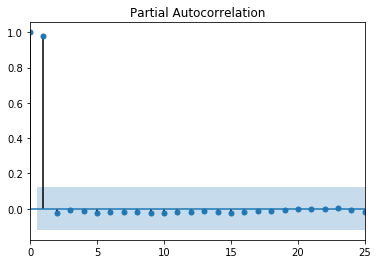

Price    76039
Name: RegionName, dtype: object


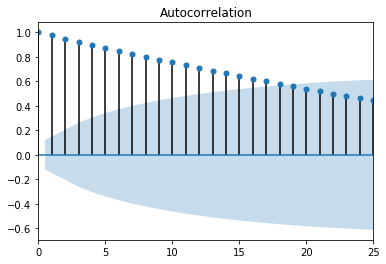

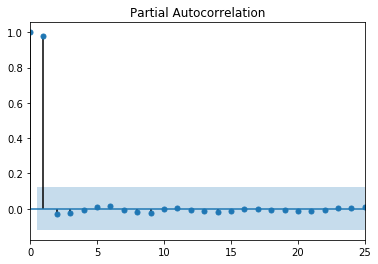

Price    76108
Name: RegionName, dtype: object


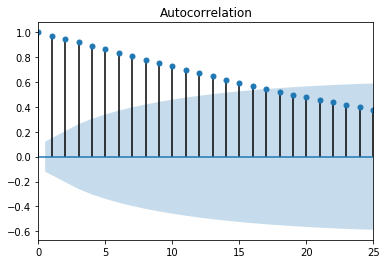

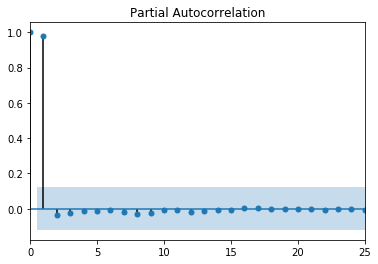

Price    76021
Name: RegionName, dtype: object


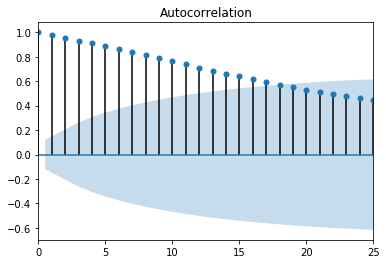

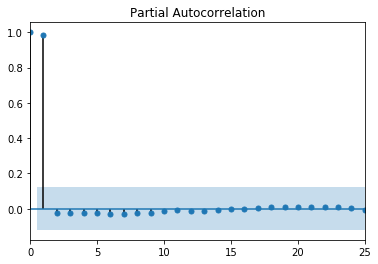

Price    76107
Name: RegionName, dtype: object


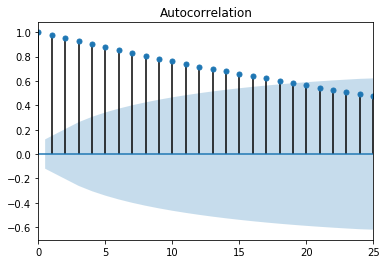

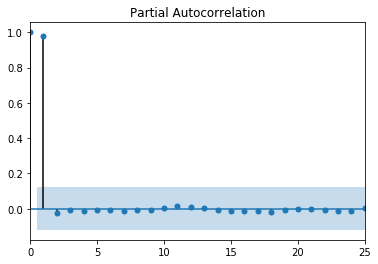

Price    76119
Name: RegionName, dtype: object


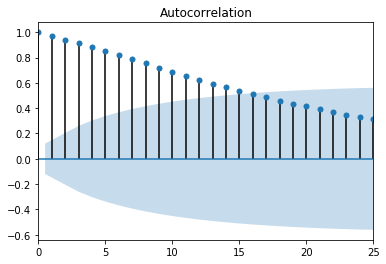

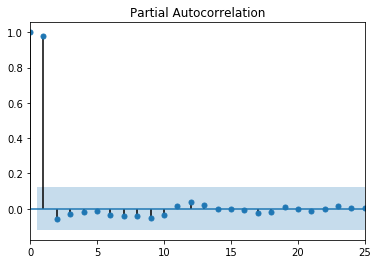

Price    76180
Name: RegionName, dtype: object


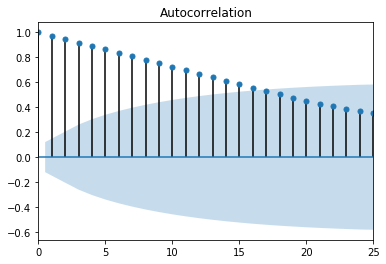

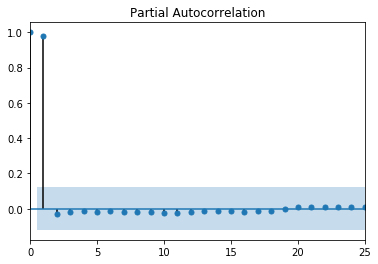

Price    76248
Name: RegionName, dtype: object


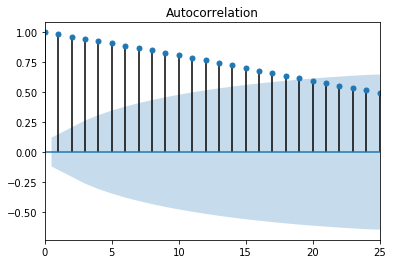

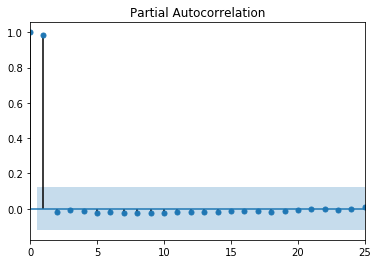

Price    76006
Name: RegionName, dtype: object


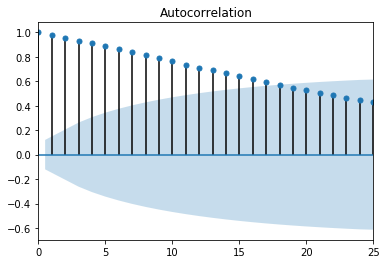

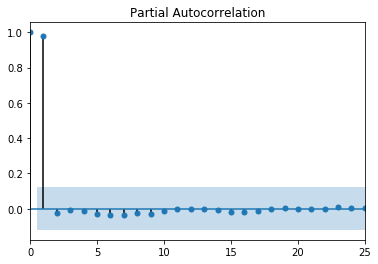

Price    76013
Name: RegionName, dtype: object


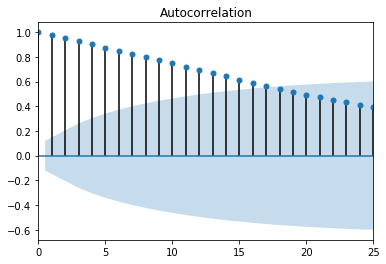

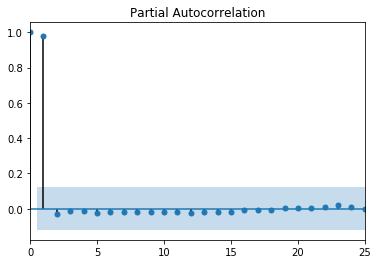

Price    76132
Name: RegionName, dtype: object


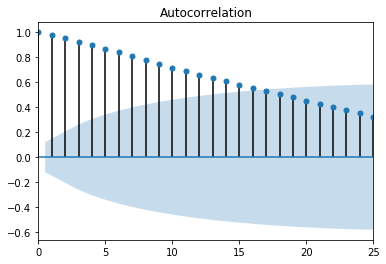

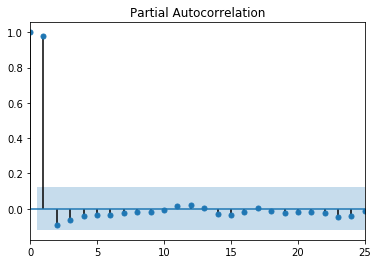

Price    76131
Name: RegionName, dtype: object


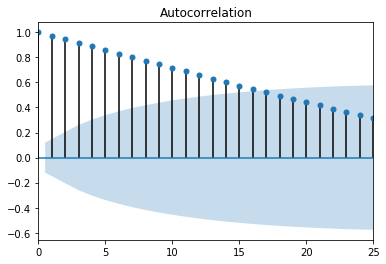

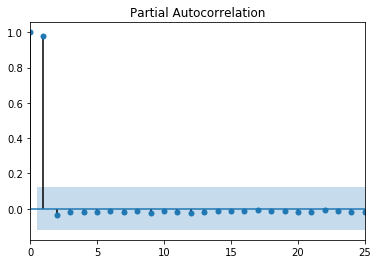

Price    76053
Name: RegionName, dtype: object


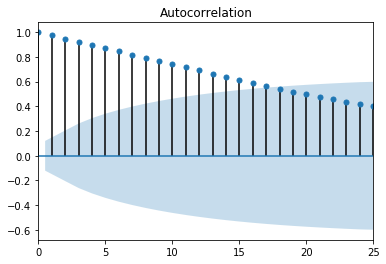

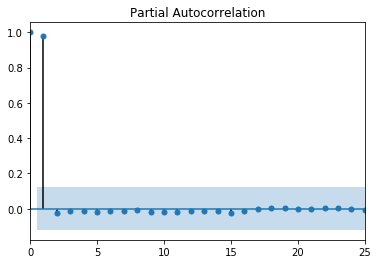

Price    76182
Name: RegionName, dtype: object


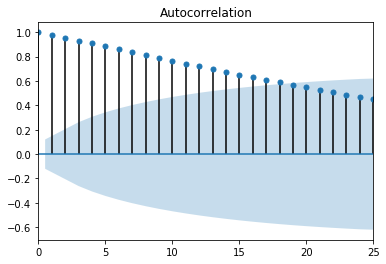

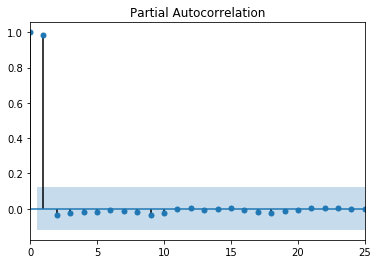

Price    76117
Name: RegionName, dtype: object


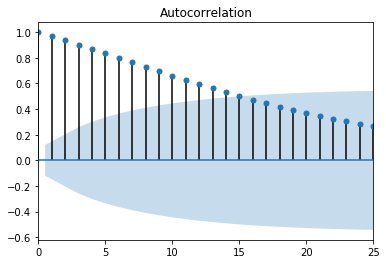

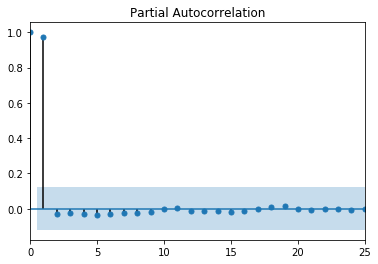

Price    76040
Name: RegionName, dtype: object


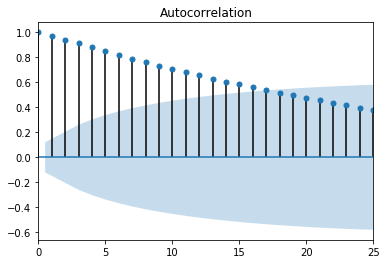

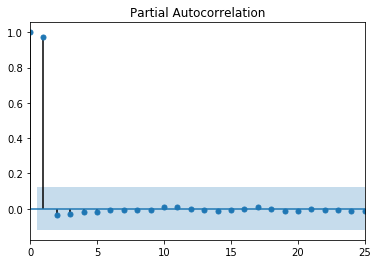

Price    76016
Name: RegionName, dtype: object


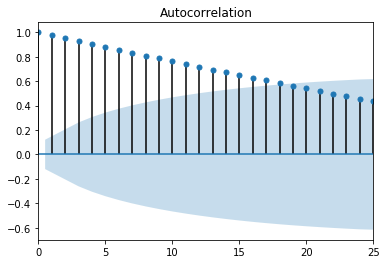

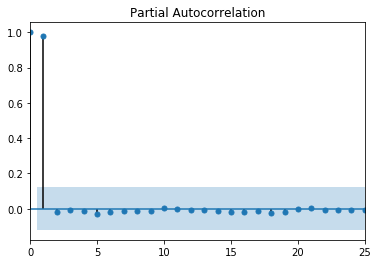

Price    76014
Name: RegionName, dtype: object


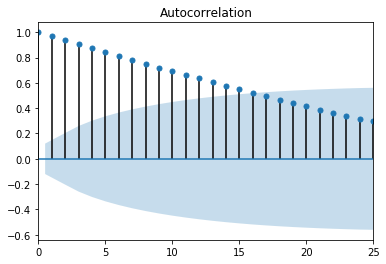

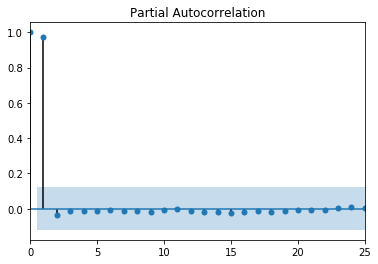

Price    76020
Name: RegionName, dtype: object


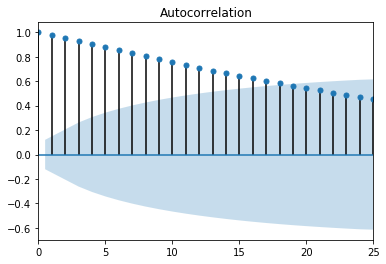

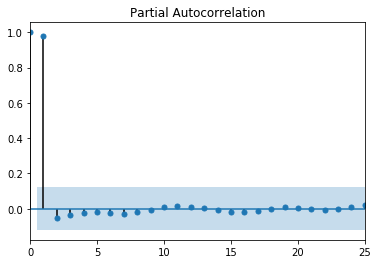

Price    76012
Name: RegionName, dtype: object


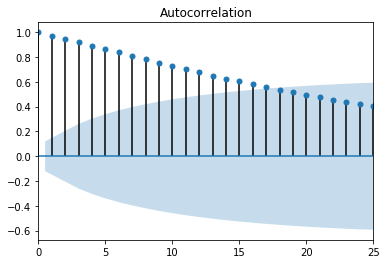

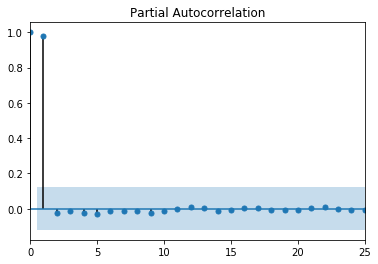

Price    76001
Name: RegionName, dtype: object


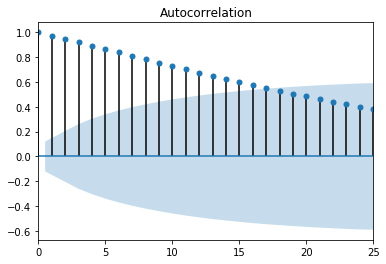

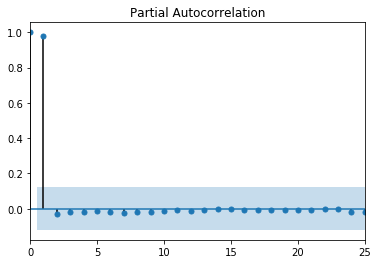

Price    76109
Name: RegionName, dtype: object


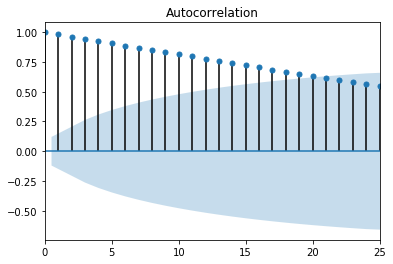

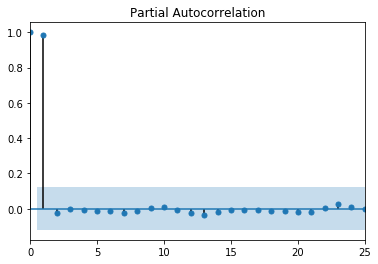

Price    76011
Name: RegionName, dtype: object


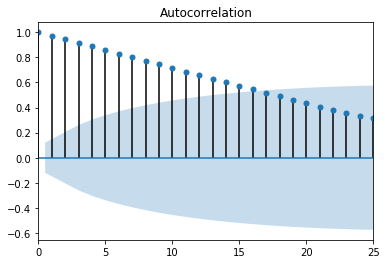

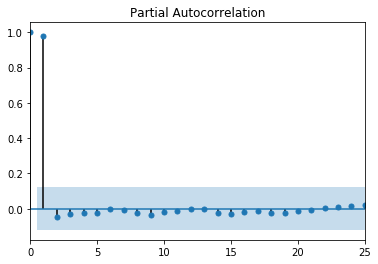

Price    76123
Name: RegionName, dtype: object


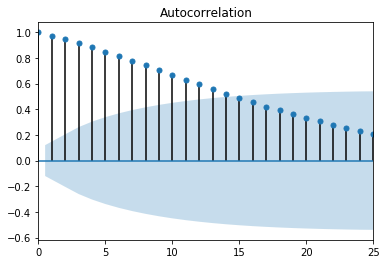

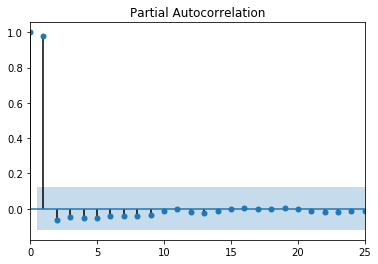

Price    76140
Name: RegionName, dtype: object


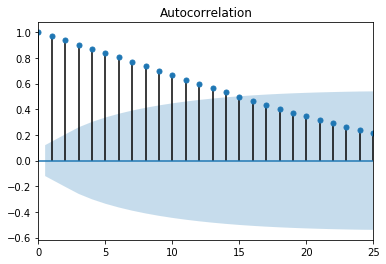

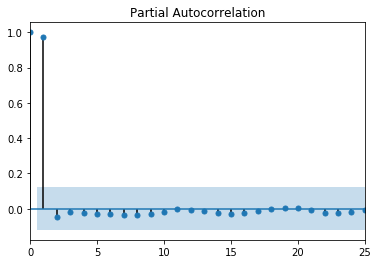

Price    76092
Name: RegionName, dtype: object


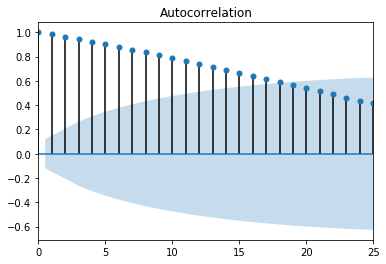

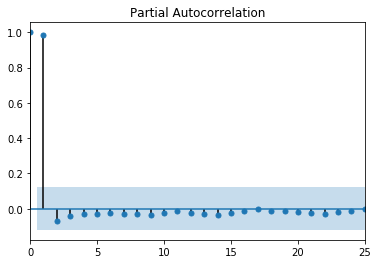

Price    76036
Name: RegionName, dtype: object


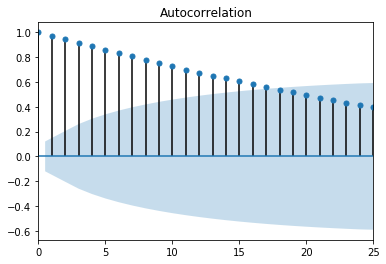

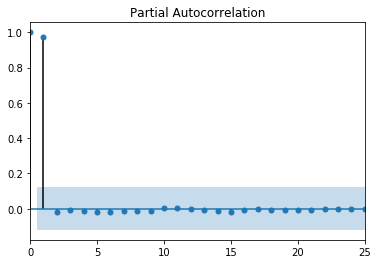

Price    76002
Name: RegionName, dtype: object


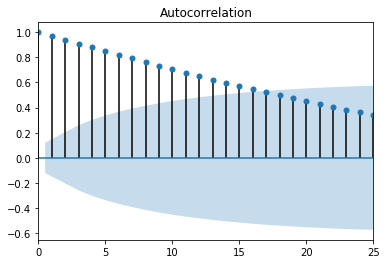

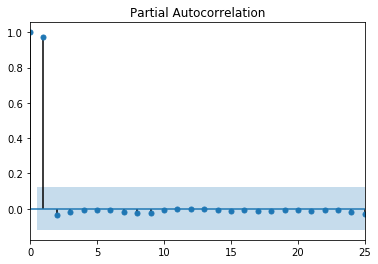

Price    76114
Name: RegionName, dtype: object


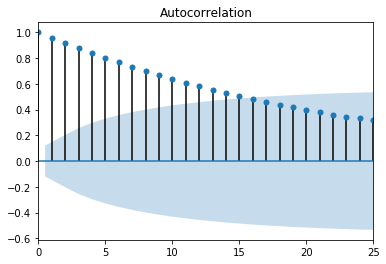

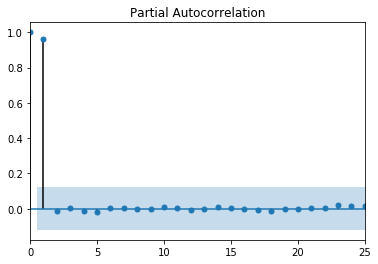

Price    76126
Name: RegionName, dtype: object


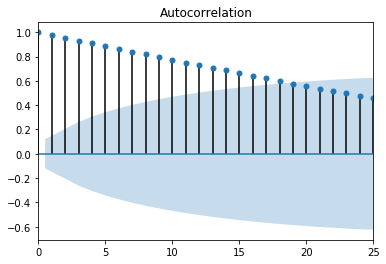

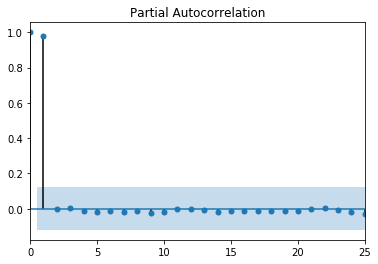

Price    76034
Name: RegionName, dtype: object


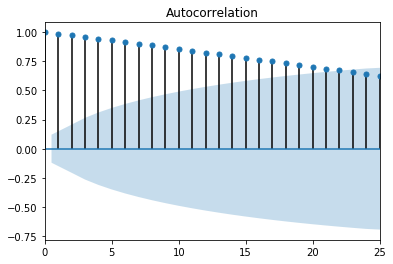

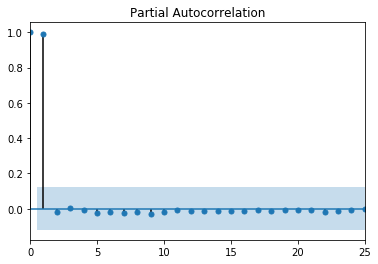

Price    76134
Name: RegionName, dtype: object


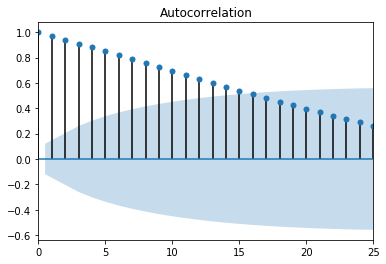

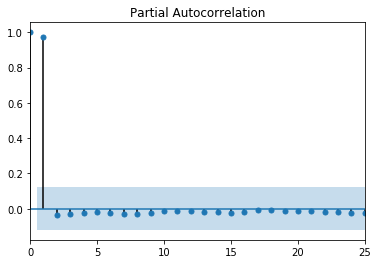

Price    76018
Name: RegionName, dtype: object


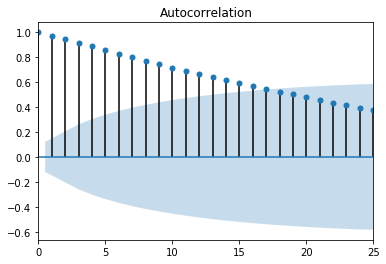

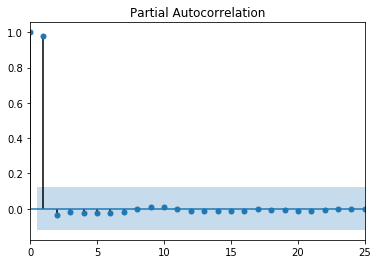

Price    76148
Name: RegionName, dtype: object


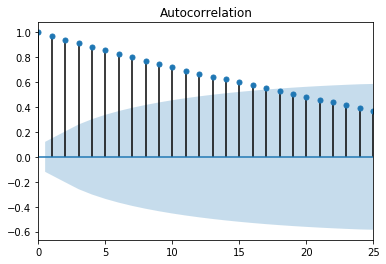

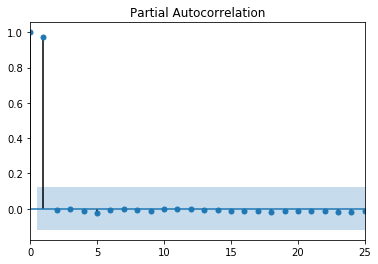

Price    76135
Name: RegionName, dtype: object


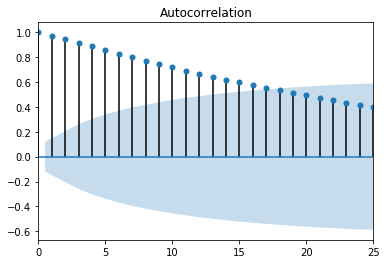

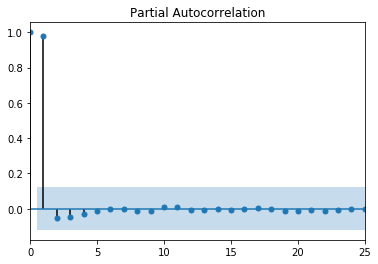

Price    76120
Name: RegionName, dtype: object


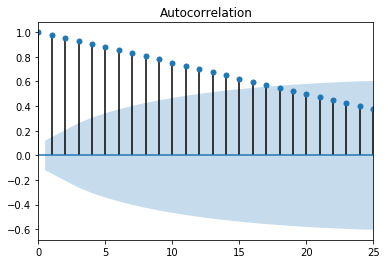

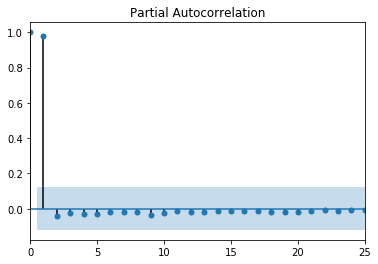

Price    76105
Name: RegionName, dtype: object


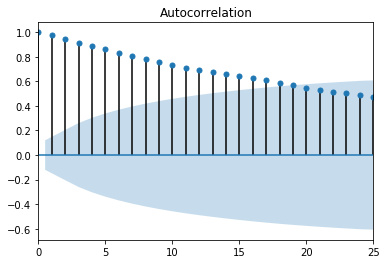

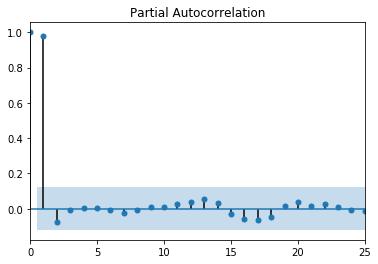

Price    76015
Name: RegionName, dtype: object


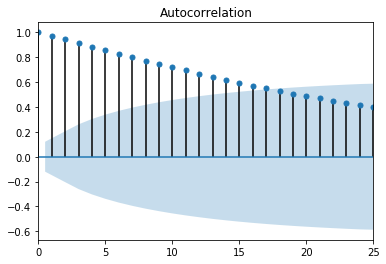

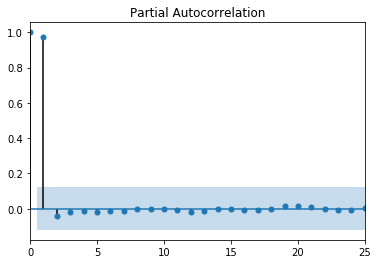

Price    76052
Name: RegionName, dtype: object


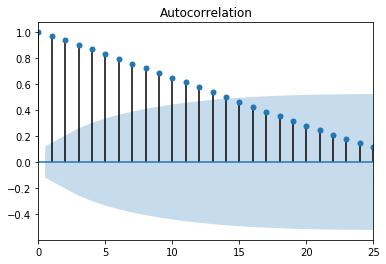

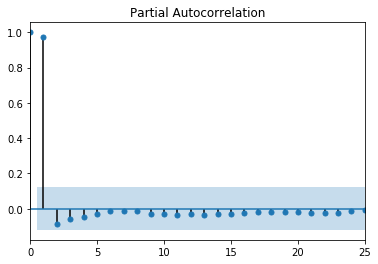

Price    76111
Name: RegionName, dtype: object


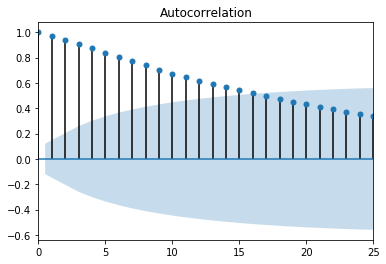

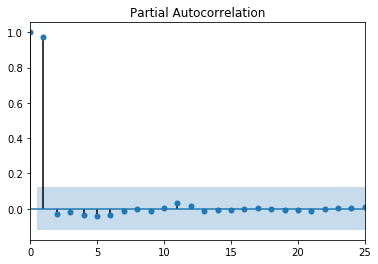

Price    76177
Name: RegionName, dtype: object


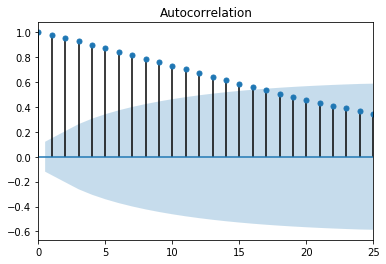

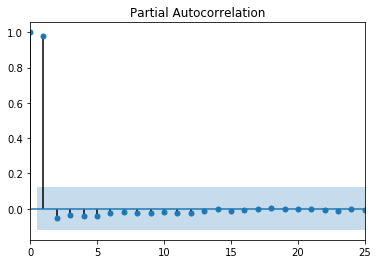

Price    76104
Name: RegionName, dtype: object


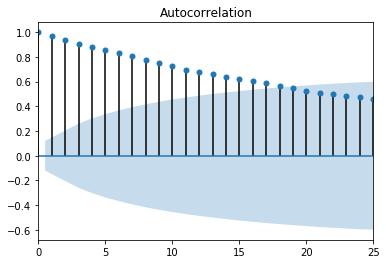

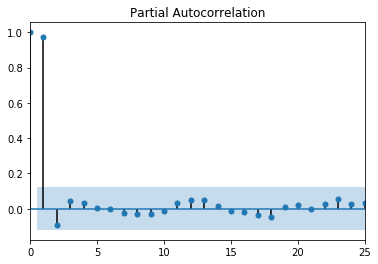

Price    76022
Name: RegionName, dtype: object


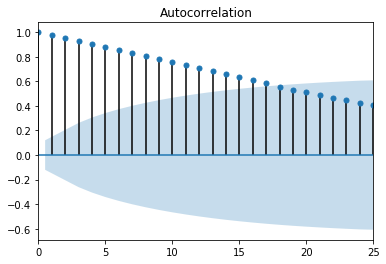

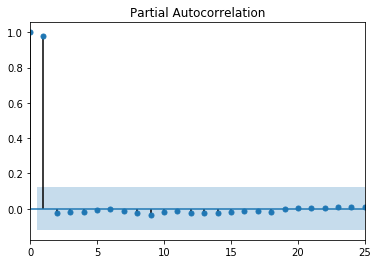

Price    76118
Name: RegionName, dtype: object


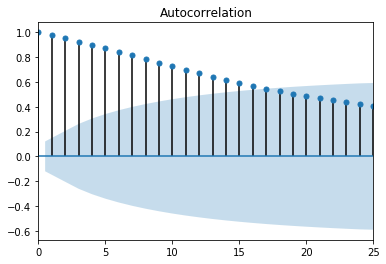

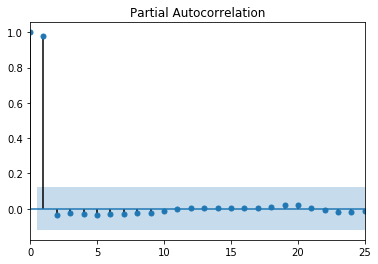

Price    76247
Name: RegionName, dtype: object


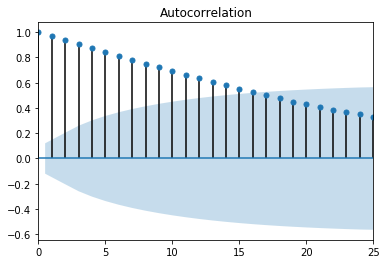

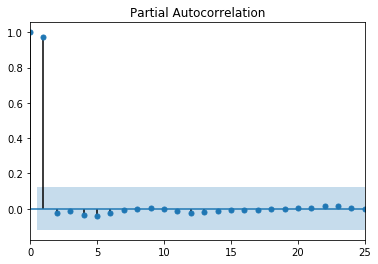

Price    76103
Name: RegionName, dtype: object


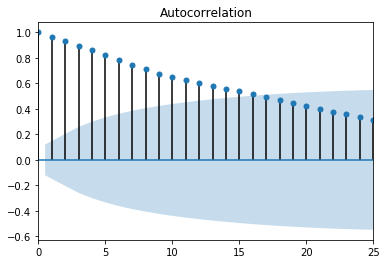

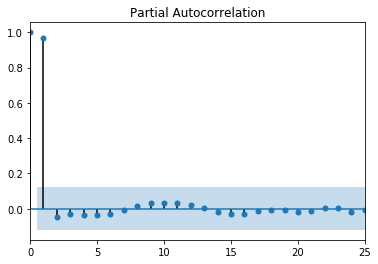

Price    76054
Name: RegionName, dtype: object


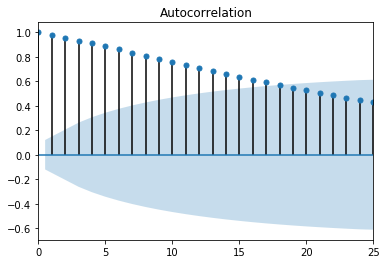

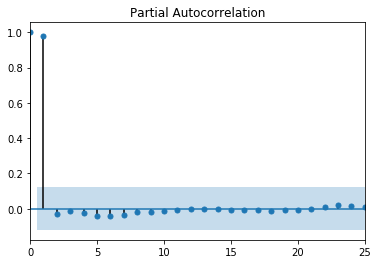

Price    76164
Name: RegionName, dtype: object


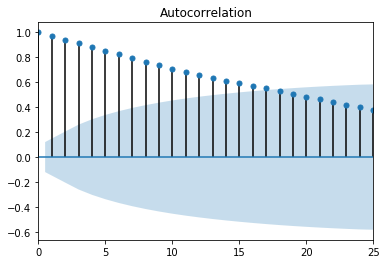

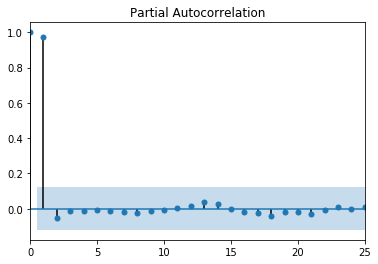

Price    76060
Name: RegionName, dtype: object


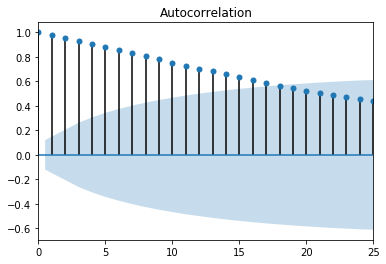

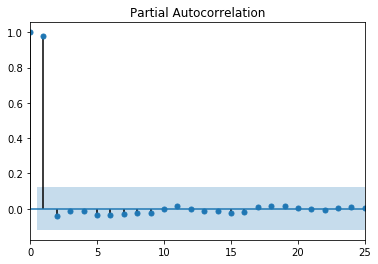

Price    76005
Name: RegionName, dtype: object


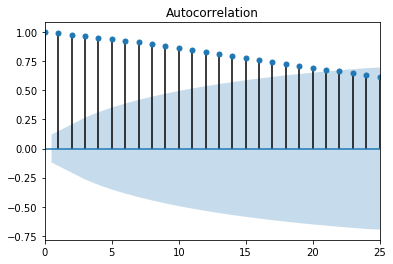

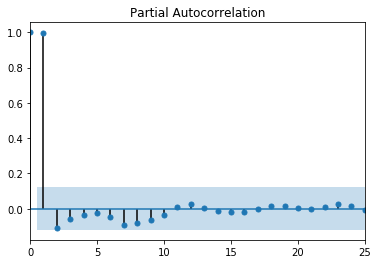

In [29]:
for i, j in enumerate(tarrant_data):
    print(tarrant_zip_codes[i])
    acf_pacf_for_data(np.asarray(j))

Price    78245
Name: RegionName, dtype: object


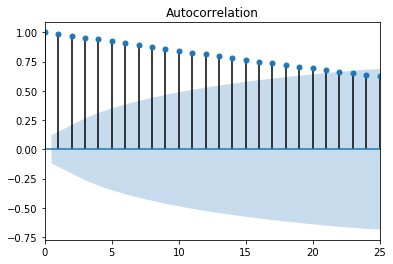

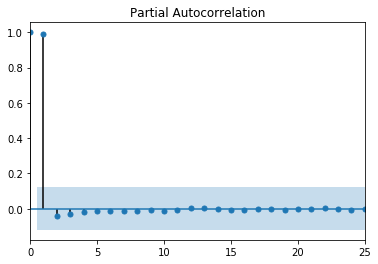

Price    78240
Name: RegionName, dtype: object


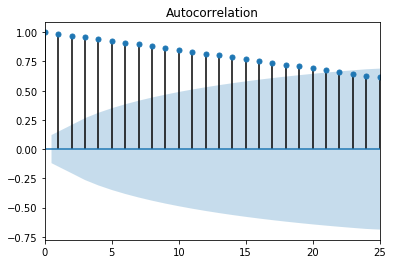

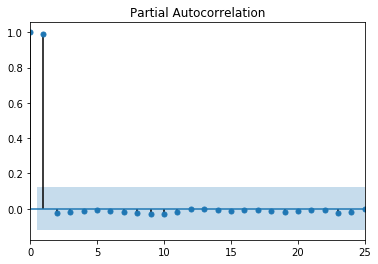

Price    78249
Name: RegionName, dtype: object


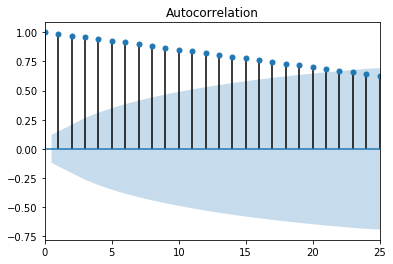

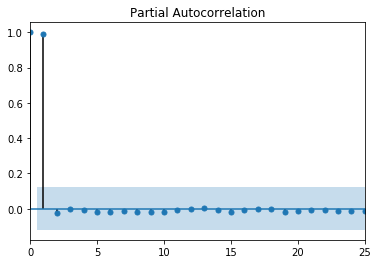

Price    78251
Name: RegionName, dtype: object


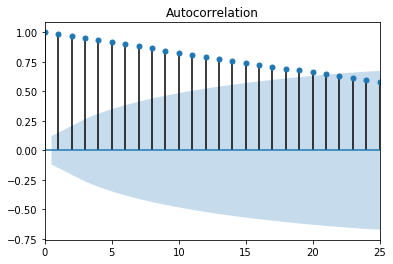

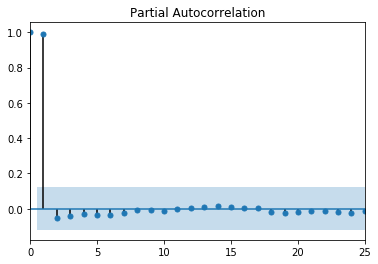

Price    78254
Name: RegionName, dtype: object


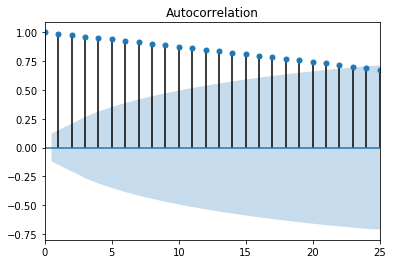

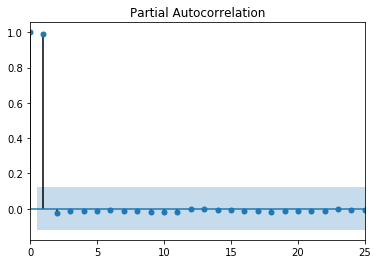

Price    78209
Name: RegionName, dtype: object


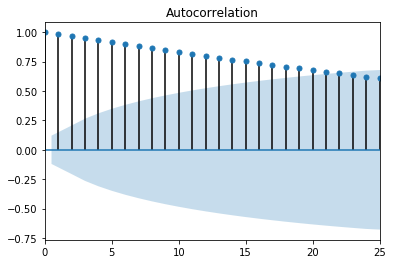

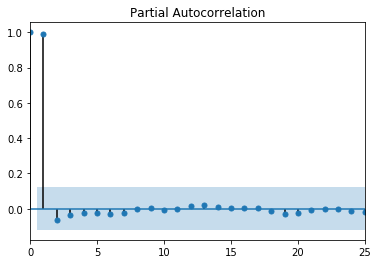

Price    78228
Name: RegionName, dtype: object


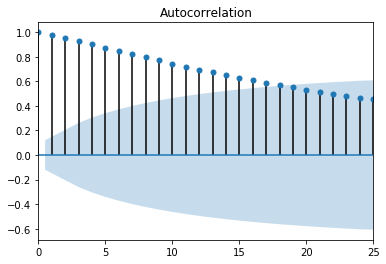

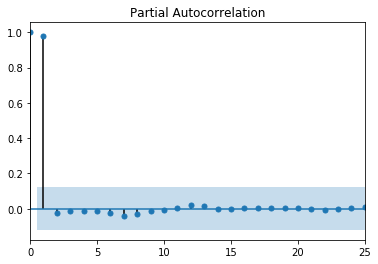

Price    78223
Name: RegionName, dtype: object


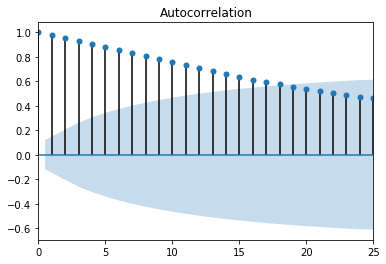

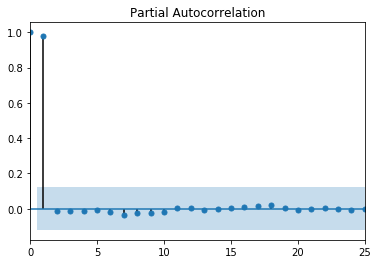

Price    78230
Name: RegionName, dtype: object


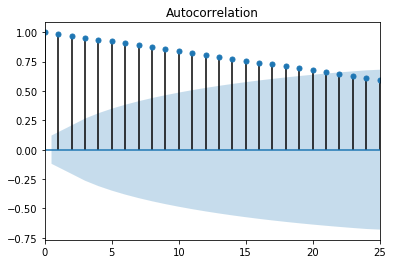

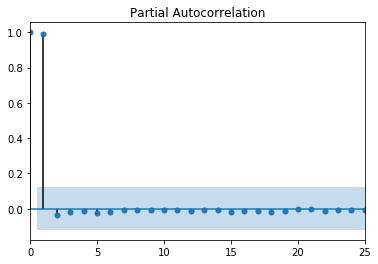

Price    78253
Name: RegionName, dtype: object


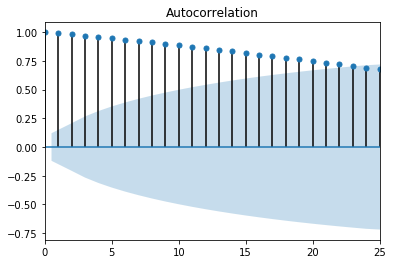

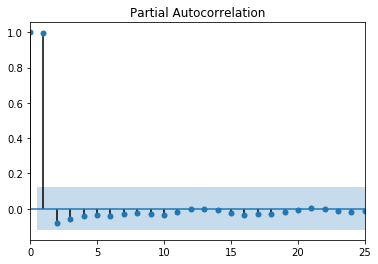

Price    78250
Name: RegionName, dtype: object


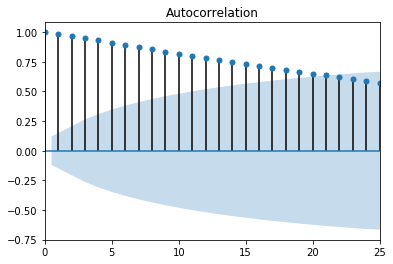

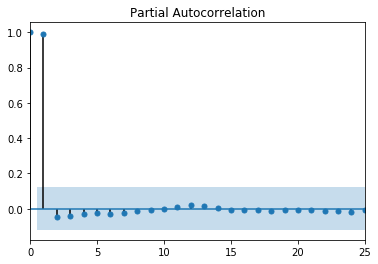

Price    78258
Name: RegionName, dtype: object


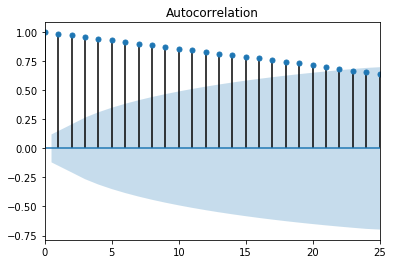

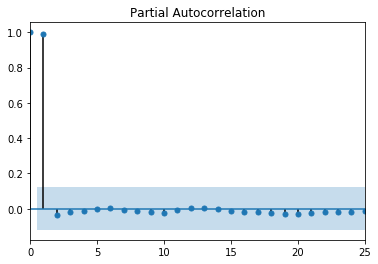

Price    78216
Name: RegionName, dtype: object


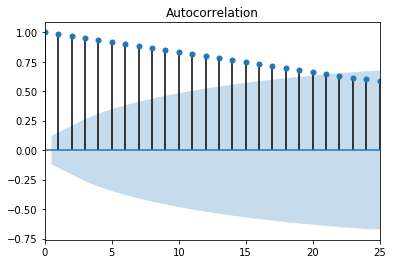

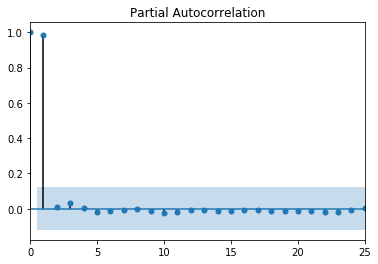

Price    78247
Name: RegionName, dtype: object


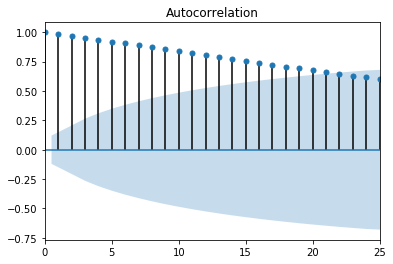

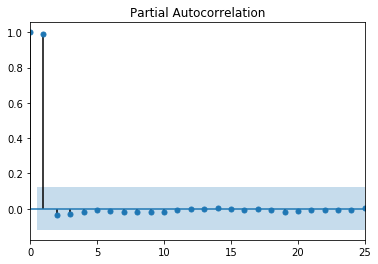

Price    78233
Name: RegionName, dtype: object


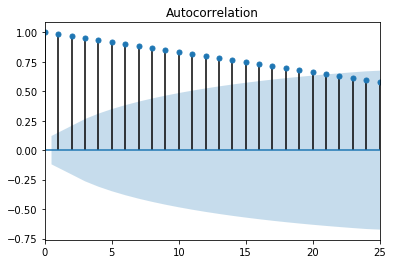

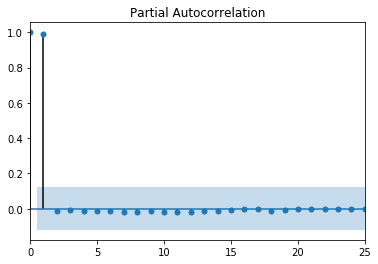

Price    78201
Name: RegionName, dtype: object


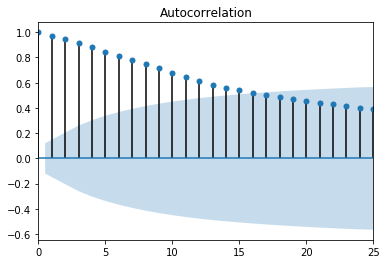

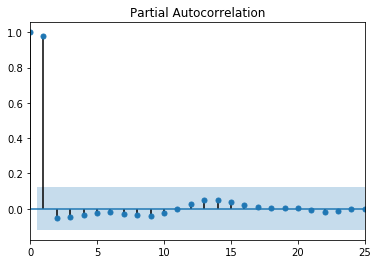

Price    78213
Name: RegionName, dtype: object


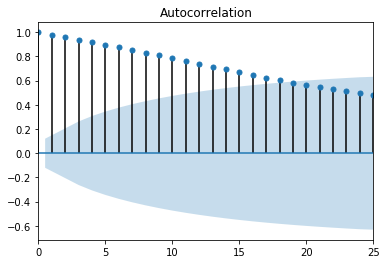

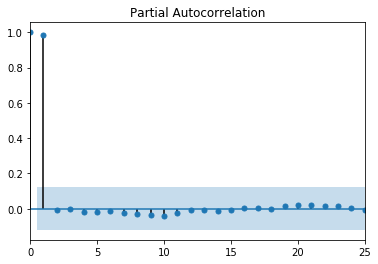

Price    78229
Name: RegionName, dtype: object


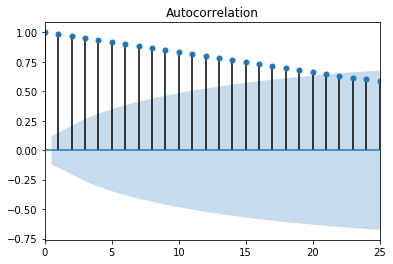

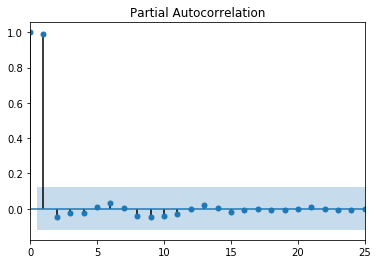

Price    78109
Name: RegionName, dtype: object


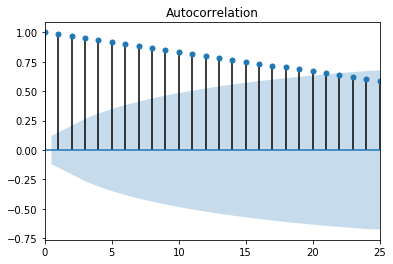

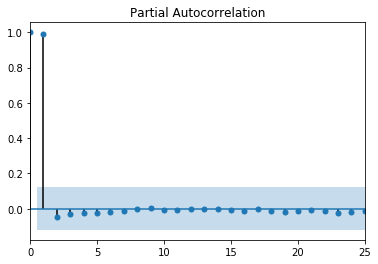

Price    78227
Name: RegionName, dtype: object


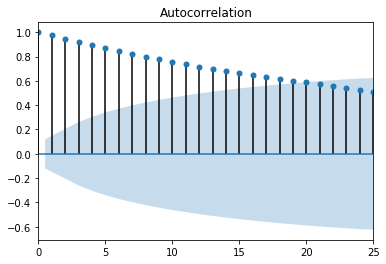

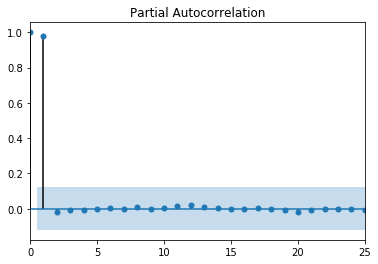

Price    78207
Name: RegionName, dtype: object


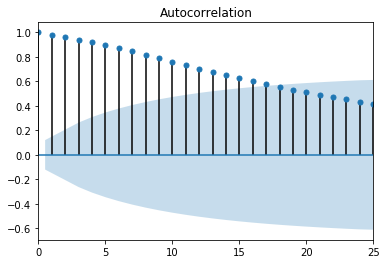

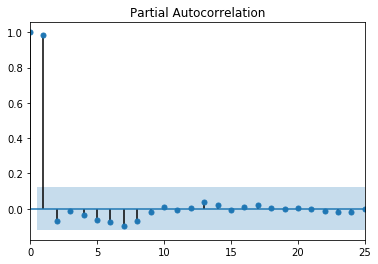

Price    78232
Name: RegionName, dtype: object


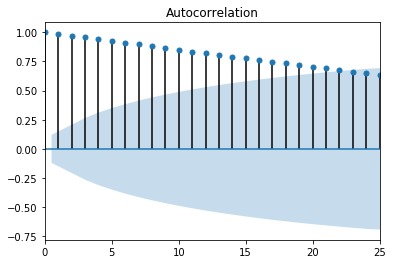

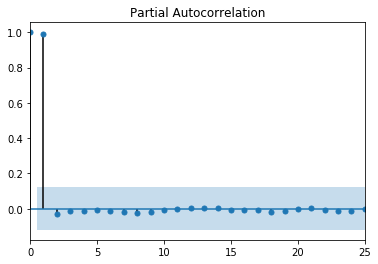

Price    78217
Name: RegionName, dtype: object


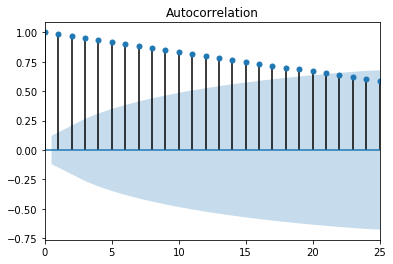

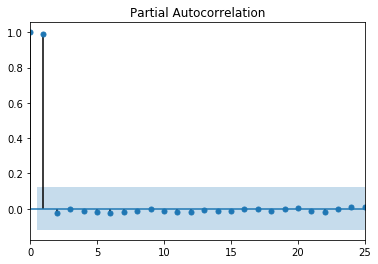

Price    78218
Name: RegionName, dtype: object


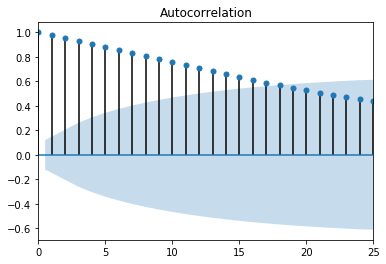

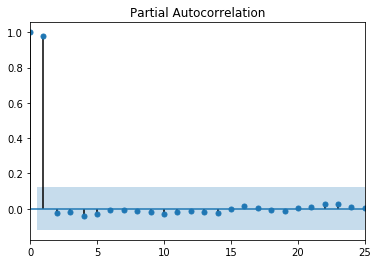

Price    78210
Name: RegionName, dtype: object


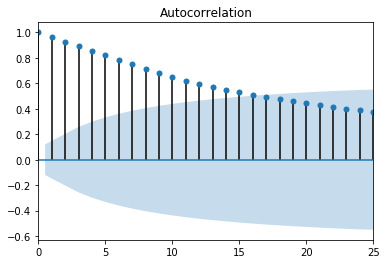

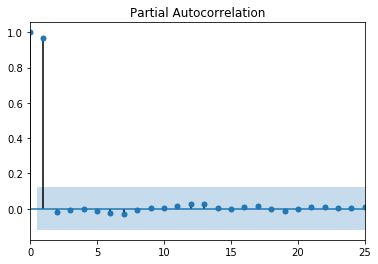

Price    78212
Name: RegionName, dtype: object


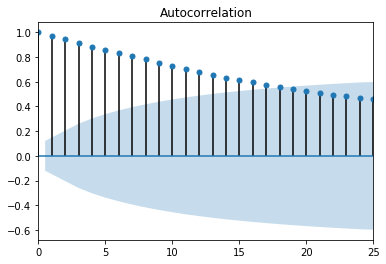

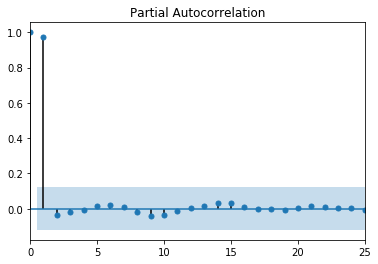

Price    78221
Name: RegionName, dtype: object


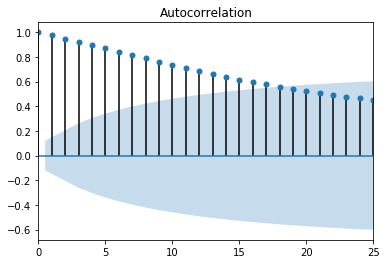

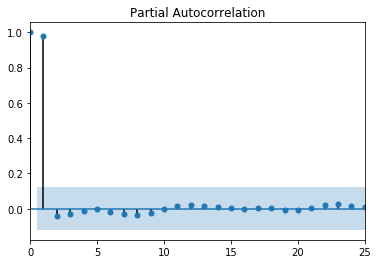

Price    78260
Name: RegionName, dtype: object


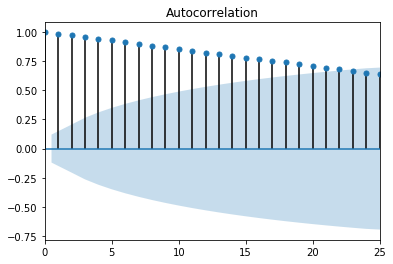

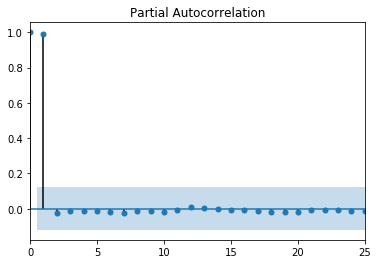

Price    78239
Name: RegionName, dtype: object


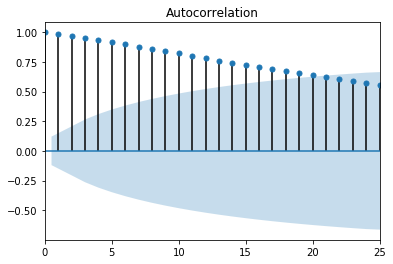

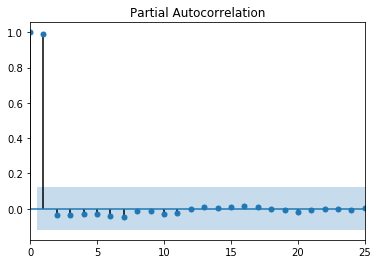

Price    78259
Name: RegionName, dtype: object


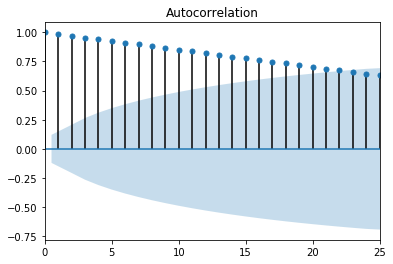

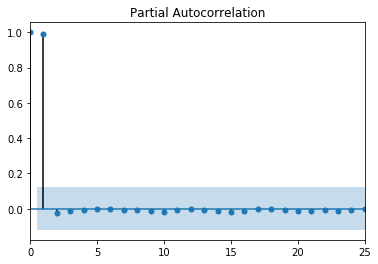

Price    78244
Name: RegionName, dtype: object


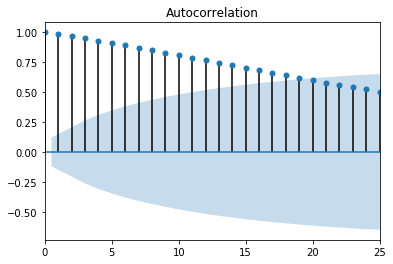

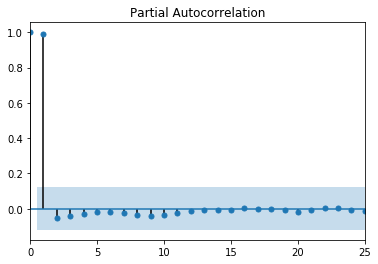

Price    78023
Name: RegionName, dtype: object


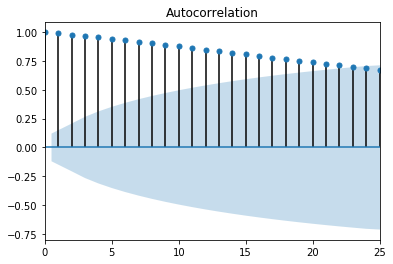

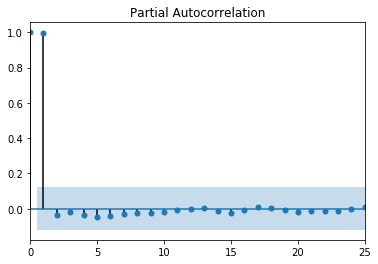

Price    78238
Name: RegionName, dtype: object


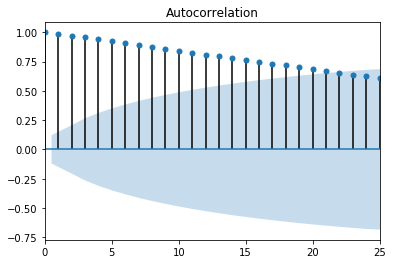

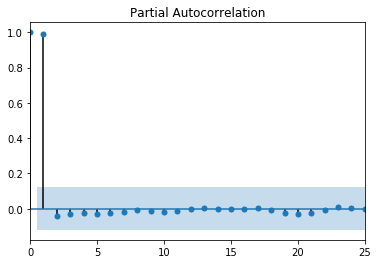

Price    78242
Name: RegionName, dtype: object


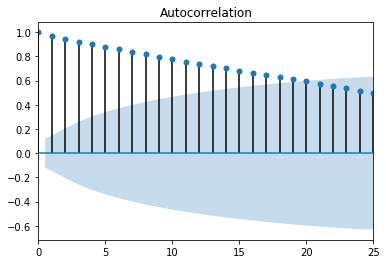

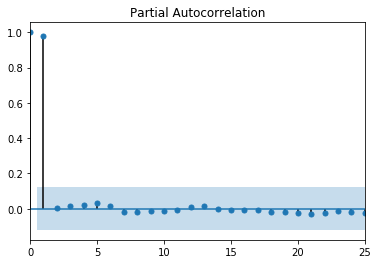

Price    78211
Name: RegionName, dtype: object


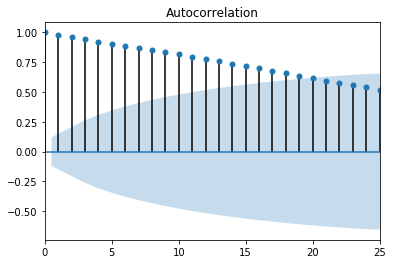

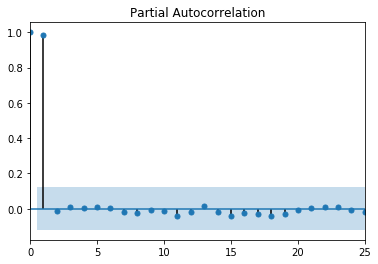

Price    78148
Name: RegionName, dtype: object


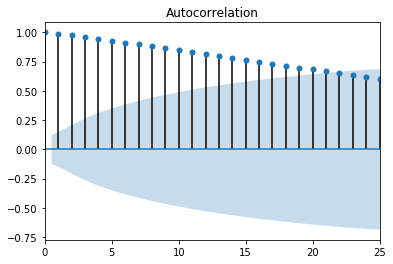

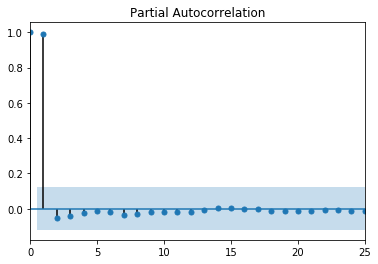

Price    78261
Name: RegionName, dtype: object


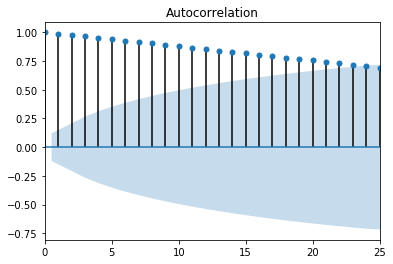

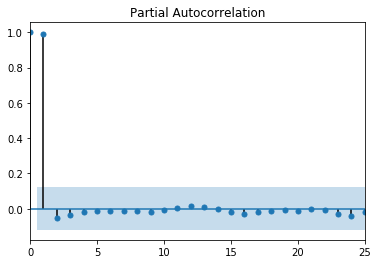

Price    78214
Name: RegionName, dtype: object


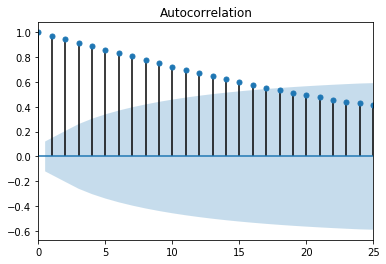

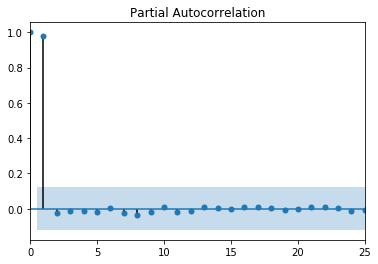

Price    78222
Name: RegionName, dtype: object


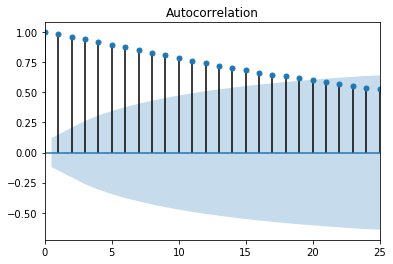

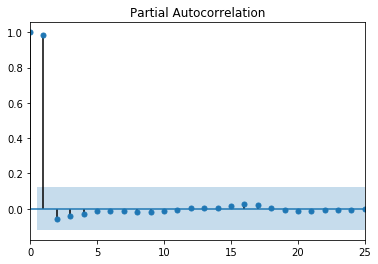

Price    78220
Name: RegionName, dtype: object


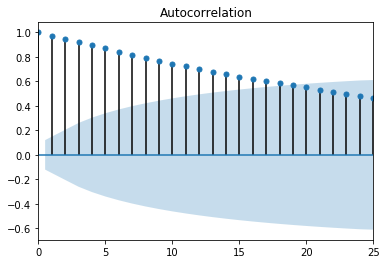

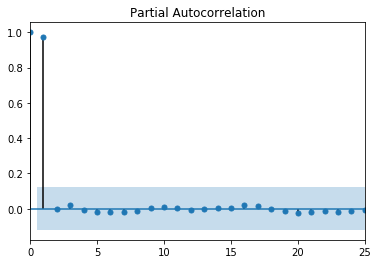

Price    78224
Name: RegionName, dtype: object


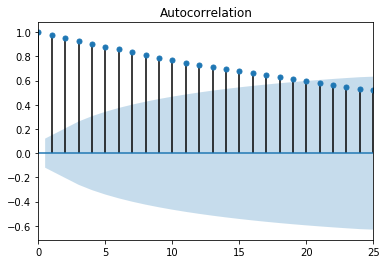

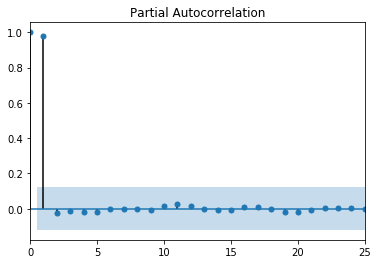

Price    78015
Name: RegionName, dtype: object


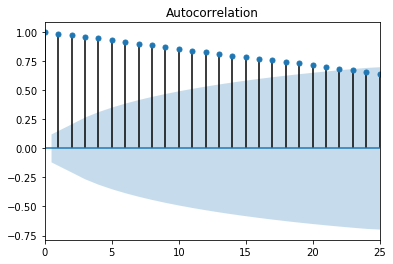

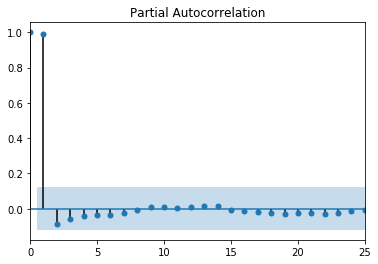

Price    78255
Name: RegionName, dtype: object


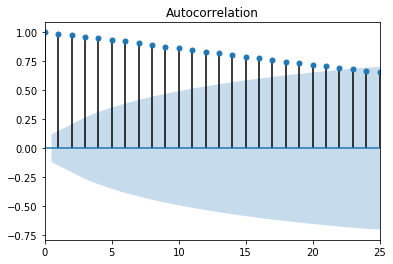

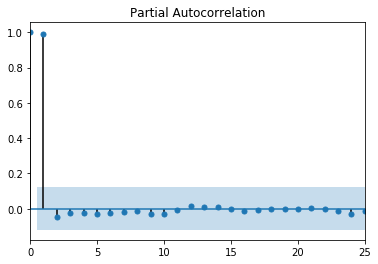

Price    78219
Name: RegionName, dtype: object


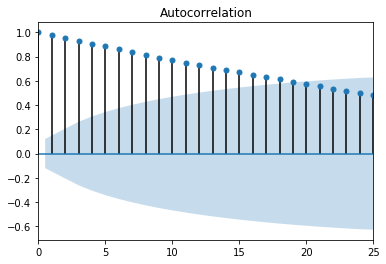

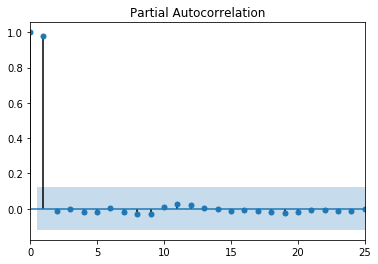

Price    78248
Name: RegionName, dtype: object


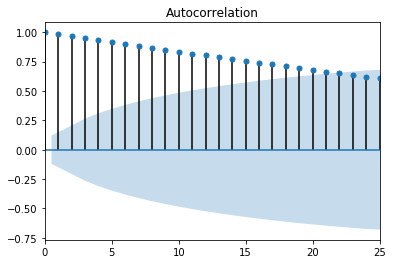

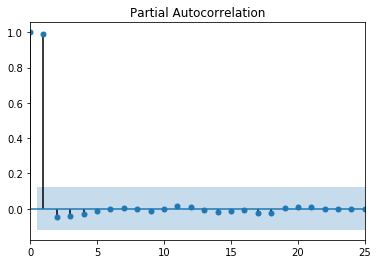

Price    78256
Name: RegionName, dtype: object


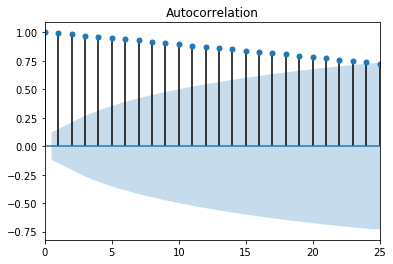

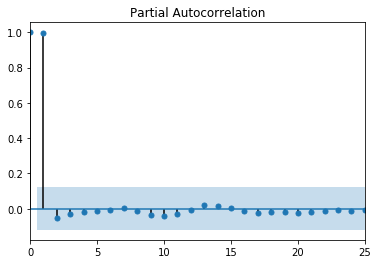

Price    78204
Name: RegionName, dtype: object


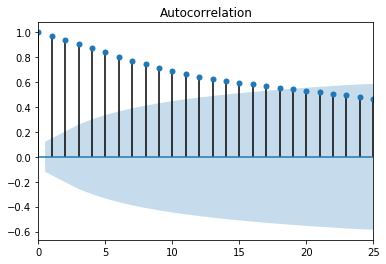

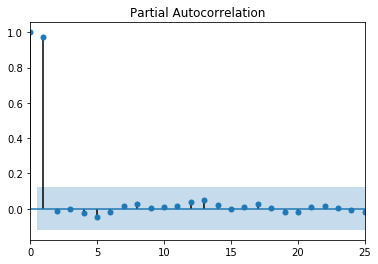

Price    78225
Name: RegionName, dtype: object


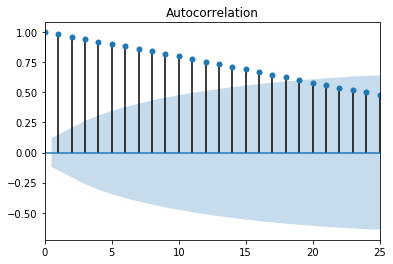

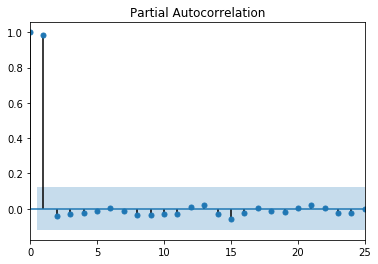

Price    78257
Name: RegionName, dtype: object


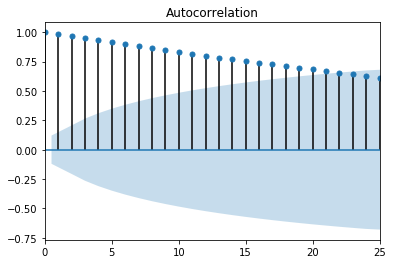

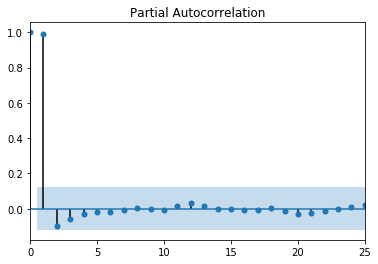

Price    78264
Name: RegionName, dtype: object


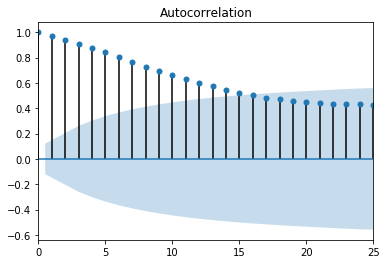

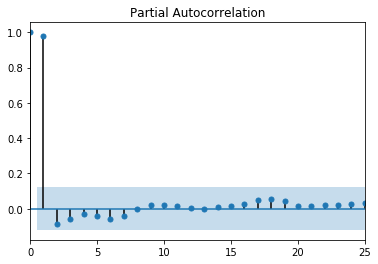

Price    78231
Name: RegionName, dtype: object


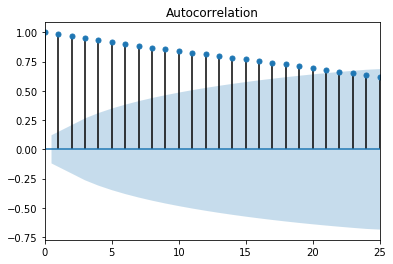

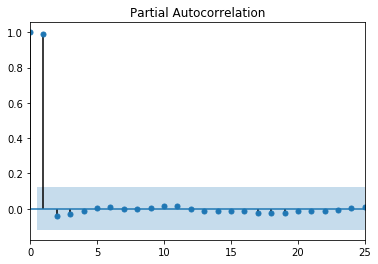

Price    78252
Name: RegionName, dtype: object


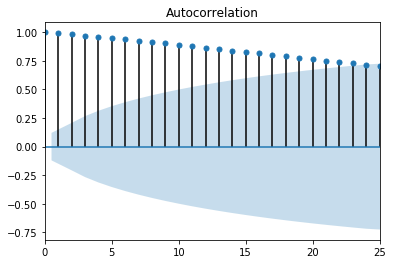

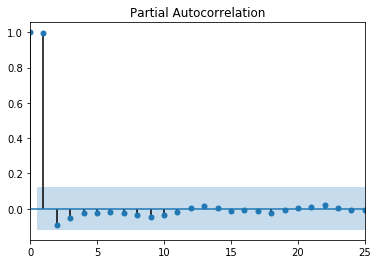

Price    78112
Name: RegionName, dtype: object


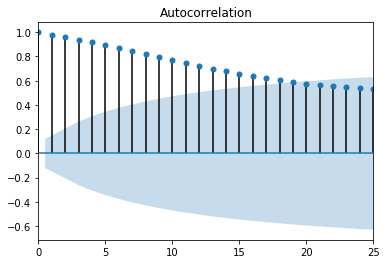

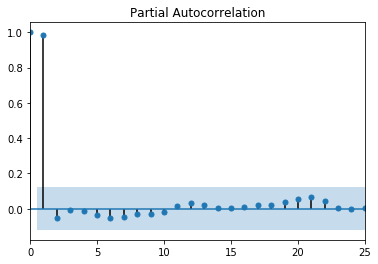

Price    78226
Name: RegionName, dtype: object


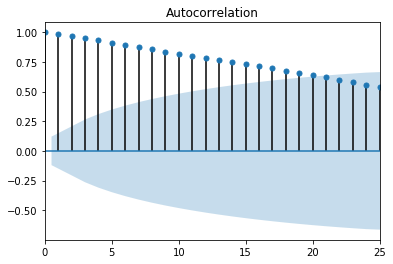

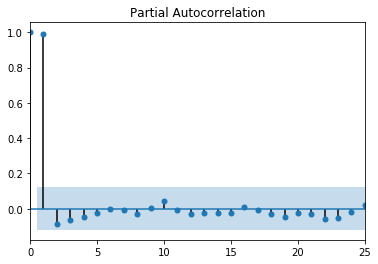

Price    78263
Name: RegionName, dtype: object


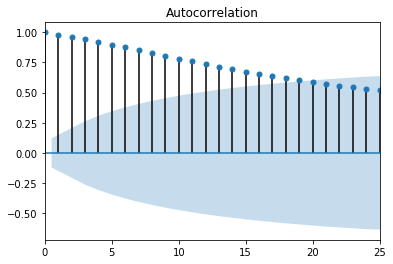

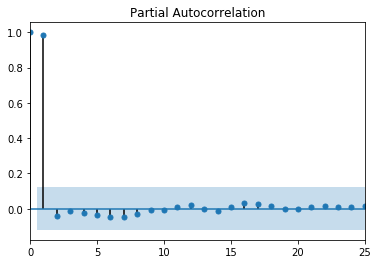

In [30]:
for i, j in enumerate(bexar_data):
    print(bexar_zip_codes[i])
    acf_pacf_for_data(np.asarray(j))

Price    78660
Name: RegionName, dtype: object


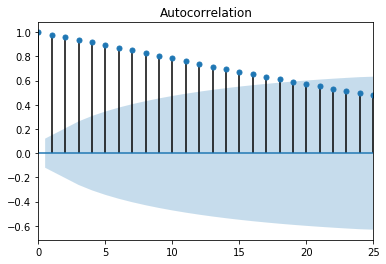

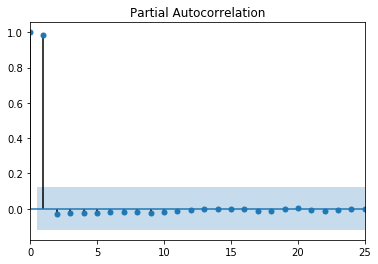

Price    78704
Name: RegionName, dtype: object


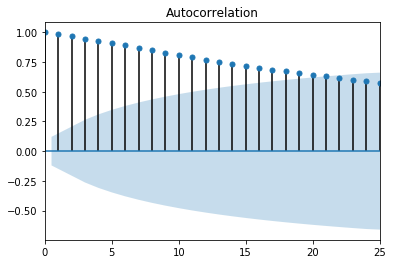

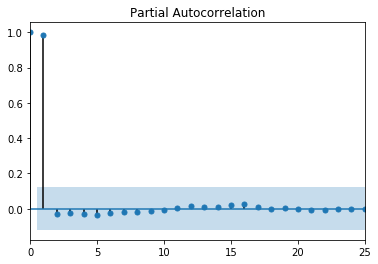

Price    78745
Name: RegionName, dtype: object


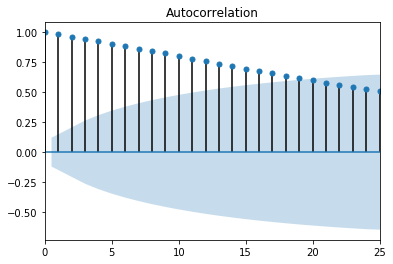

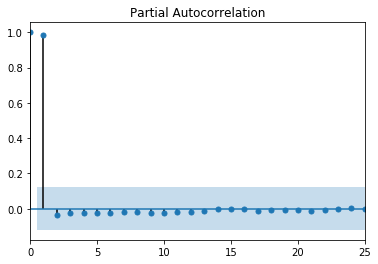

Price    78758
Name: RegionName, dtype: object


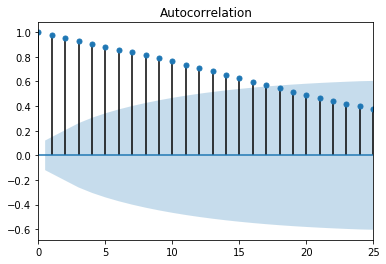

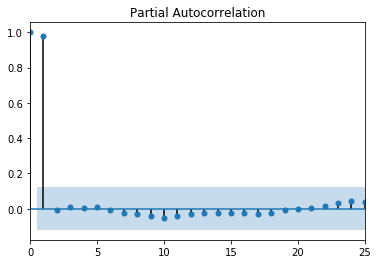

Price    78741
Name: RegionName, dtype: object


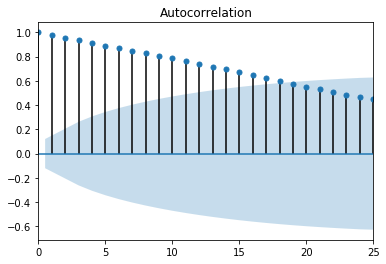

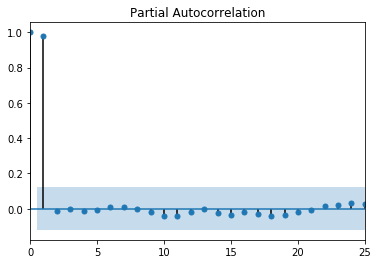

Price    78753
Name: RegionName, dtype: object


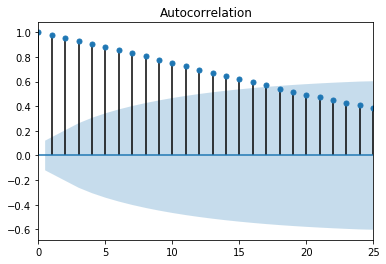

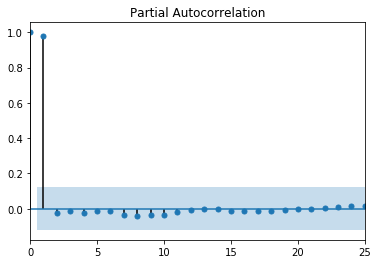

Price    78759
Name: RegionName, dtype: object


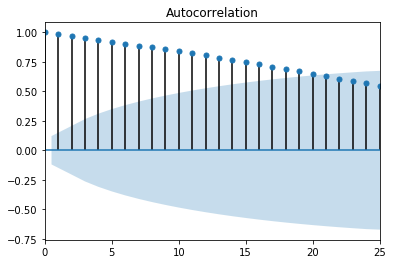

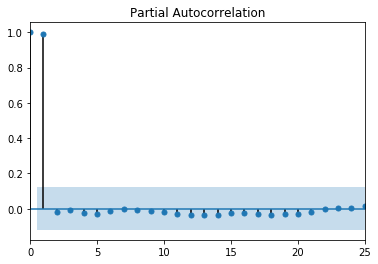

Price    78748
Name: RegionName, dtype: object


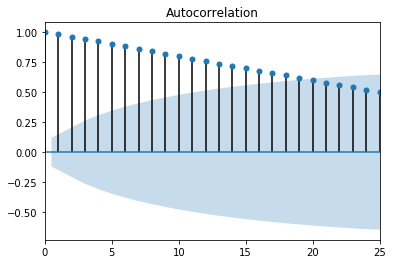

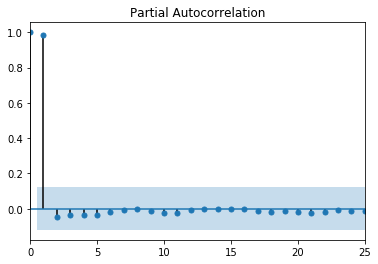

Price    78744
Name: RegionName, dtype: object


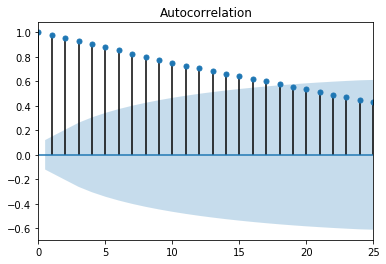

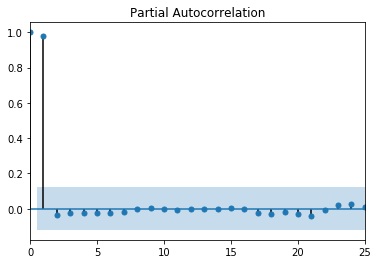

Price    78749
Name: RegionName, dtype: object


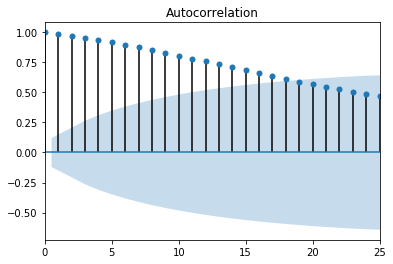

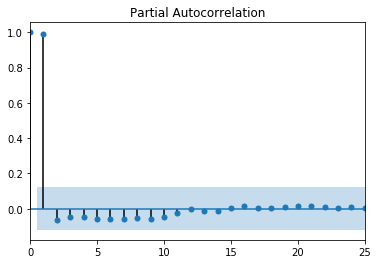

Price    78723
Name: RegionName, dtype: object


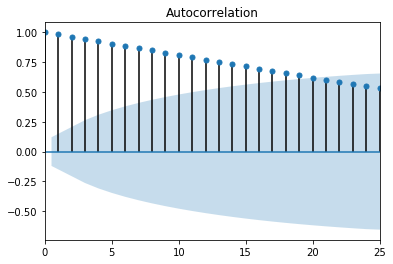

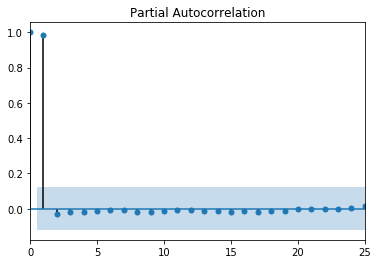

Price    78727
Name: RegionName, dtype: object


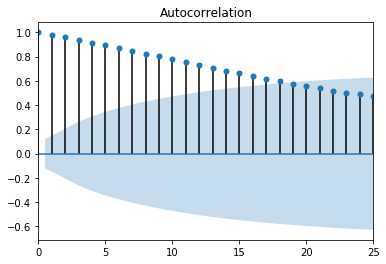

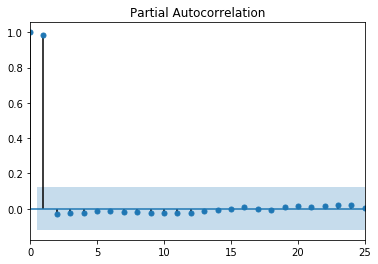

Price    78717
Name: RegionName, dtype: object


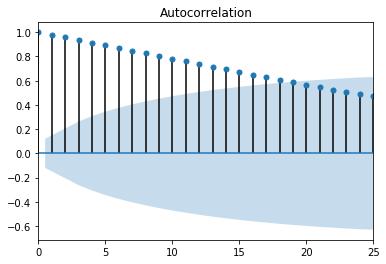

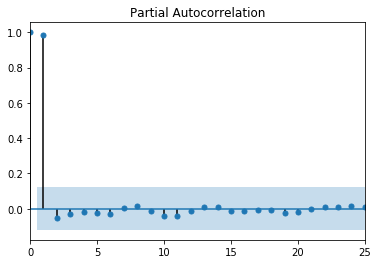

Price    78731
Name: RegionName, dtype: object


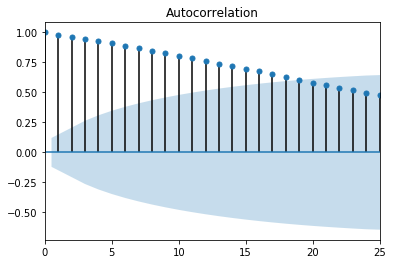

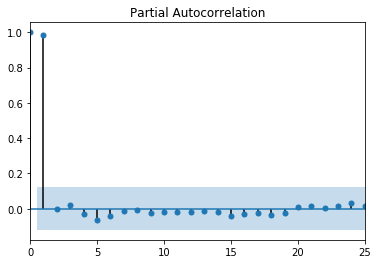

Price    78705
Name: RegionName, dtype: object


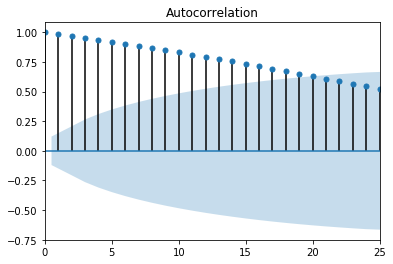

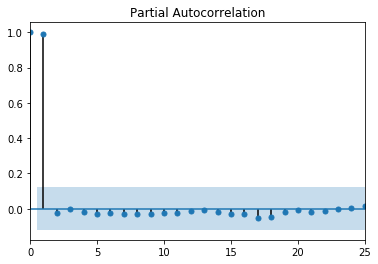

Price    78703
Name: RegionName, dtype: object


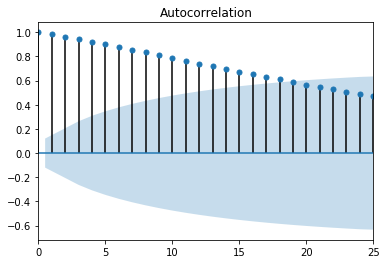

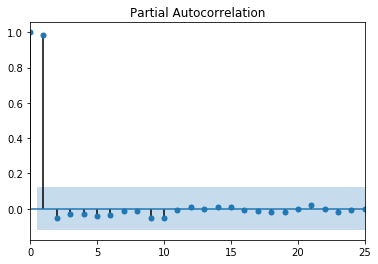

Price    78728
Name: RegionName, dtype: object


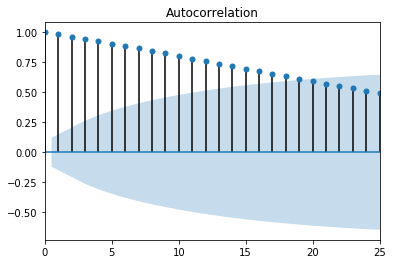

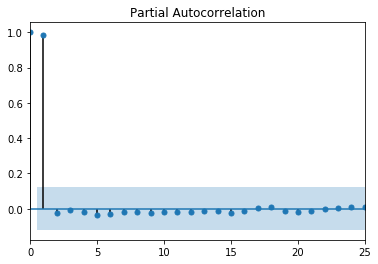

Price    78750
Name: RegionName, dtype: object


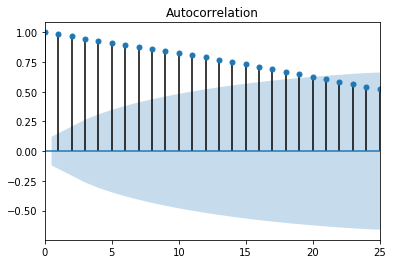

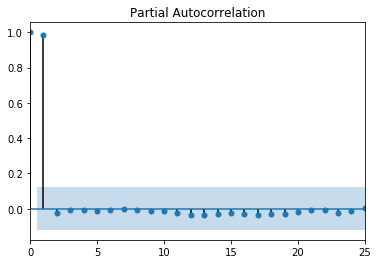

Price    78746
Name: RegionName, dtype: object


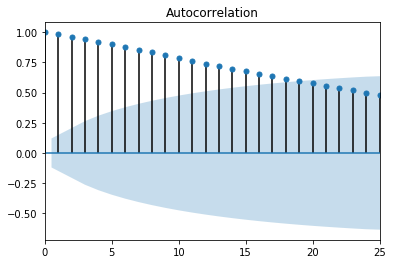

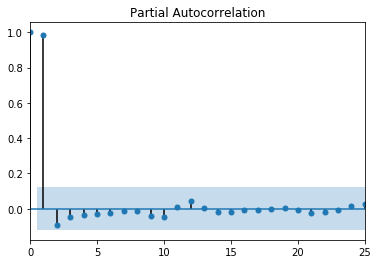

Price    78757
Name: RegionName, dtype: object


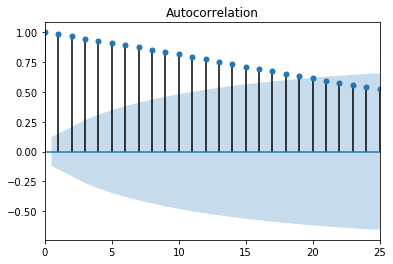

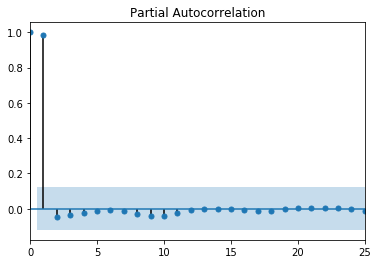

Price    78702
Name: RegionName, dtype: object


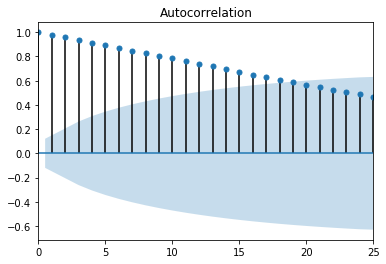

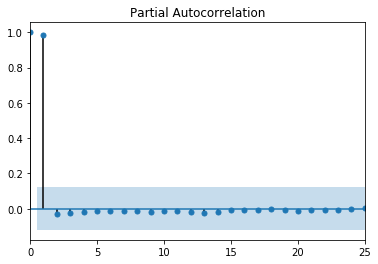

Price    78734
Name: RegionName, dtype: object


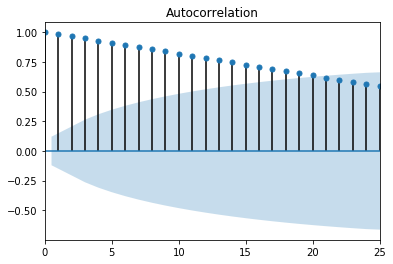

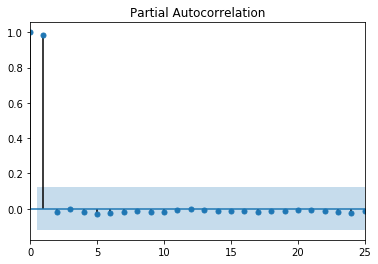

Price    78738
Name: RegionName, dtype: object


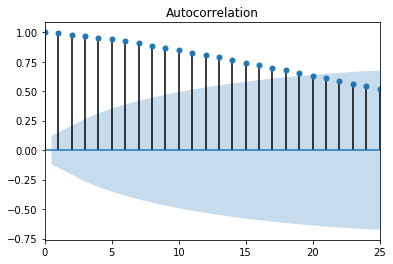

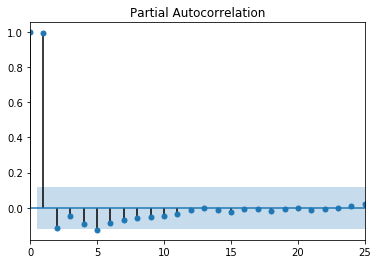

Price    78751
Name: RegionName, dtype: object


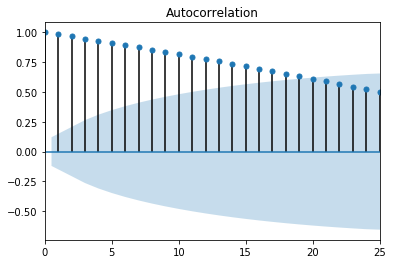

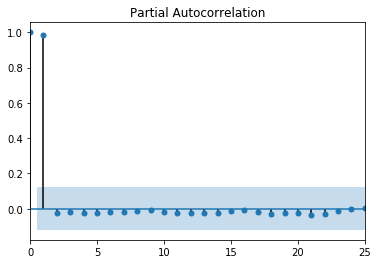

Price    78735
Name: RegionName, dtype: object


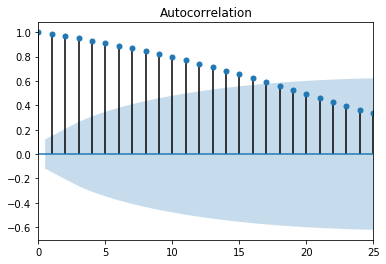

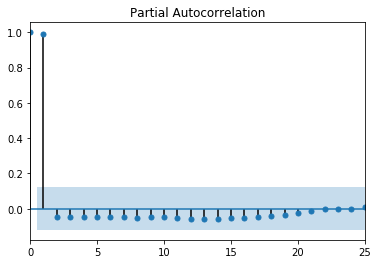

Price    78754
Name: RegionName, dtype: object


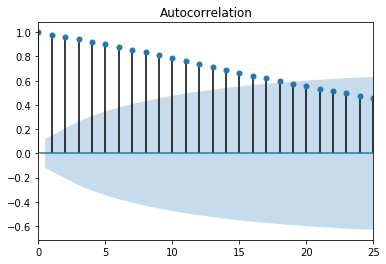

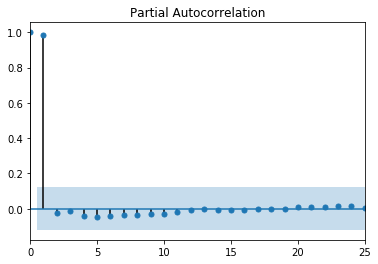

Price    78752
Name: RegionName, dtype: object


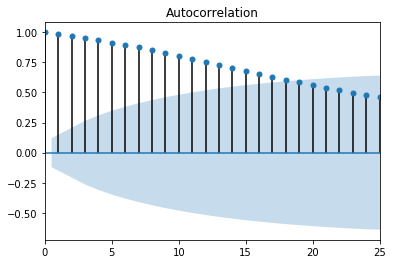

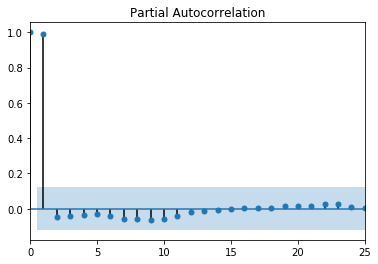

Price    78653
Name: RegionName, dtype: object


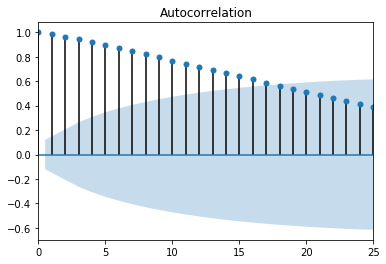

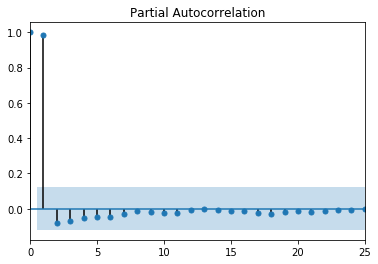

Price    78617
Name: RegionName, dtype: object


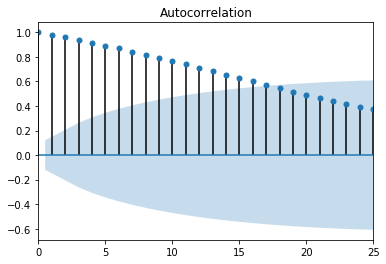

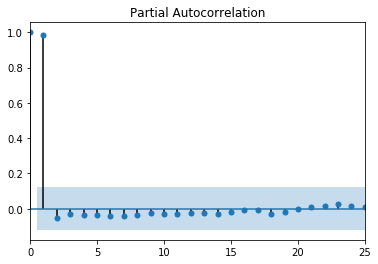

Price    78724
Name: RegionName, dtype: object


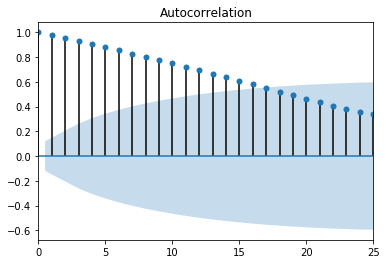

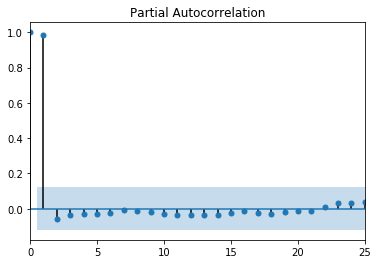

Price    78747
Name: RegionName, dtype: object


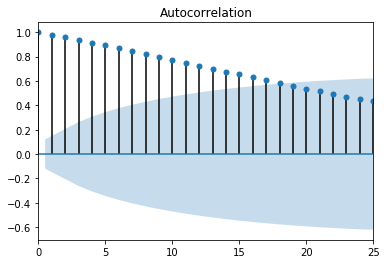

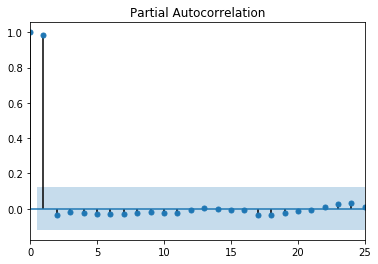

Price    78737
Name: RegionName, dtype: object


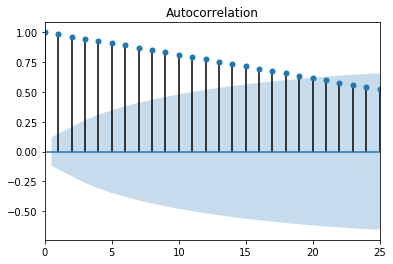

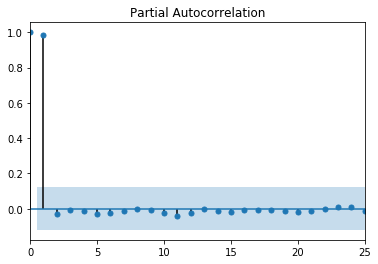

Price    78739
Name: RegionName, dtype: object


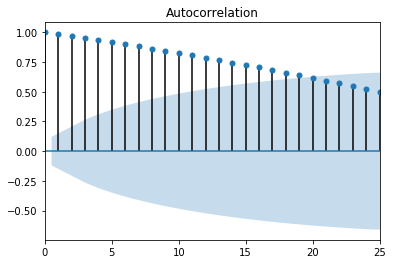

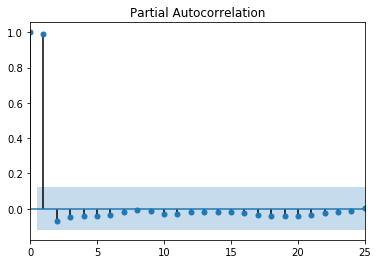

Price    78726
Name: RegionName, dtype: object


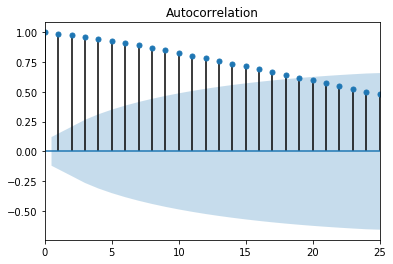

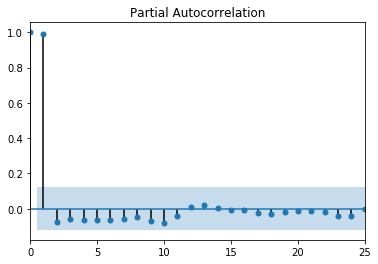

Price    78732
Name: RegionName, dtype: object


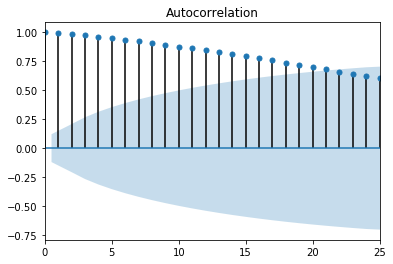

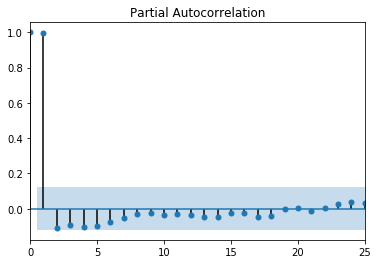

Price    78645
Name: RegionName, dtype: object


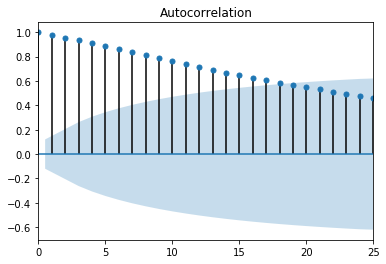

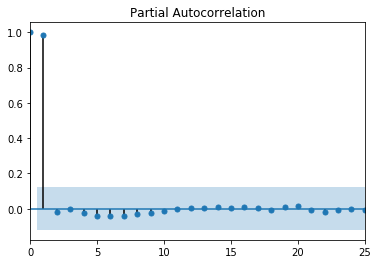

Price    78669
Name: RegionName, dtype: object


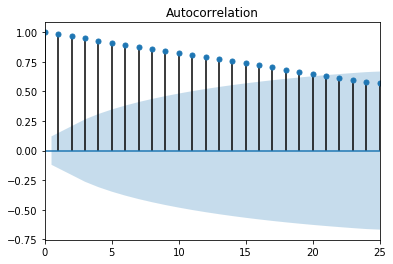

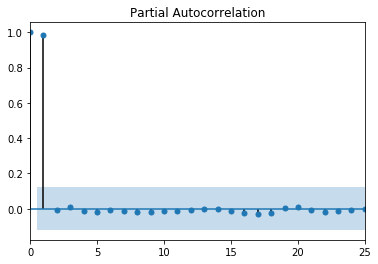

Price    78756
Name: RegionName, dtype: object


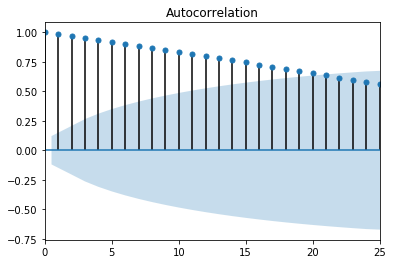

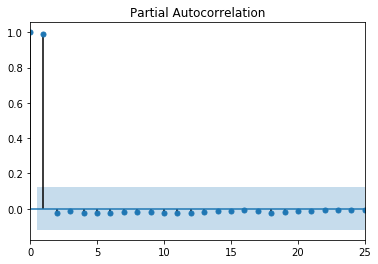

Price    78721
Name: RegionName, dtype: object


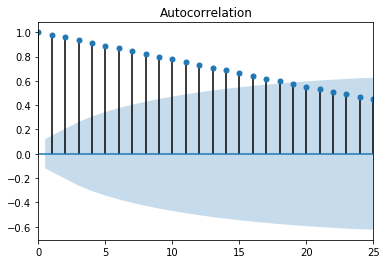

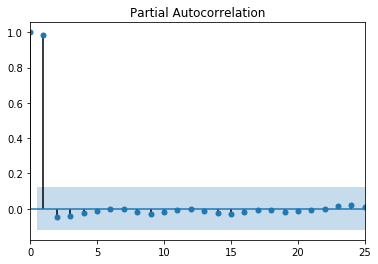

Price    78730
Name: RegionName, dtype: object


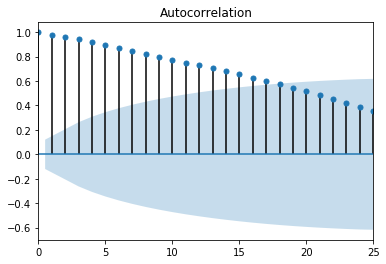

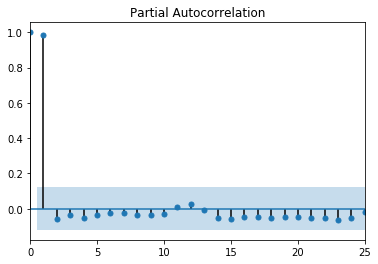

Price    78736
Name: RegionName, dtype: object


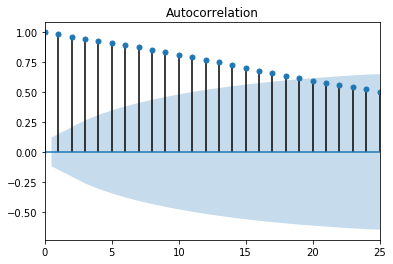

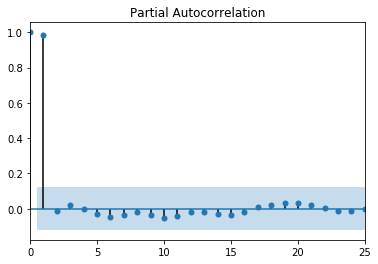

Price    78733
Name: RegionName, dtype: object


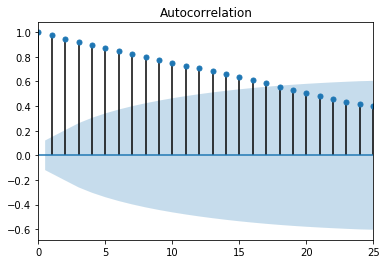

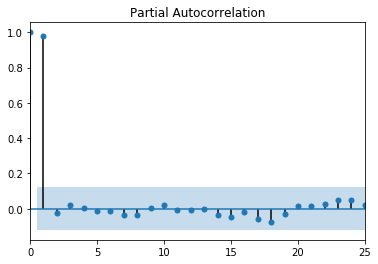

Price    78722
Name: RegionName, dtype: object


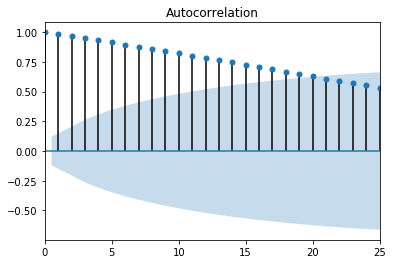

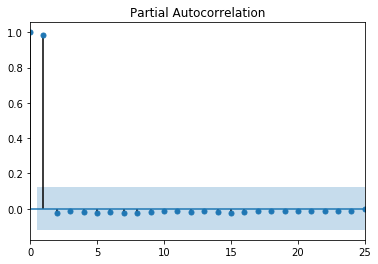

Price    78725
Name: RegionName, dtype: object


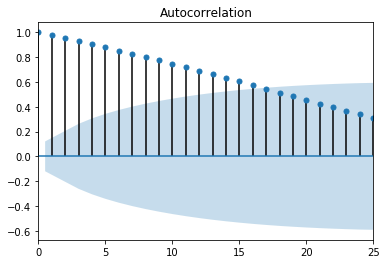

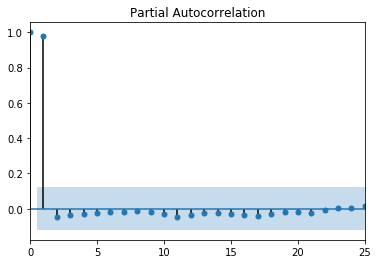

Price    78652
Name: RegionName, dtype: object


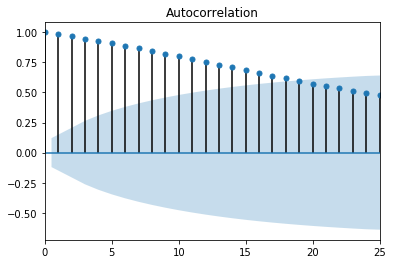

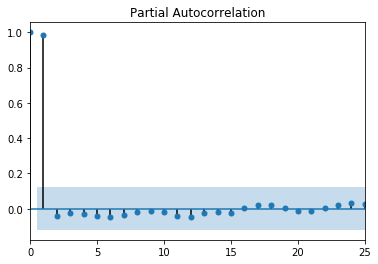

In [31]:
for i, j in enumerate(travis_data):
    print(travis_zip_codes[i])
    acf_pacf_for_data(np.asarray(j))

Data is already random walk

In [32]:
def rmse(data, base_forecast, best_forecast, test_period):
    from sklearn.metrics import mean_squared_error
    from math import sqrt
    print('Base ARIMA RMSE:', sqrt(mean_squared_error(data['Price'][-test_period:], base_forecast)))
    print('Best ARIMA RMSE:', sqrt(mean_squared_error(data['Price'][-test_period:], best_forecast[-test_period:])))
    base_rmse = sqrt(mean_squared_error(data['Price'][-test_period:], base_forecast))
    best_rmse = sqrt(mean_squared_error(data['Price'][-test_period:], best_forecast[-test_period:]))
    return base_rmse, best_rmse

In [33]:
harris_decision = pd.DataFrame()
harris_decision['Zip Code'] = harris_zip_codes
harris_base_rmse = []
harris_best_rmse = []
for i,j in enumerate(harris_data):
    print(i)
    base_rmse, best_rmse = rmse(j, harris_base_models[i][4], harris_best_models[i]['forecast'][0], 5*12)
    harris_base_rmse.append(base_rmse)
    harris_best_rmse.append(best_rmse)
harris_decision['Base RMSE'] = harris_base_rmse
harris_decision['Best RMSE'] = harris_best_rmse
harris_decision

0
Base ARIMA RMSE: 39077.88249111552
Best ARIMA RMSE: 41824.30690254241
1
Base ARIMA RMSE: 30064.891017181486
Best ARIMA RMSE: 45543.47443761525
2
Base ARIMA RMSE: 36463.925141163
Best ARIMA RMSE: 34814.23175928334
3
Base ARIMA RMSE: 41766.02285079006
Best ARIMA RMSE: 34534.2331629214
4
Base ARIMA RMSE: 45682.842760550455
Best ARIMA RMSE: 81887.47512655135
5
Base ARIMA RMSE: 34259.347285382886
Best ARIMA RMSE: 33110.80428251623
6
Base ARIMA RMSE: 48719.949099272206
Best ARIMA RMSE: 63776.8946648273
7
Base ARIMA RMSE: 36197.303576306396
Best ARIMA RMSE: 50699.21271923111
8
Base ARIMA RMSE: 36274.62551103641
Best ARIMA RMSE: 53776.11575186761
9
Base ARIMA RMSE: 39717.85369974954
Best ARIMA RMSE: 51703.535999475476
10
Base ARIMA RMSE: 52751.98355654316
Best ARIMA RMSE: 61595.26532106257
11
Base ARIMA RMSE: 42473.26005447233
Best ARIMA RMSE: 65158.981608303606
12
Base ARIMA RMSE: 36138.12204735373
Best ARIMA RMSE: 43875.32353179041
13
Base ARIMA RMSE: 37176.77442376014
Best ARIMA RMSE: 657

,Zip Code,Base RMSE,Best RMSE
0,"Price 77494 Name: RegionName, dtype: object",39077.882491,41824.306903
1,"Price 77084 Name: RegionName, dtype: object",30064.891017,45543.474438
2,"Price 77449 Name: RegionName, dtype: object",36463.925141,34814.231759
3,"Price 77429 Name: RegionName, dtype: object",41766.022851,34534.233163
4,"Price 77036 Name: RegionName, dtype: object",45682.842761,81887.475127
...,...,...,...
116,"Price 77562 Name: RegionName, dtype: object",38938.277187,60165.147849
117,"Price 77032 Name: RegionName, dtype: object",35266.675960,65023.000013
118,"Price 77094 Name: RegionName, dtype: object",30703.517111,40419.819902
119,"Price 77547 Name: RegionName, dtype: object",14917.781438,16550.319253


In [35]:
tarrant_decision = pd.DataFrame()
tarrant_decision['Zip Code'] = tarrant_zip_codes
tarrant_base_rmse = []
tarrant_best_rmse = []
for i,j in enumerate(tarrant_data):
    print(i)
    base_rmse, best_rmse = rmse(j, tarrant_base_models[i][4], tarrant_best_models[i]['forecast'][0], 5*12)
    tarrant_base_rmse.append(base_rmse)
    tarrant_best_rmse.append(best_rmse)
tarrant_decision['Base RMSE'] = tarrant_base_rmse
tarrant_decision['Best RMSE'] = tarrant_best_rmse
tarrant_decision

0
Base ARIMA RMSE: 64723.5977637302
Best ARIMA RMSE: 78749.6918835068
1
Base ARIMA RMSE: 56878.373912488736
Best ARIMA RMSE: 59743.097920891545
2
Base ARIMA RMSE: 54780.28158014551
Best ARIMA RMSE: 86541.22339298564
3
Base ARIMA RMSE: 50194.20731271884
Best ARIMA RMSE: 61348.20004285692
4
Base ARIMA RMSE: 54003.95707965239
Best ARIMA RMSE: 82435.0647354587
5
Base ARIMA RMSE: 79440.07479727325
Best ARIMA RMSE: 131359.39200665508
6
Base ARIMA RMSE: 55681.48536164539
Best ARIMA RMSE: 101041.1785149742
7
Base ARIMA RMSE: 51520.06146925944
Best ARIMA RMSE: 83907.62912916126
8
Base ARIMA RMSE: 53505.78733910334
Best ARIMA RMSE: 83884.29943504419
9
Base ARIMA RMSE: 51853.05566181322
Best ARIMA RMSE: 78482.71655189758
10
Base ARIMA RMSE: 63104.828358142906
Best ARIMA RMSE: 104822.0413184403
11
Base ARIMA RMSE: 47941.43141059236
Best ARIMA RMSE: 76086.21151296492
12
Base ARIMA RMSE: 68617.41464942652
Best ARIMA RMSE: 89216.92700520522
13
Base ARIMA RMSE: 82546.63804285489
Best ARIMA RMSE: 10135

,Zip Code,Base RMSE,Best RMSE
0,"Price 76063 Name: RegionName, dtype: object",64723.597764,78749.691884
1,"Price 76244 Name: RegionName, dtype: object",56878.373912,59743.097921
2,"Price 76116 Name: RegionName, dtype: object",54780.281580,86541.223393
3,"Price 76179 Name: RegionName, dtype: object",50194.207313,61348.200043
4,"Price 76137 Name: RegionName, dtype: object",54003.957080,82435.064735
5,"Price 76051 Name: RegionName, dtype: object",79440.074797,131359.392007
6,"Price 76133 Name: RegionName, dtype: object",55681.485362,101041.178515
7,"Price 76010 Name: RegionName, dtype: object",51520.061469,83907.629129
8,"Price 76112 Name: RegionName, dtype: object",53505.787339,83884.299435
9,"Price 76017 Name: RegionName, dtype: object",51853.055662,78482.716552


In [36]:
bexar_decision = pd.DataFrame()
bexar_decision['Zip Code'] = bexar_zip_codes
bexar_base_rmse = []
bexar_best_rmse = []
for i,j in enumerate(bexar_data):
    print(i)
    base_rmse, best_rmse = rmse(j, bexar_base_models[i][4], bexar_best_models[i]['forecast'][0], 5*12)
    bexar_base_rmse.append(base_rmse)
    bexar_best_rmse.append(best_rmse)
bexar_decision['Base RMSE'] = bexar_base_rmse
bexar_decision['Best RMSE'] = bexar_best_rmse
bexar_decision

0
Base ARIMA RMSE: 34208.6227203583
Best ARIMA RMSE: 38706.44844548815
1
Base ARIMA RMSE: 35989.23146307274
Best ARIMA RMSE: 47326.193195582535
2
Base ARIMA RMSE: 35138.00777855891
Best ARIMA RMSE: 45206.89824764771
3
Base ARIMA RMSE: 32282.865118526177
Best ARIMA RMSE: 34525.56027825679
4
Base ARIMA RMSE: 30824.291723043327
Best ARIMA RMSE: 41343.330503830846
5
Base ARIMA RMSE: 85443.61906719136
Best ARIMA RMSE: 107573.96139123631
6
Base ARIMA RMSE: 38043.35064645458
Best ARIMA RMSE: 64440.7467169336
7
Base ARIMA RMSE: 37720.91025471183
Best ARIMA RMSE: 78983.11367828614
8
Base ARIMA RMSE: 54637.38665816036
Best ARIMA RMSE: 69779.12491912411
9
Base ARIMA RMSE: 27679.59637156051
Best ARIMA RMSE: 24461.81890925151
10
Base ARIMA RMSE: 38998.39122987665
Best ARIMA RMSE: 40981.23881871132
11
Base ARIMA RMSE: 49753.589485248864
Best ARIMA RMSE: 63344.65420153743
12
Base ARIMA RMSE: 46931.230122894034
Best ARIMA RMSE: 78789.77931982036
13
Base ARIMA RMSE: 37910.906535361435
Best ARIMA RMSE: 

,Zip Code,Base RMSE,Best RMSE
0,"Price 78245 Name: RegionName, dtype: object",34208.622720,38706.448445
1,"Price 78240 Name: RegionName, dtype: object",35989.231463,47326.193196
2,"Price 78249 Name: RegionName, dtype: object",35138.007779,45206.898248
3,"Price 78251 Name: RegionName, dtype: object",32282.865119,34525.560278
4,"Price 78254 Name: RegionName, dtype: object",30824.291723,41343.330504
5,"Price 78209 Name: RegionName, dtype: object",85443.619067,107573.961391
6,"Price 78228 Name: RegionName, dtype: object",38043.350646,64440.746717
7,"Price 78223 Name: RegionName, dtype: object",37720.910255,78983.113678
8,"Price 78230 Name: RegionName, dtype: object",54637.386658,69779.124919
9,"Price 78253 Name: RegionName, dtype: object",27679.596372,24461.818909


In [37]:
travis_decision = pd.DataFrame()
travis_decision['Zip Code'] = travis_zip_codes
travis_base_rmse = []
travis_best_rmse = []
for i,j in enumerate(travis_data):
    print(i)
    base_rmse, best_rmse = rmse(j, travis_base_models[i][4], travis_best_models[i]['forecast'][0], 5*12)
    travis_base_rmse.append(base_rmse)
    travis_best_rmse.append(best_rmse)
travis_decision['Base RMSE'] = travis_base_rmse
travis_decision['Best RMSE'] = travis_best_rmse
travis_decision

0
Base ARIMA RMSE: 52933.67828192302
Best ARIMA RMSE: 66226.86750108676
1
Base ARIMA RMSE: 119099.43625176529
Best ARIMA RMSE: 121169.54933424827
2
Base ARIMA RMSE: 79657.65585366315
Best ARIMA RMSE: 79276.83421730786
3
Base ARIMA RMSE: 90737.35050532203
Best ARIMA RMSE: 147786.15394593717
4
Base ARIMA RMSE: 80547.86774400724
Best ARIMA RMSE: 124828.18724950432
5
Base ARIMA RMSE: 70963.81299795222
Best ARIMA RMSE: 100445.88376198953
6
Base ARIMA RMSE: 90169.46945590417
Best ARIMA RMSE: 136307.49746095916
7
Base ARIMA RMSE: 58309.254598862775
Best ARIMA RMSE: 84839.72833615755
8
Base ARIMA RMSE: 63073.08871745389
Best ARIMA RMSE: 97666.77265078023
9
Base ARIMA RMSE: 68923.69909148928
Best ARIMA RMSE: 71369.6838093596
10
Base ARIMA RMSE: 105926.06352211614
Best ARIMA RMSE: 121238.78818124071
11
Base ARIMA RMSE: 85116.98632906648
Best ARIMA RMSE: 105841.51145528839
12
Base ARIMA RMSE: 68495.2520648604
Best ARIMA RMSE: 89890.46901611751
13
Base ARIMA RMSE: 120842.49365051751
Best ARIMA RMS

,Zip Code,Base RMSE,Best RMSE
0,"Price 78660 Name: RegionName, dtype: object",52933.678282,66226.867501
1,"Price 78704 Name: RegionName, dtype: object",119099.436252,121169.549334
2,"Price 78745 Name: RegionName, dtype: object",79657.655854,79276.834217
3,"Price 78758 Name: RegionName, dtype: object",90737.350505,147786.153946
4,"Price 78741 Name: RegionName, dtype: object",80547.867744,124828.187250
5,"Price 78753 Name: RegionName, dtype: object",70963.812998,100445.883762
6,"Price 78759 Name: RegionName, dtype: object",90169.469456,136307.497461
7,"Price 78748 Name: RegionName, dtype: object",58309.254599,84839.728336
8,"Price 78744 Name: RegionName, dtype: object",63073.088717,97666.772651
9,"Price 78749 Name: RegionName, dtype: object",68923.699091,71369.683809


In [38]:
harris_decision.nsmallest(5,'Base RMSE')

,Zip Code,Base RMSE,Best RMSE
119,"Price 77547 Name: RegionName, dtype: object",14917.781438,16550.319253
102,"Price 77028 Name: RegionName, dtype: object",16777.980404,22447.841235
86,"Price 77033 Name: RegionName, dtype: object",23510.406298,23528.520388
106,"Price 77029 Name: RegionName, dtype: object",24472.400420,29024.166480
52,"Price 77079 Name: RegionName, dtype: object",25981.877023,72834.598947


In [40]:
tarrant_decision.nsmallest(5,'Base RMSE')

,Zip Code,Base RMSE,Best RMSE
45,"Price 76105 Name: RegionName, dtype: object",23648.949802,23192.838480
50,"Price 76104 Name: RegionName, dtype: object",25074.583841,24452.011213
14,"Price 76119 Name: RegionName, dtype: object",33557.558620,57476.693108
56,"Price 76164 Name: RegionName, dtype: object",38876.316375,70793.434810
35,"Price 76036 Name: RegionName, dtype: object",46456.815341,83750.127205


In [41]:
bexar_decision.nsmallest(5,'Base RMSE')

,Zip Code,Base RMSE,Best RMSE
20,"Price 78207 Name: RegionName, dtype: object",15808.051373,16901.842008
53,"Price 78226 Name: RegionName, dtype: object",16485.459030,15001.140038
34,"Price 78211 Name: RegionName, dtype: object",20093.372855,23209.523107
47,"Price 78225 Name: RegionName, dtype: object",20237.927465,23305.948656
51,"Price 78252 Name: RegionName, dtype: object",23905.414011,23080.476164


In [42]:
travis_decision.nsmallest(5,'Base RMSE')

,Zip Code,Base RMSE,Best RMSE
27,"Price 78653 Name: RegionName, dtype: object",41733.452173,50217.551271
28,"Price 78617 Name: RegionName, dtype: object",45039.606261,63881.854596
24,"Price 78735 Name: RegionName, dtype: object",46884.118922,82435.424340
43,"Price 78725 Name: RegionName, dtype: object",48968.719666,62350.046288
34,"Price 78732 Name: RegionName, dtype: object",49097.577549,116261.221173


In [43]:
harris_lowest_error = harris_decision.nsmallest(5,'Best RMSE').index.to_list()

In [45]:
tarrant_lowest_error = tarrant_decision.nsmallest(5,'Best RMSE').index.to_list()

In [46]:
bexar_lowest_error = bexar_decision.nsmallest(5,'Best RMSE').index.to_list()

In [47]:
travis_lowest_error = travis_decision.nsmallest(5,'Best RMSE').index.to_list()

In [49]:
test_period = 5*12

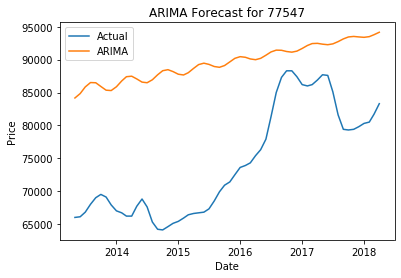

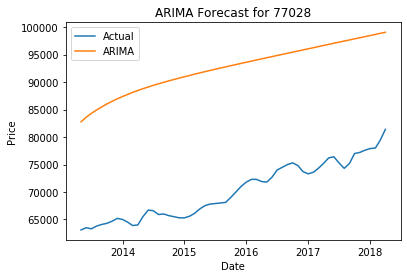

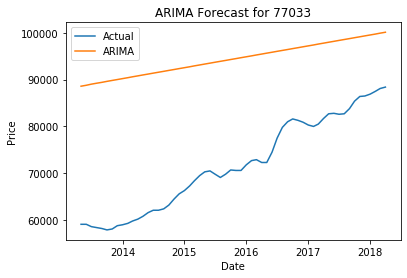

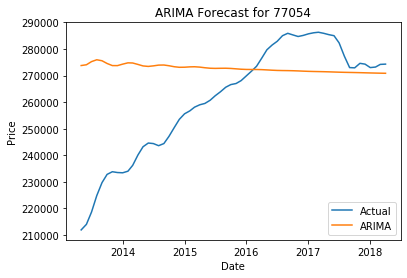

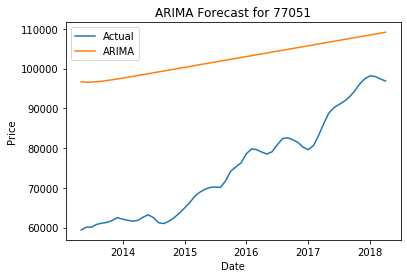

In [50]:
for i in harris_lowest_error:
    fig, ax = plt.subplots()
    ax = plt.plot(harris_data[i].index[-test_period:], harris_data[i]['Price'][-test_period:])
    ax = plt.plot(harris_data[i].index[-test_period:], harris_best_models[i]['forecast'][0])
    plt.title('ARIMA Forecast for '+ str(harris_zip_codes[i][0]))
    plt.legend(['Actual', 'ARIMA'])
    plt.xlabel('Date')
    plt.ylabel('Price')

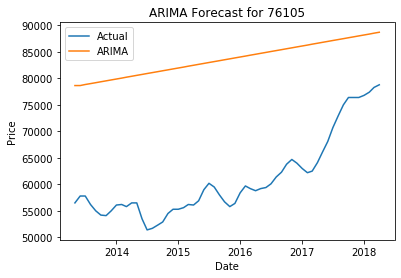

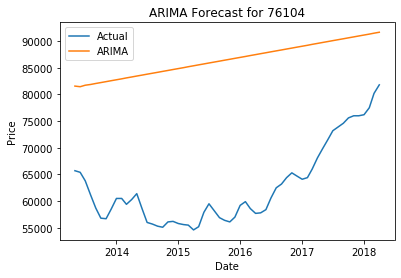

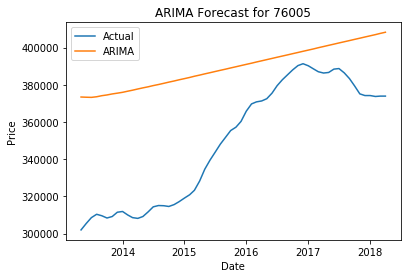

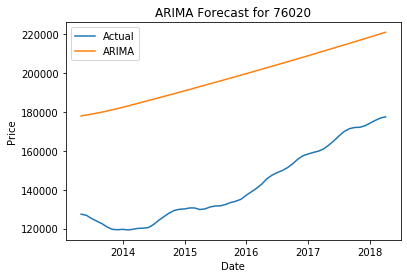

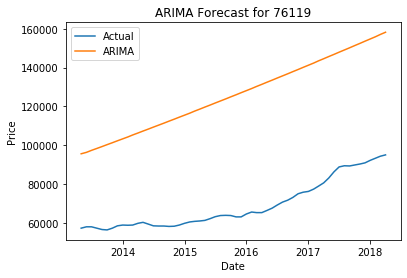

In [52]:
for i in tarrant_lowest_error:
    fig, ax = plt.subplots()
    ax = plt.plot(tarrant_data[i].index[-test_period:], tarrant_data[i]['Price'][-test_period:])
    ax = plt.plot(tarrant_data[i].index[-test_period:], tarrant_best_models[i]['forecast'][0])
    plt.title('ARIMA Forecast for '+ str(tarrant_zip_codes[i][0]))
    plt.legend(['Actual', 'ARIMA'])
    plt.xlabel('Date')
    plt.ylabel('Price')

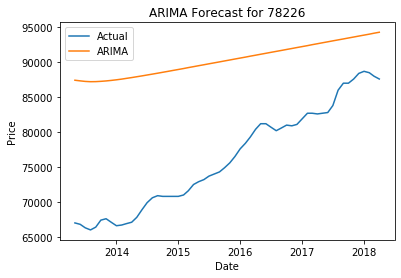

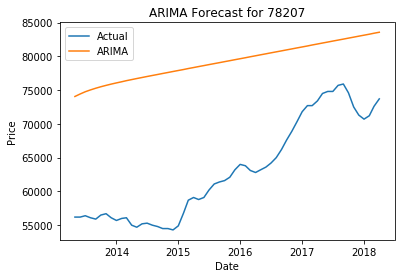

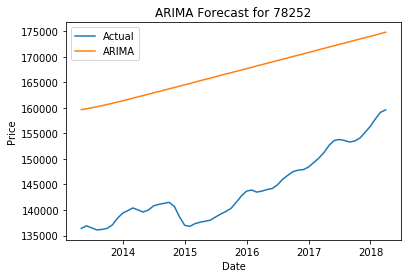

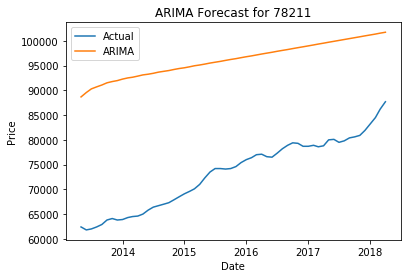

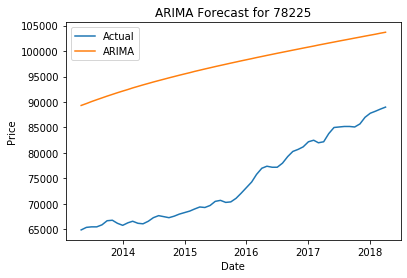

In [53]:
for i in bexar_lowest_error:
    fig, ax = plt.subplots()
    ax = plt.plot(bexar_data[i].index[-test_period:], bexar_data[i]['Price'][-test_period:])
    ax = plt.plot(bexar_data[i].index[-test_period:], bexar_best_models[i]['forecast'][0])
    plt.title('ARIMA Forecast for '+ str(bexar_zip_codes[i][0]))
    plt.legend(['Actual', 'ARIMA'])
    plt.xlabel('Date')
    plt.ylabel('Price')

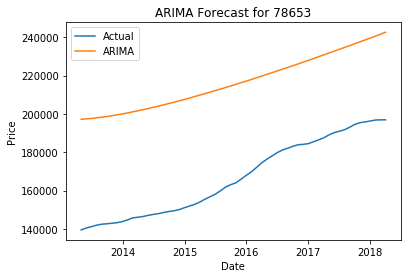

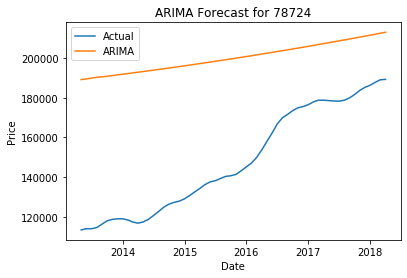

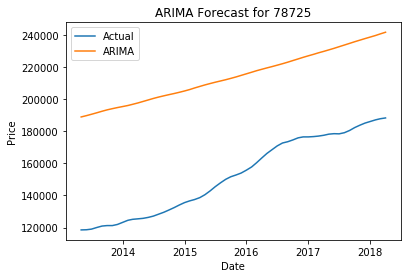

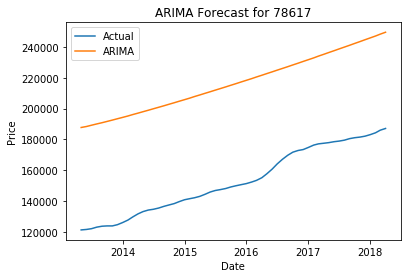

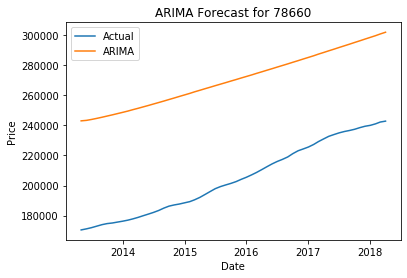

In [54]:
for i in travis_lowest_error:
    fig, ax = plt.subplots()
    ax = plt.plot(travis_data[i].index[-test_period:], travis_data[i]['Price'][-test_period:])
    ax = plt.plot(travis_data[i].index[-test_period:], travis_best_models[i]['forecast'][0])
    plt.title('ARIMA Forecast for '+ str(travis_zip_codes[i][0]))
    plt.legend(['Actual', 'ARIMA'])
    plt.xlabel('Date')
    plt.ylabel('Price')

In [61]:
def view_5_year_forecast(data, model, title):
    import pandas as pd
    for i in range(0,len(data)):
        last_date = pd.Timestamp(data[i].tail(1).index[0])
        five_years = []
        next_date = last_date + pd.offsets.MonthBegin()
        five_years.append(next_date)
        for x in range(1, 60):
            next_date = next_date + pd.offsets.MonthBegin()
            five_years.append(next_date)
        model_data = model[i]['forecast'][0]
        df = pd.DataFrame()
        df['Price'] = model_data
        df.index = five_years
        fig, ax = plt.subplots()
        ax = plt.plot(data[i], label='Observed')
        ax = plt.plot(df, label='Forecast')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.title('Projections for ' + str(title[i][0]));

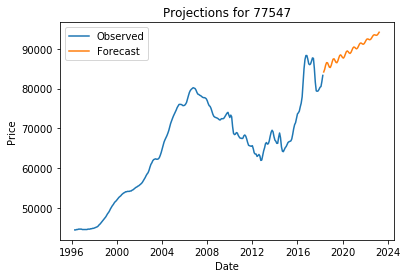

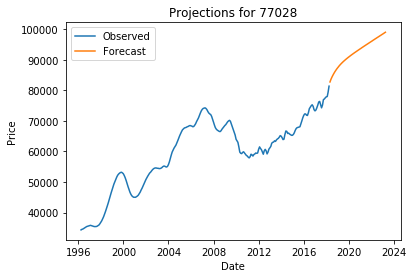

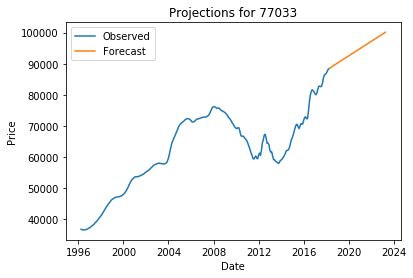

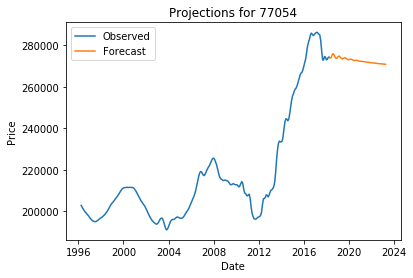

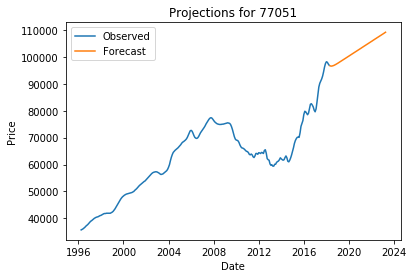

In [62]:
harris_data_lowest_error = [harris_data[i]['Price'] for i in harris_lowest_error]
harris_best_models_lowest_error = [harris_best_models[i] for i in harris_lowest_error]
harris_zip_codes_lowest_error = [harris_zip_codes[i] for i in harris_lowest_error]
view_5_year_forecast(harris_data_lowest_error, harris_best_models_lowest_error, harris_zip_codes_lowest_error)

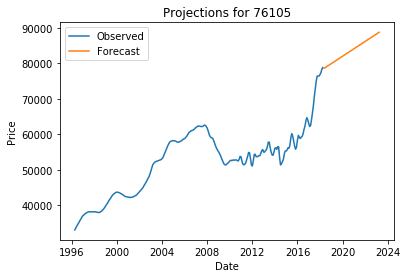

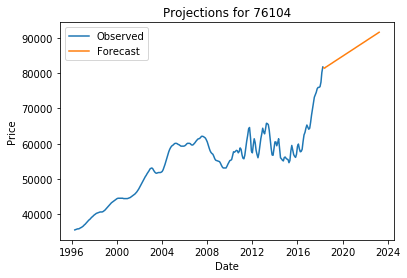

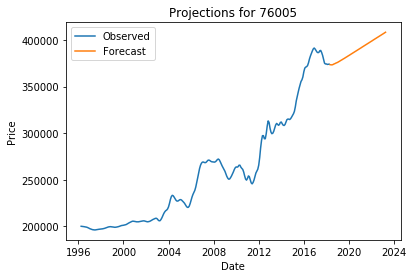

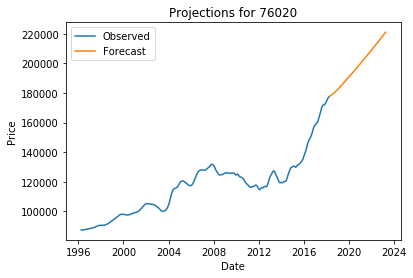

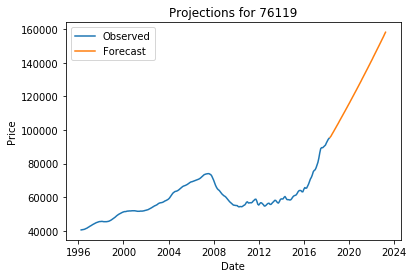

In [63]:
tarrant_data_lowest_error = [tarrant_data[i]['Price'] for i in tarrant_lowest_error]
tarrant_best_models_lowest_error = [tarrant_best_models[i] for i in tarrant_lowest_error]
tarrant_zip_codes_lowest_error = [tarrant_zip_codes[i] for i in tarrant_lowest_error]
view_5_year_forecast(tarrant_data_lowest_error, tarrant_best_models_lowest_error, tarrant_zip_codes_lowest_error)

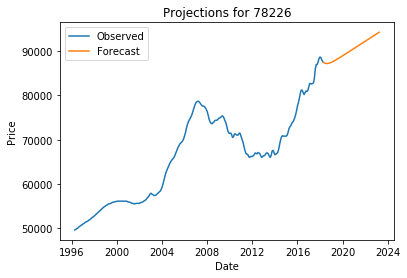

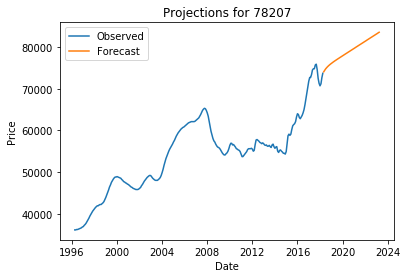

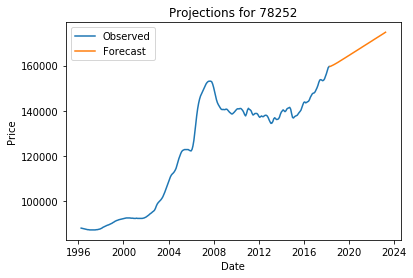

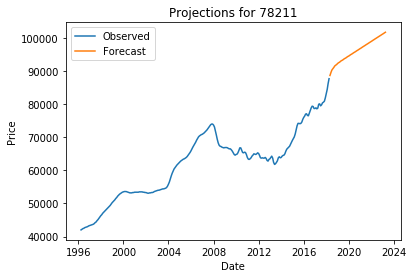

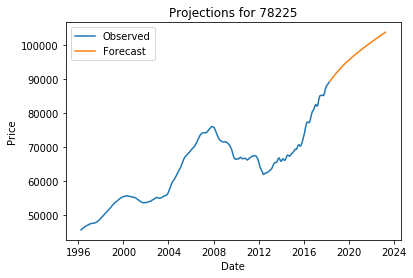

In [64]:
bexar_data_lowest_error = [bexar_data[i]['Price'] for i in bexar_lowest_error]
bexar_best_models_lowest_error = [bexar_best_models[i] for i in bexar_lowest_error]
bexar_zip_codes_lowest_error = [bexar_zip_codes[i] for i in bexar_lowest_error]
view_5_year_forecast(bexar_data_lowest_error, bexar_best_models_lowest_error, bexar_zip_codes_lowest_error)

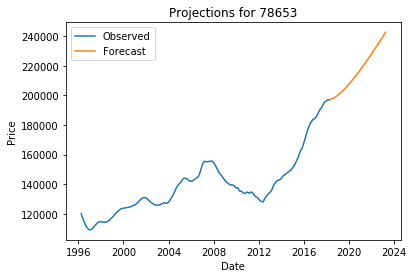

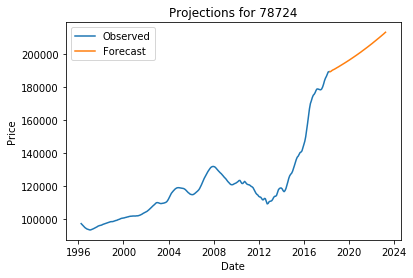

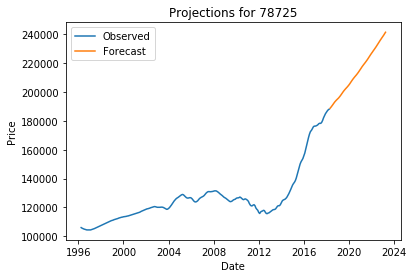

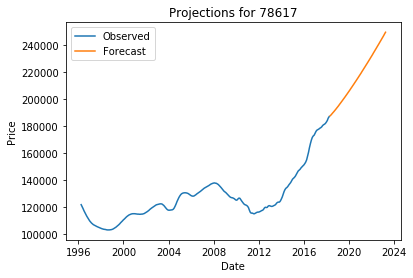

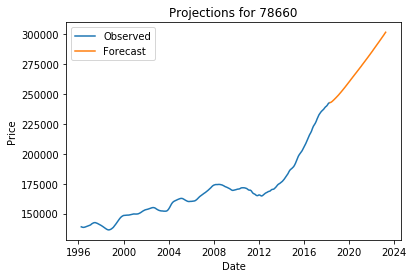

In [65]:
travis_data_lowest_error = [travis_data[i]['Price'] for i in travis_lowest_error]
travis_best_models_lowest_error = [travis_best_models[i] for i in travis_lowest_error]
travis_zip_codes_lowest_error = [travis_zip_codes[i] for i in travis_lowest_error]
view_5_year_forecast(travis_data_lowest_error, travis_best_models_lowest_error, travis_zip_codes_lowest_error)

In [ ]:
# References
# https://stackoverflow.com/questions/51734180/converting-statsmodels-summary-object-to-pandas-dataframe
# https://www.digitalocean.com/community/tutorials/a-guide-to-time-series-forecasting-with-arima-in-python-3